In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
import numpy as np

import torchvision.utils as vutils
import os

import librosa
import numpy as np
from glob import glob
from torch.utils.data import DataLoader, TensorDataset  

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np
import glob
import os

# Set random seed for reproducibility
manualSeed = 6789
torch.manual_seed(manualSeed)
np.random.seed(manualSeed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(manualSeed)

# Generator shared layers
# Generator shared layers
class GeneratorSharedLayers(nn.Module):
    def __init__(self, ngf, nc, mel_bins, time_frames):
        super(GeneratorSharedLayers, self).__init__()
        self.main = nn.Sequential(
            # Input: (ngf * 8, mel_bins // 8, time_frames // 8)
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),  # Upsample to (mel_bins // 4, time_frames // 4)
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),  # Upsample to (mel_bins // 2, time_frames // 2)
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, nc, 4, 2, 1, bias=False),       # Upsample to (mel_bins, time_frames)
            nn.Tanh()
        )




    def forward(self, input):
        return self.main(input)

# Generator with unique input layer and shared layers
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc, shared_layers, mel_bins, time_frames):
        super(Generator, self).__init__()
        self.ngf = ngf
        self.mel_bins = mel_bins
        self.time_frames = time_frames
        self.input_layer = nn.Sequential(
            nn.Linear(nz, ngf * 8 * (mel_bins // 8) * (time_frames // 8)),
            nn.BatchNorm1d(ngf * 8 * (mel_bins // 8) * (time_frames // 8)),
            nn.ReLU(True)
        )
        self.shared_layers = shared_layers

    def forward(self, input):
        x = self.input_layer(input)
        x = x.view(-1, self.ngf * 8, self.mel_bins // 8, self.time_frames // 8)
        x = self.shared_layers(x)
        return x



# Discriminator shared layers
# Discriminator shared layers
class DiscriminatorSharedLayers(nn.Module):
    def __init__(self, ndf, nc):
        super(DiscriminatorSharedLayers, self).__init__()
        self.main = nn.Sequential(
            # Input: (nc, mel_bins, time_frames)
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),          # Output: (ndf, 32, 64)
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),     # Output: (ndf*2, 16, 32)
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False), # Output: (ndf*4, 8, 16)
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
        )



    def forward(self, input):
        return self.main(input)
    
class Discriminator(nn.Module):
    def __init__(self, ndf, nc, shared_layers, num_gens, mel_bins, time_frames):
        super(Discriminator, self).__init__()
        self.shared_layers = shared_layers
        self.num_gens = num_gens

        # The spatial dimensions after the shared layers are (8, 16)
        self.output_bin = nn.Sequential(
            nn.Conv2d(ndf * 4, 1, kernel_size=(8, 16), stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )
        self.output_mul = nn.Sequential(
            nn.Conv2d(ndf * 4, num_gens, kernel_size=(8, 16), stride=1, padding=0, bias=False)
        )

    def forward(self, input):
        x = self.shared_layers(input)
        # x has shape: (batch_size, ndf*4, 8, 16)

        # Apply output layers
        output_bin = self.output_bin(x)  # Shape: (batch_size, 1, 1, 1)
        output_bin = output_bin.view(-1)  # Shape: (batch_size,)

        output_mul = self.output_mul(x)  # Shape: (batch_size, num_gens, 1, 1)
        output_mul = output_mul.view(-1, self.num_gens)  # Shape: (batch_size, num_gens)

        return output_bin, output_mul


# Updated MGAN Class
class MGAN:
    def __init__(self, num_z, beta, num_gens, batch_size, z_prior, learning_rate,
                 num_epochs, img_size, num_gen_feature_maps, num_dis_feature_maps,
                 sample_dir, device):
        self.num_z = num_z
        self.beta = beta
        self.num_gens = num_gens
        self.batch_size = batch_size
        self.z_prior = z_prior
        self.learning_rate = learning_rate
        self.num_epochs = num_epochs
        self.img_size = img_size
        self.ngf = num_gen_feature_maps
        self.ndf = num_dis_feature_maps
        self.sample_dir = sample_dir
        self.device = device

        self.mel_bins, self.num_frames, self.num_channels = img_size
        self.history = {'d_loss': [], 'g_loss': []}

        self._build_model()

    def _build_model(self):
        mel_bins, time_frames, num_channels = self.img_size

        self.shared_gen_layers = GeneratorSharedLayers(self.ngf, num_channels, mel_bins, time_frames).to(self.device)
        self.generators = nn.ModuleList([
            Generator(self.num_z, self.ngf, num_channels, self.shared_gen_layers, mel_bins, time_frames).to(self.device)
            for _ in range(self.num_gens)
        ])
        self.shared_dis_layers = DiscriminatorSharedLayers(self.ndf, num_channels).to(self.device)
        self.discriminator = Discriminator(self.ndf, num_channels, self.shared_dis_layers, self.num_gens, mel_bins, time_frames).to(self.device)

        self.optimizerD = optim.Adam(
            list(self.discriminator.parameters()) + list(self.shared_dis_layers.parameters()),
            lr=self.learning_rate, betas=(0.5, 0.999)
        )
        gen_params = [param for gen in self.generators for param in gen.input_layer.parameters()]
        gen_params += list(self.shared_gen_layers.parameters())
        self.optimizerG = optim.Adam(gen_params, lr=self.learning_rate, betas=(0.5, 0.999))

        self.criterion_bin = nn.BCELoss()
        self.criterion_mul = nn.CrossEntropyLoss()

    def fit(self, trainloader):
        fixed_noise = self._sample_z(self.num_gens * 16).to(self.device)

        real_label = 1.0
        fake_label = 0.0

        for epoch in range(self.num_epochs):
            for i, data in enumerate(trainloader):
                ############################
                # (1) Update Discriminator #
                ############################
                real_images = data[0].to(self.device)
                b_size = real_images.size(0)
                label_real = torch.full((b_size,), real_label, device=self.device)

                # Zero the discriminator's gradients
                self.optimizerD.zero_grad()

                # Forward pass real images through the discriminator
                output_bin_real, _ = self.discriminator(real_images)
                d_bin_real_loss = self.criterion_bin(output_bin_real, label_real)

                # Generate fake images and corresponding labels
                fake_images = []
                gen_labels = []

                batch_per_gen = b_size // self.num_gens
                if batch_per_gen == 0:
                    batch_per_gen = 1

                for idx, gen in enumerate(self.generators):
                    z = self._sample_z(batch_per_gen).to(self.device)
                    fake_imgs = gen(z)
                    fake_images.append(fake_imgs)
                    gen_labels.append(torch.full((fake_imgs.size(0),), idx, dtype=torch.long, device=self.device))

                fake_images = torch.cat(fake_images, 0)
                gen_labels = torch.cat(gen_labels, 0)

                # Forward pass fake images through the discriminator
                output_bin_fake, output_mul_fake = self.discriminator(fake_images.detach())

                # Compute discriminator losses
                label_fake = torch.full((output_bin_fake.size(0),), fake_label, device=self.device)
                d_bin_fake_loss = self.criterion_bin(output_bin_fake, label_fake)
                d_mul_loss = self.criterion_mul(output_mul_fake, gen_labels)

                d_loss = d_bin_real_loss + d_bin_fake_loss + d_mul_loss * self.beta
                d_loss.backward()
                self.optimizerD.step()

                ##########################
                # (2) Update Generators #
                ##########################
                # Zero the generators' gradients
                self.optimizerG.zero_grad()

                # Forward pass fake images through the discriminator
                label_real = torch.full((output_bin_fake.size(0),), real_label, device=self.device)
                output_bin_fake, output_mul_fake = self.discriminator(fake_images)
                g_bin_loss = self.criterion_bin(output_bin_fake, label_real)
                g_mul_loss = self.criterion_mul(output_mul_fake, gen_labels) * self.beta

                g_loss = g_bin_loss + g_mul_loss
                g_loss.backward()
                self.optimizerG.step()

                # Save losses for plotting
                self.history['d_loss'].append(d_loss.item())
                self.history['g_loss'].append(g_loss.item())

                # (Optional) Print losses
                print(f"Batch [{i+1}] - D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")


                print(f"[{epoch+1}/{self.num_epochs}] D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

            
            # Save samples every few epochs
            if (epoch + 1) % 5 == 0:
                self._save_samples(epoch + 1, fixed_noise)

            # Plot generated samples from each generator
            print(f"Epoch {epoch+1}: Generating samples from each generator for visualization...")
            with torch.no_grad():
                for idx, gen in enumerate(self.generators):
                    gen.eval()
                    z = self._sample_z(1).to(self.device)  # Generate one sample per generator
                    fake_img = gen(z).cpu()
                    gen.train()

                    # Denormalize the generated image to [0, 1] range
                    fake_img_denorm = (fake_img + 1) / 2.0

                    # Print statistics
                    print(f"Generator {idx+1} sample statistics:")
                    print(f"  Min: {fake_img_denorm.min().item():.4f}, Max: {fake_img_denorm.max().item():.4f}, Mean: {fake_img_denorm.mean().item():.4f}")

                    # Plot the generated Mel spectrogram
                    plot_mel_spectrogram(fake_img_denorm[0], title=f"Generated Mel Spectrogram - Generator {idx+1}")

            # Plot a real sample for comparison
            real_sample = data[0][0].cpu()  # Get the first real sample from the last batch
            real_sample_denorm = (real_sample + 1) / 2.0
            print("Real sample statistics:")
            print(f"  Min: {real_sample_denorm.min().item():.4f}, Max: {real_sample_denorm.max().item():.4f}, Mean: {real_sample_denorm.mean().item():.4f}")
            plot_mel_spectrogram(real_sample_denorm, title="Real Mel Spectrogram")

        # Plot loss history after training
        self._plot_history()

    def _sample_z(self, size):
        if self.z_prior == "uniform":
            return torch.rand(size, self.num_z) * 2 - 1
        return torch.randn(size, self.num_z)

    def _save_samples(self, epoch, fixed_noise):
        with torch.no_grad():
            fake_images = []
            for idx, gen in enumerate(self.generators):
                noise = fixed_noise[idx * 16:(idx + 1) * 16].to(self.device)
                gen.eval()
                fake_imgs = gen(noise)
                gen.train()
                fake_images.append(fake_imgs)

            fake_images = torch.cat(fake_images, 0)
            fake_images = (fake_images + 1) / 2.0
            os.makedirs(self.sample_dir, exist_ok=True)
            sample_path = os.path.join(self.sample_dir, f"epoch_{epoch:04d}.png")
            vutils.save_image(fake_images, sample_path, nrow=16, padding=2, normalize=True)
            print(f"Saved samples to {sample_path}")

            if fake_images.shape[0] > 0:  # Ensure there's at least one sample
                mel_spectrogram = fake_images[0, 0].cpu().numpy()  # Take the first sample, remove channel dim
                output_audio_path = os.path.join(self.sample_dir, f"epoch_{epoch:04d}_sample.wav")
                save_audio_from_spectrogram(mel_spectrogram, output_audio_path, sr=16000)
                print(f"Saved audio sample to {output_audio_path}")

    def _plot_history(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.history['d_loss'], label="D Loss")
        plt.plot(self.history['g_loss'], label="G Loss")
        plt.title("Loss During Training")
        plt.xlabel("Iterations")
        plt.ylabel("Loss")
        plt.legend()
        plt.show()



In [3]:
import os
import torch
from torch.utils.data import TensorDataset
import librosa
import numpy as np
import glob

def librispeech_to_mel(root_dir, target_sr=16000, n_mels=64, n_fft=1024, hop_length=512, target_length=128):
    """
    Convert raw LibriSpeech audio files to Mel spectrograms and return a TensorDataset.
    """
    flac_files = glob.glob(os.path.join(root_dir, '**', '*.flac'), recursive=True)
    mel_spectrograms = []

    if len(flac_files) == 0:
        raise ValueError(f"No FLAC files found in directory: {root_dir}")

    for file in flac_files:
        try:
            # Load the audio file
            audio, sr = librosa.load(file, sr=target_sr)
            audio = audio / np.max(np.abs(audio))  # Normalize audio to [-1, 1]
            
            # Convert to Mel spectrogram
            mel_spec = librosa.feature.melspectrogram(y=audio, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
            mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

            # Normalize using fixed range [-40, 0] to [-1, 1]
            mel_spec_db = (mel_spec_db + 40) / 40  # Normalize to [0, 1]
            mel_spec_db = mel_spec_db * 2 - 1      # Scale to [-1, 1]

            # Ensure the Mel spectrogram has a fixed length
            if mel_spec_db.shape[1] < target_length:
                pad_width = target_length - mel_spec_db.shape[1]
                mel_spec_db = np.pad(mel_spec_db, ((0, 0), (0, pad_width)), mode='constant')
            else:
                mel_spec_db = mel_spec_db[:, :target_length]

            mel_tensor = torch.tensor(mel_spec_db, dtype=torch.float32).unsqueeze(0)  # Add channel dim
            mel_spectrograms.append(mel_tensor)

        except Exception as e:
            print(f"Error processing file {file}: {e}")

    if len(mel_spectrograms) == 0:
        raise ValueError("No valid audio files were processed into Mel spectrograms.")

    mel_spectrograms = torch.stack(mel_spectrograms)  # Shape: [num_samples, 1, n_mels, target_length]
    return TensorDataset(mel_spectrograms)



In [4]:
import librosa
import librosa.display
import numpy as np
import soundfile as sf

def mel_to_audio(mel_spectrogram, sr=16000, n_fft=1024, hop_length=512, n_iter=100):
    """
    Convert a Mel spectrogram back to an audio waveform.
    
    Parameters:
    - mel_spectrogram (np.ndarray): The Mel spectrogram (in dB or power format).
    - sr (int): Sample rate of the audio.
    - n_fft (int): Number of FFT components.
    - hop_length (int): Hop length for STFT.
    - n_iter (int): Number of iterations for Griffin-Lim algorithm.
    
    Returns:
    - audio (np.ndarray): Reconstructed audio waveform.
    """
    # Ensure the spectrogram is in power format (if it's in dB, convert it back)
    if mel_spectrogram.max() > 1.0:  # Assuming input is in dB format
        mel_spectrogram = librosa.db_to_power(mel_spectrogram)

    # Convert Mel spectrogram to linear spectrogram
    mel_basis = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=mel_spectrogram.shape[0])
    inv_mel_basis = np.linalg.pinv(mel_basis)  # Invert the Mel filter
    linear_spectrogram = np.dot(inv_mel_basis, mel_spectrogram)

    # Reconstruct the audio waveform using Griffin-Lim algorithm
    audio = librosa.griffinlim(linear_spectrogram, hop_length=hop_length, n_iter=n_iter)

    return audio

def save_audio_from_spectrogram(mel_spectrogram, output_path, sr=16000, n_fft=1024, hop_length=512, n_iter=100):
    """
    Convert a Mel spectrogram to an audio file and save it.
    
    Parameters:
    - mel_spectrogram (np.ndarray): The Mel spectrogram (in dB or power format).
    - output_path (str): Path to save the audio file.
    - sr (int): Sample rate of the audio.
    - n_fft (int): Number of FFT components.
    - hop_length (int): Hop length for STFT.
    - n_iter (int): Number of iterations for Griffin-Lim algorithm.
    """
    audio = mel_to_audio(mel_spectrogram, sr=sr, n_fft=n_fft, hop_length=hop_length, n_iter=n_iter)
    sf.write(output_path, audio, sr)
    print(f"Audio saved to {output_path}")
def plot_mel_spectrogram(mel_spectrogram, title="Mel Spectrogram"):
    """
    Plot a Mel spectrogram.
    """
    mel_spectrogram = mel_spectrogram.squeeze(0).numpy()  # Remove channel dimension if present
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mel_spectrogram, sr=16000, hop_length=512, x_axis='time', y_axis='mel', cmap='coolwarm')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Mel Frequency")
    plt.show()



Using device: cuda
Preprocessing dataset into Mel spectrograms...
Total number of training samples: 2703
Starting training...


/media/tameszaza/My Passport/ml/.venv/lib/python3.12/site-packages/torch/_compile.py:32: UserWarning: optimizer contains a parameter group with duplicate parameters; in future, this will cause an error; see github.com/pytorch/pytorch/issues/40967 for more information
  return disable_fn(*args, **kwargs)


Batch [1] - D Loss: 1.8540, G Loss: 1.9485
[1/50] D Loss: 1.8540, G Loss: 1.9485
Batch [2] - D Loss: 1.6550, G Loss: 3.3384
[1/50] D Loss: 1.6550, G Loss: 3.3384
Batch [3] - D Loss: 1.1939, G Loss: 3.7612
[1/50] D Loss: 1.1939, G Loss: 3.7612
Batch [4] - D Loss: 1.0555, G Loss: 4.2091
[1/50] D Loss: 1.0555, G Loss: 4.2091
Batch [5] - D Loss: 1.0432, G Loss: 5.0189
[1/50] D Loss: 1.0432, G Loss: 5.0189
Batch [6] - D Loss: 1.0216, G Loss: 5.9384
[1/50] D Loss: 1.0216, G Loss: 5.9384
Batch [7] - D Loss: 0.8410, G Loss: 5.2129
[1/50] D Loss: 0.8410, G Loss: 5.2129
Batch [8] - D Loss: 0.8631, G Loss: 5.4138
[1/50] D Loss: 0.8631, G Loss: 5.4138
Batch [9] - D Loss: 0.7051, G Loss: 6.1765
[1/50] D Loss: 0.7051, G Loss: 6.1765
Batch [10] - D Loss: 0.7540, G Loss: 6.2804
[1/50] D Loss: 0.7540, G Loss: 6.2804
Batch [11] - D Loss: 0.8966, G Loss: 6.3728
[1/50] D Loss: 0.8966, G Loss: 6.3728
Batch [12] - D Loss: 0.8505, G Loss: 6.5177
[1/50] D Loss: 0.8505, G Loss: 6.5177
Batch [13] - D Loss: 0.85

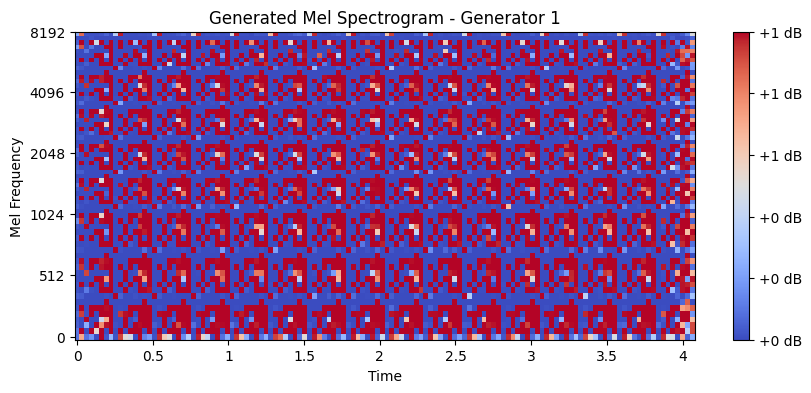

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4365


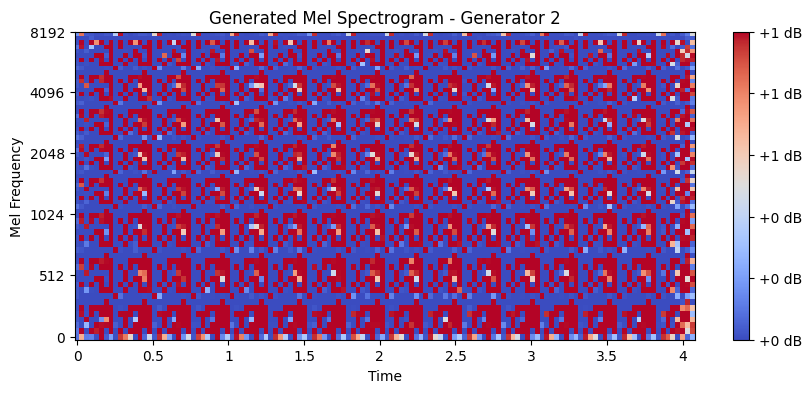

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4305


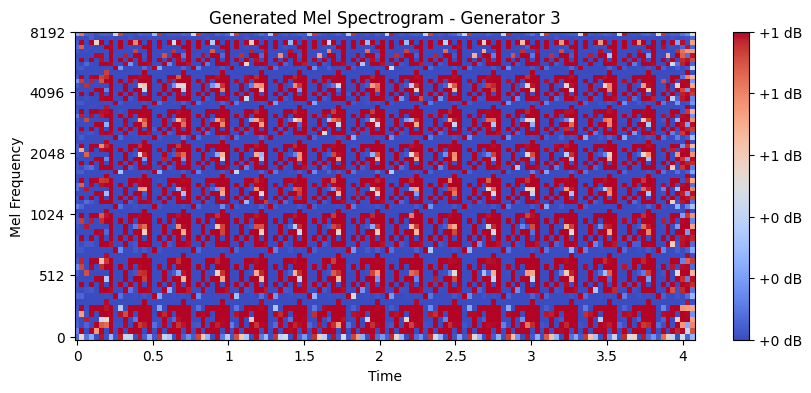

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.3240


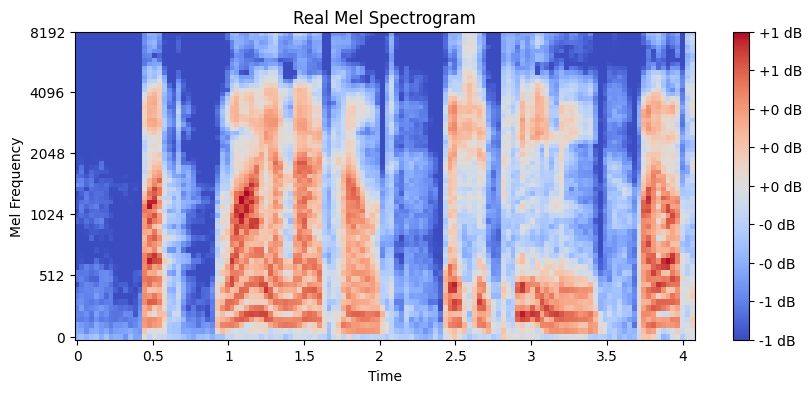

Batch [1] - D Loss: 0.9339, G Loss: 6.7218
[2/50] D Loss: 0.9339, G Loss: 6.7218
Batch [2] - D Loss: 1.0869, G Loss: 6.9865
[2/50] D Loss: 1.0869, G Loss: 6.9865
Batch [3] - D Loss: 0.9220, G Loss: 6.6972
[2/50] D Loss: 0.9220, G Loss: 6.6972
Batch [4] - D Loss: 1.2570, G Loss: 7.2633
[2/50] D Loss: 1.2570, G Loss: 7.2633
Batch [5] - D Loss: 1.1119, G Loss: 7.6060
[2/50] D Loss: 1.1119, G Loss: 7.6060
Batch [6] - D Loss: 0.8888, G Loss: 7.2500
[2/50] D Loss: 0.8888, G Loss: 7.2500
Batch [7] - D Loss: 0.8285, G Loss: 7.1798
[2/50] D Loss: 0.8285, G Loss: 7.1798
Batch [8] - D Loss: 0.7966, G Loss: 6.4636
[2/50] D Loss: 0.7966, G Loss: 6.4636
Batch [9] - D Loss: 0.6313, G Loss: 6.6034
[2/50] D Loss: 0.6313, G Loss: 6.6034
Batch [10] - D Loss: 0.7681, G Loss: 6.4430
[2/50] D Loss: 0.7681, G Loss: 6.4430
Batch [11] - D Loss: 0.5659, G Loss: 6.6927
[2/50] D Loss: 0.5659, G Loss: 6.6927
Batch [12] - D Loss: 0.5854, G Loss: 6.7167
[2/50] D Loss: 0.5854, G Loss: 6.7167
Batch [13] - D Loss: 0.62

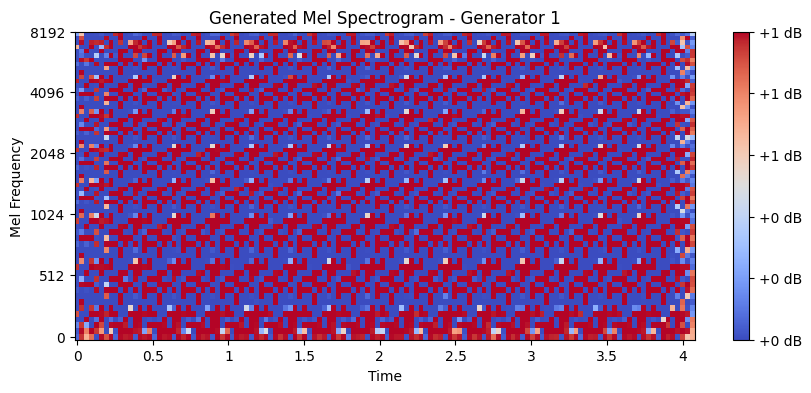

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4351


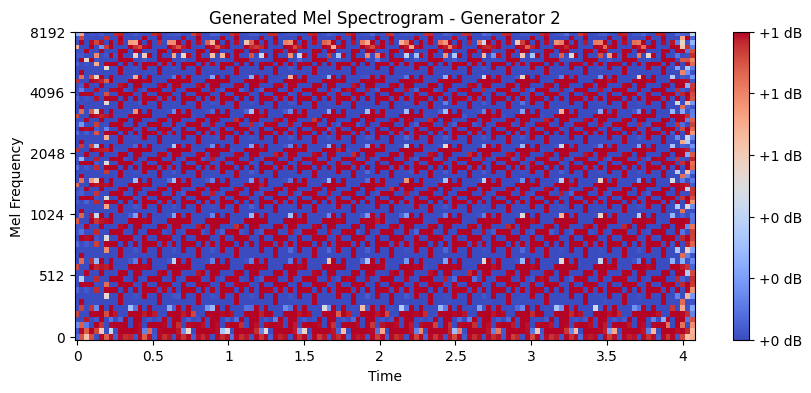

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4370


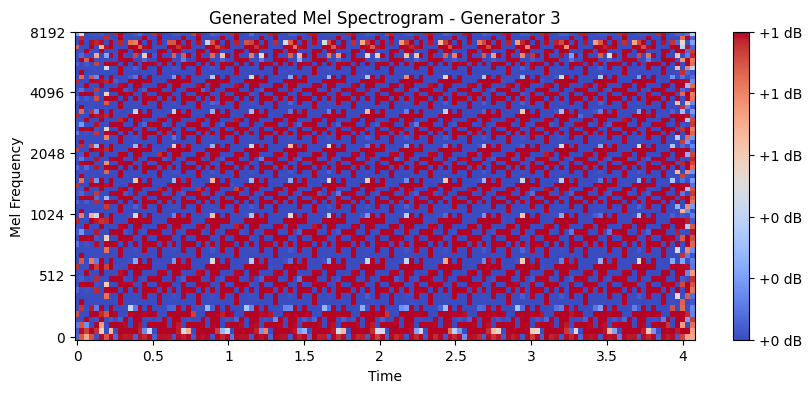

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.0396


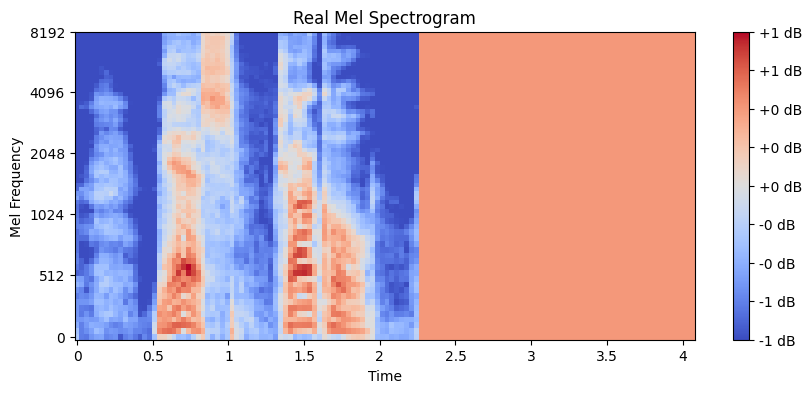

Batch [1] - D Loss: 1.3911, G Loss: 8.2929
[3/50] D Loss: 1.3911, G Loss: 8.2929
Batch [2] - D Loss: 0.8182, G Loss: 7.9645
[3/50] D Loss: 0.8182, G Loss: 7.9645
Batch [3] - D Loss: 0.8309, G Loss: 7.7976
[3/50] D Loss: 0.8309, G Loss: 7.7976
Batch [4] - D Loss: 0.7670, G Loss: 7.5654
[3/50] D Loss: 0.7670, G Loss: 7.5654
Batch [5] - D Loss: 0.7420, G Loss: 7.4247
[3/50] D Loss: 0.7420, G Loss: 7.4247
Batch [6] - D Loss: 0.8103, G Loss: 7.3722
[3/50] D Loss: 0.8103, G Loss: 7.3722
Batch [7] - D Loss: 0.7385, G Loss: 7.4898
[3/50] D Loss: 0.7385, G Loss: 7.4898
Batch [8] - D Loss: 0.8526, G Loss: 7.3291
[3/50] D Loss: 0.8526, G Loss: 7.3291
Batch [9] - D Loss: 0.7831, G Loss: 7.5998
[3/50] D Loss: 0.7831, G Loss: 7.5998
Batch [10] - D Loss: 0.8992, G Loss: 7.4478
[3/50] D Loss: 0.8992, G Loss: 7.4478
Batch [11] - D Loss: 0.8695, G Loss: 7.8412
[3/50] D Loss: 0.8695, G Loss: 7.8412
Batch [12] - D Loss: 0.9057, G Loss: 8.0511
[3/50] D Loss: 0.9057, G Loss: 8.0511
Batch [13] - D Loss: 0.81

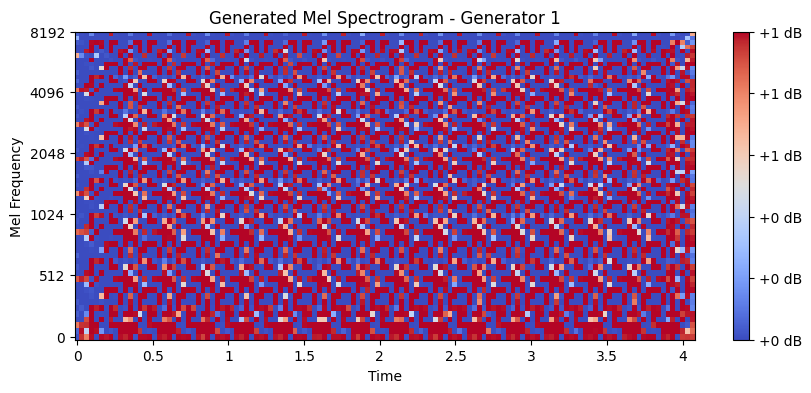

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4703


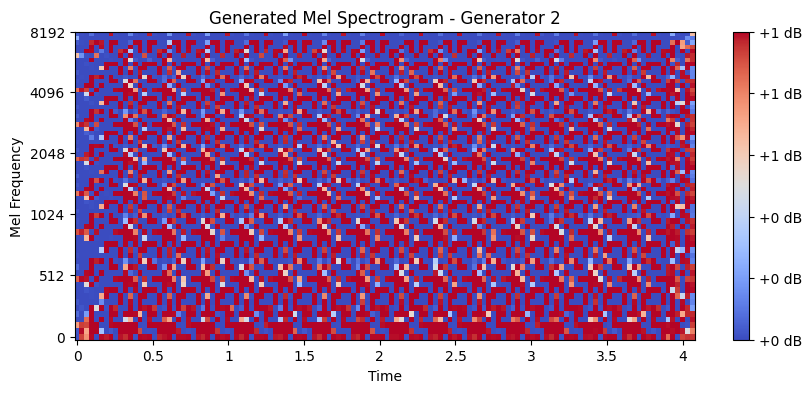

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4678


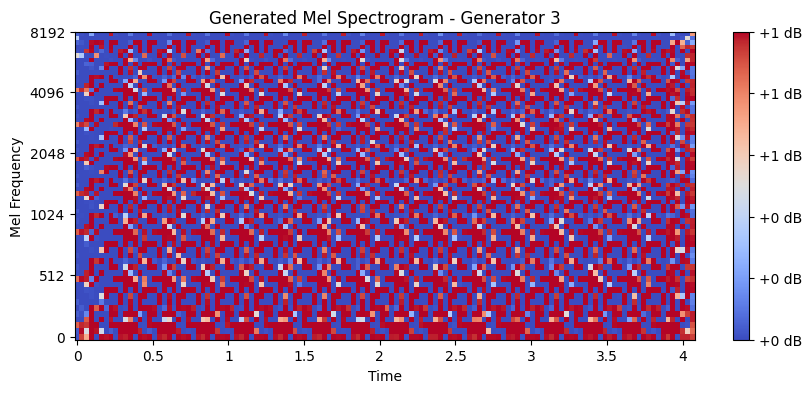

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2760


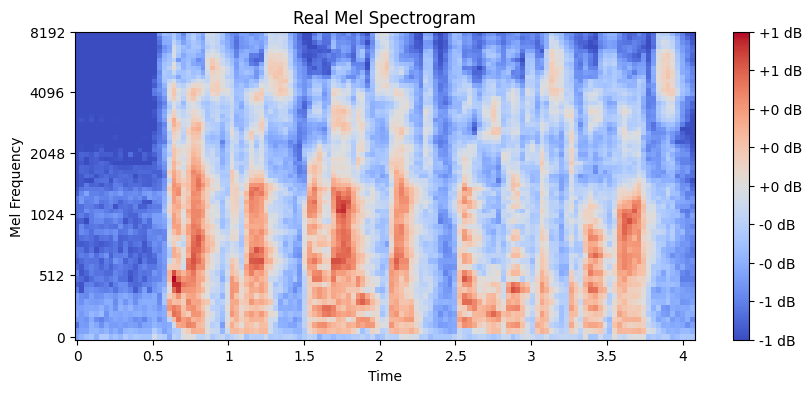

Batch [1] - D Loss: 0.5691, G Loss: 7.1431
[4/50] D Loss: 0.5691, G Loss: 7.1431
Batch [2] - D Loss: 0.5606, G Loss: 6.8659
[4/50] D Loss: 0.5606, G Loss: 6.8659
Batch [3] - D Loss: 0.5587, G Loss: 7.0291
[4/50] D Loss: 0.5587, G Loss: 7.0291
Batch [4] - D Loss: 0.5670, G Loss: 7.2986
[4/50] D Loss: 0.5670, G Loss: 7.2986
Batch [5] - D Loss: 0.6400, G Loss: 7.5168
[4/50] D Loss: 0.6400, G Loss: 7.5168
Batch [6] - D Loss: 0.7697, G Loss: 8.8599
[4/50] D Loss: 0.7697, G Loss: 8.8599
Batch [7] - D Loss: 1.0136, G Loss: 8.9807
[4/50] D Loss: 1.0136, G Loss: 8.9807
Batch [8] - D Loss: 0.7532, G Loss: 8.7004
[4/50] D Loss: 0.7532, G Loss: 8.7004
Batch [9] - D Loss: 1.0089, G Loss: 8.6441
[4/50] D Loss: 1.0089, G Loss: 8.6441
Batch [10] - D Loss: 0.9448, G Loss: 8.9161
[4/50] D Loss: 0.9448, G Loss: 8.9161
Batch [11] - D Loss: 1.1542, G Loss: 8.8440
[4/50] D Loss: 1.1542, G Loss: 8.8440
Batch [12] - D Loss: 1.1997, G Loss: 8.1772
[4/50] D Loss: 1.1997, G Loss: 8.1772
Batch [13] - D Loss: 1.17

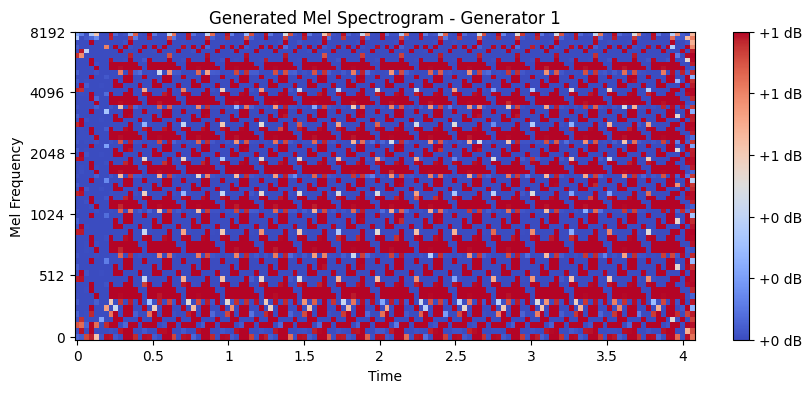

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4346


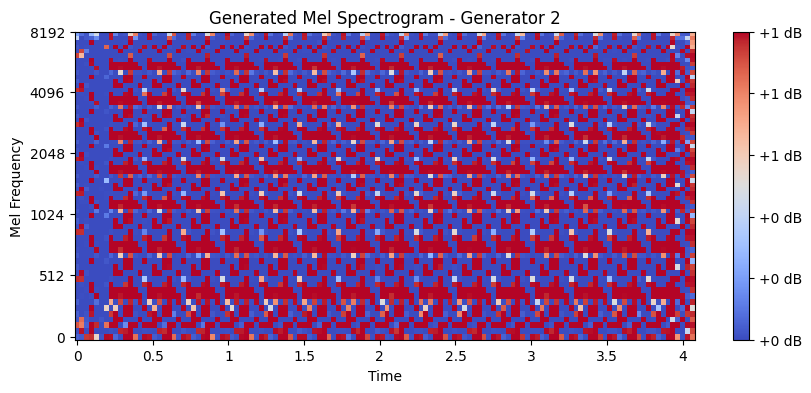

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4378


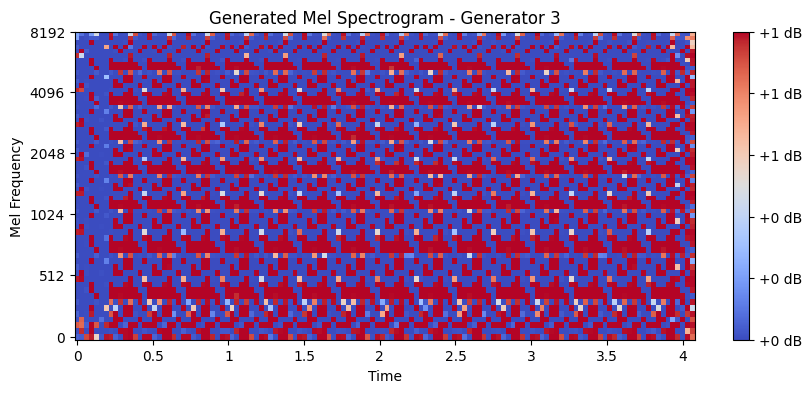

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1301


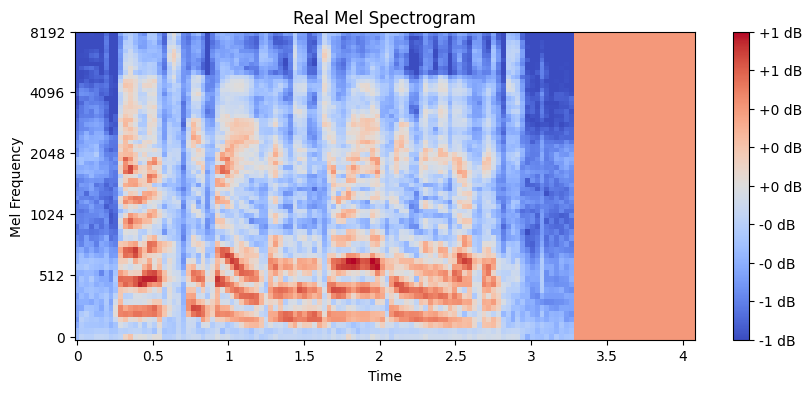

Batch [1] - D Loss: 1.0448, G Loss: 8.3513
[5/50] D Loss: 1.0448, G Loss: 8.3513
Batch [2] - D Loss: 1.0405, G Loss: 8.2201
[5/50] D Loss: 1.0405, G Loss: 8.2201
Batch [3] - D Loss: 0.8981, G Loss: 8.4188
[5/50] D Loss: 0.8981, G Loss: 8.4188
Batch [4] - D Loss: 0.8739, G Loss: 8.5410
[5/50] D Loss: 0.8739, G Loss: 8.5410
Batch [5] - D Loss: 0.7661, G Loss: 8.5395
[5/50] D Loss: 0.7661, G Loss: 8.5395
Batch [6] - D Loss: 0.7371, G Loss: 7.7028
[5/50] D Loss: 0.7371, G Loss: 7.7028
Batch [7] - D Loss: 0.7277, G Loss: 7.3151
[5/50] D Loss: 0.7277, G Loss: 7.3151
Batch [8] - D Loss: 0.6850, G Loss: 7.3950
[5/50] D Loss: 0.6850, G Loss: 7.3950
Batch [9] - D Loss: 0.6815, G Loss: 7.6189
[5/50] D Loss: 0.6815, G Loss: 7.6189
Batch [10] - D Loss: 0.6650, G Loss: 7.7400
[5/50] D Loss: 0.6650, G Loss: 7.7400
Batch [11] - D Loss: 0.6699, G Loss: 7.8368
[5/50] D Loss: 0.6699, G Loss: 7.8368
Batch [12] - D Loss: 0.6926, G Loss: 7.8807
[5/50] D Loss: 0.6926, G Loss: 7.8807
Batch [13] - D Loss: 0.65

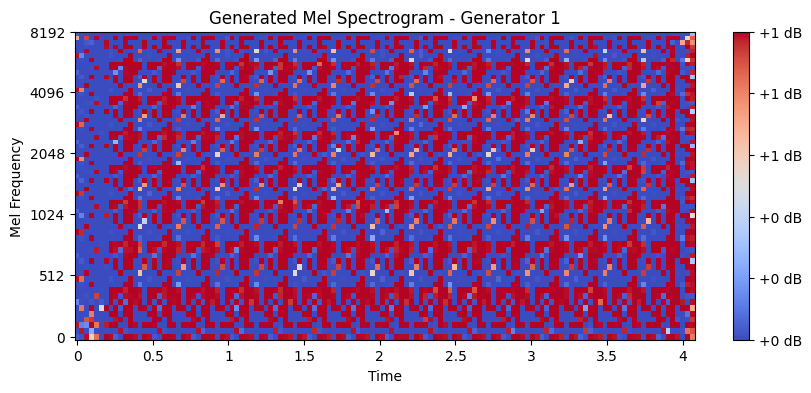

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4382


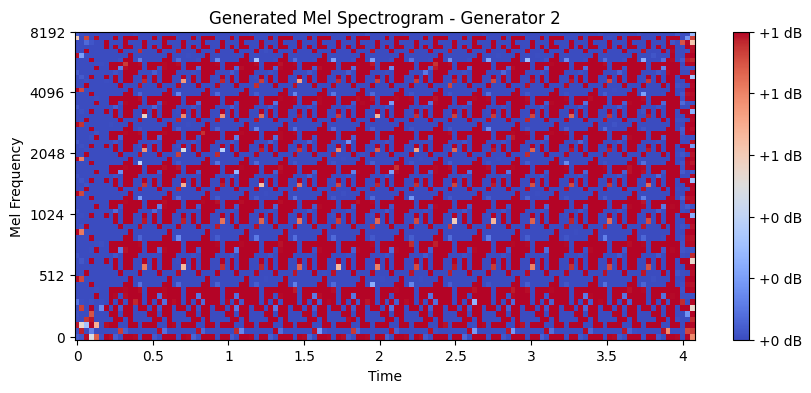

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4364


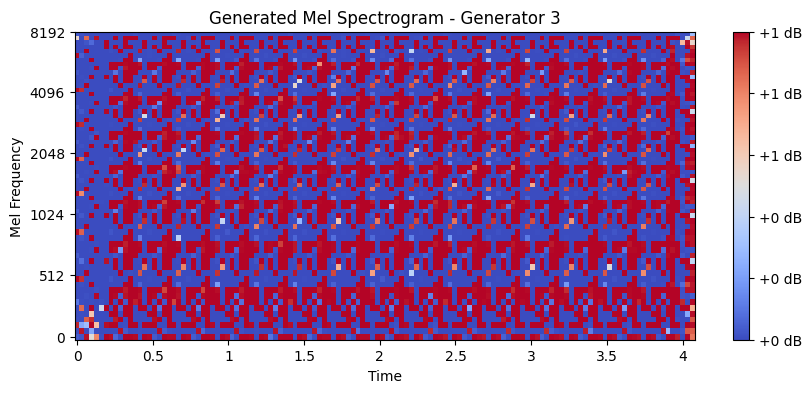

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.0168


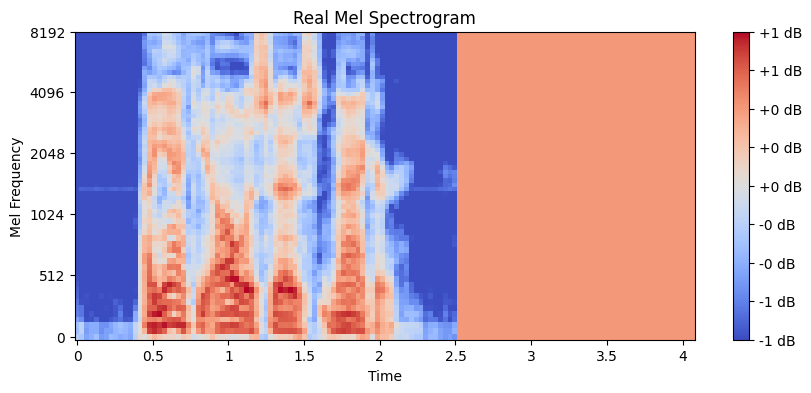

Batch [1] - D Loss: 0.5653, G Loss: 7.9779
[6/50] D Loss: 0.5653, G Loss: 7.9779
Batch [2] - D Loss: 0.5578, G Loss: 7.4036
[6/50] D Loss: 0.5578, G Loss: 7.4036
Batch [3] - D Loss: 0.5597, G Loss: 7.2293
[6/50] D Loss: 0.5597, G Loss: 7.2293
Batch [4] - D Loss: 0.5542, G Loss: 7.4814
[6/50] D Loss: 0.5542, G Loss: 7.4814
Batch [5] - D Loss: 0.5502, G Loss: 7.5318
[6/50] D Loss: 0.5502, G Loss: 7.5318
Batch [6] - D Loss: 0.5532, G Loss: 7.4071
[6/50] D Loss: 0.5532, G Loss: 7.4071
Batch [7] - D Loss: 0.5567, G Loss: 7.3398
[6/50] D Loss: 0.5567, G Loss: 7.3398
Batch [8] - D Loss: 0.5548, G Loss: 7.2589
[6/50] D Loss: 0.5548, G Loss: 7.2589
Batch [9] - D Loss: 0.5532, G Loss: 7.3631
[6/50] D Loss: 0.5532, G Loss: 7.3631
Batch [10] - D Loss: 0.5550, G Loss: 7.4855
[6/50] D Loss: 0.5550, G Loss: 7.4855
Batch [11] - D Loss: 0.5541, G Loss: 7.8548
[6/50] D Loss: 0.5541, G Loss: 7.8548
Batch [12] - D Loss: 0.5620, G Loss: 8.2990
[6/50] D Loss: 0.5620, G Loss: 8.2990
Batch [13] - D Loss: 0.58

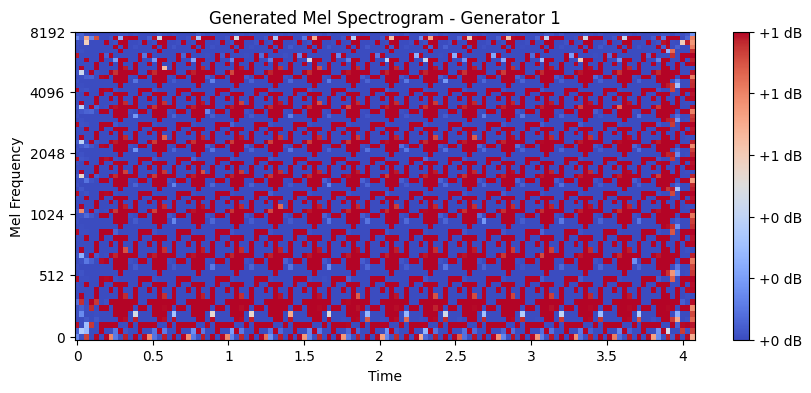

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4227


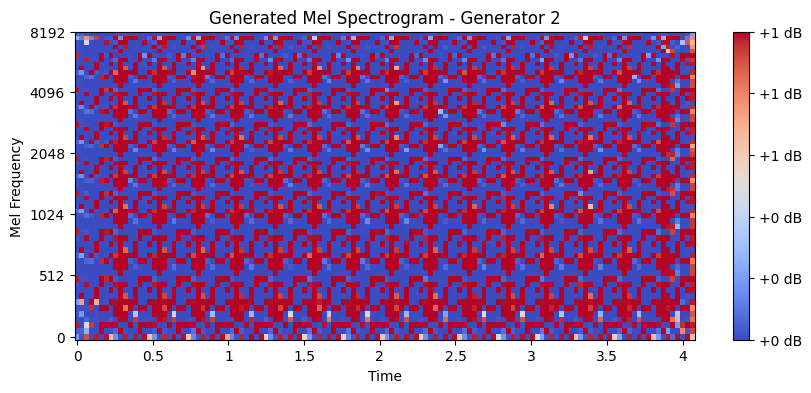

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4220


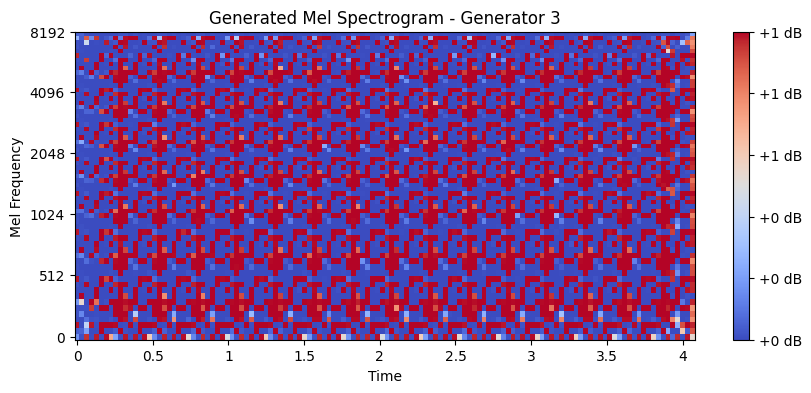

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2428


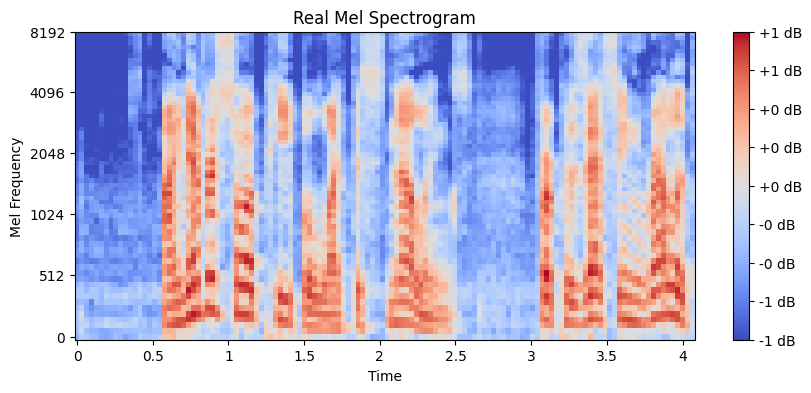

Batch [1] - D Loss: 0.5565, G Loss: 8.4782
[7/50] D Loss: 0.5565, G Loss: 8.4782
Batch [2] - D Loss: 0.5655, G Loss: 8.1380
[7/50] D Loss: 0.5655, G Loss: 8.1380
Batch [3] - D Loss: 0.5937, G Loss: 8.7803
[7/50] D Loss: 0.5937, G Loss: 8.7803
Batch [4] - D Loss: 0.6249, G Loss: 8.7004
[7/50] D Loss: 0.6249, G Loss: 8.7004
Batch [5] - D Loss: 0.6614, G Loss: 9.0554
[7/50] D Loss: 0.6614, G Loss: 9.0554
Batch [6] - D Loss: 0.7100, G Loss: 9.1953
[7/50] D Loss: 0.7100, G Loss: 9.1953
Batch [7] - D Loss: 0.5635, G Loss: 8.8394
[7/50] D Loss: 0.5635, G Loss: 8.8394
Batch [8] - D Loss: 0.5688, G Loss: 8.9550
[7/50] D Loss: 0.5688, G Loss: 8.9550
Batch [9] - D Loss: 0.5821, G Loss: 8.9015
[7/50] D Loss: 0.5821, G Loss: 8.9015
Batch [10] - D Loss: 0.5870, G Loss: 9.0766
[7/50] D Loss: 0.5870, G Loss: 9.0766
Batch [11] - D Loss: 0.5630, G Loss: 8.9938
[7/50] D Loss: 0.5630, G Loss: 8.9938
Batch [12] - D Loss: 0.5577, G Loss: 8.7843
[7/50] D Loss: 0.5577, G Loss: 8.7843
Batch [13] - D Loss: 0.55

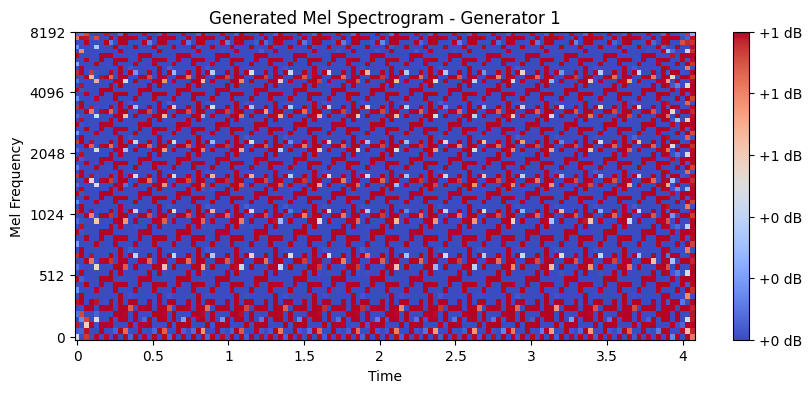

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3855


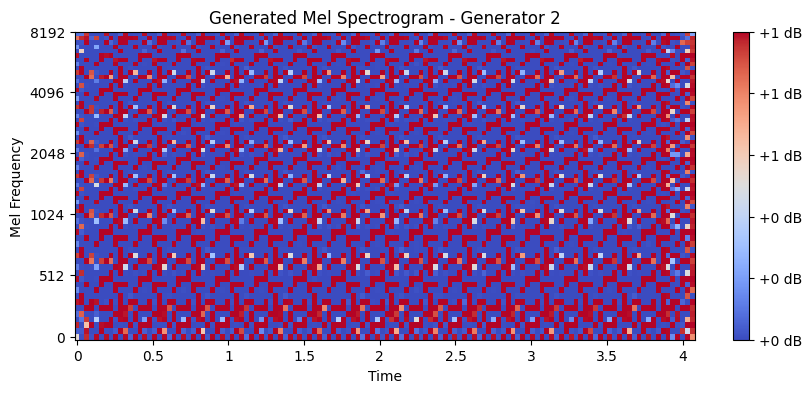

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3862


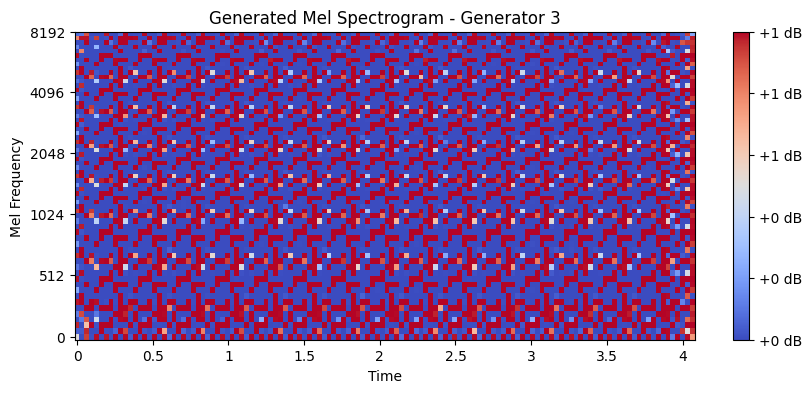

Real sample statistics:
  Min: -0.9031, Max: 1.0000, Mean: -0.1115


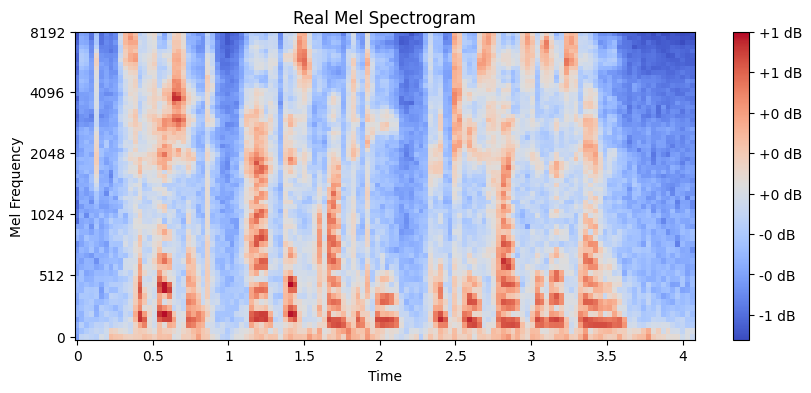

Batch [1] - D Loss: 0.5730, G Loss: 8.4605
[8/50] D Loss: 0.5730, G Loss: 8.4605
Batch [2] - D Loss: 0.5728, G Loss: 8.8101
[8/50] D Loss: 0.5728, G Loss: 8.8101
Batch [3] - D Loss: 0.6112, G Loss: 9.0511
[8/50] D Loss: 0.6112, G Loss: 9.0511
Batch [4] - D Loss: 0.7103, G Loss: 9.3480
[8/50] D Loss: 0.7103, G Loss: 9.3480
Batch [5] - D Loss: 0.6182, G Loss: 9.7475
[8/50] D Loss: 0.6182, G Loss: 9.7475
Batch [6] - D Loss: 0.5775, G Loss: 9.5888
[8/50] D Loss: 0.5775, G Loss: 9.5888
Batch [7] - D Loss: 0.5801, G Loss: 9.3605
[8/50] D Loss: 0.5801, G Loss: 9.3605
Batch [8] - D Loss: 0.5678, G Loss: 8.5427
[8/50] D Loss: 0.5678, G Loss: 8.5427
Batch [9] - D Loss: 0.5849, G Loss: 8.5715
[8/50] D Loss: 0.5849, G Loss: 8.5715
Batch [10] - D Loss: 0.6296, G Loss: 8.0647
[8/50] D Loss: 0.6296, G Loss: 8.0647
Batch [11] - D Loss: 0.6115, G Loss: 7.8381
[8/50] D Loss: 0.6115, G Loss: 7.8381
Batch [12] - D Loss: 0.5742, G Loss: 8.2338
[8/50] D Loss: 0.5742, G Loss: 8.2338
Batch [13] - D Loss: 0.55

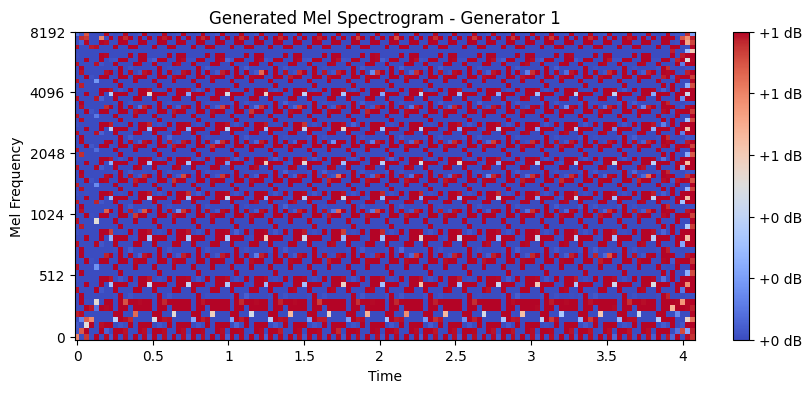

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4078


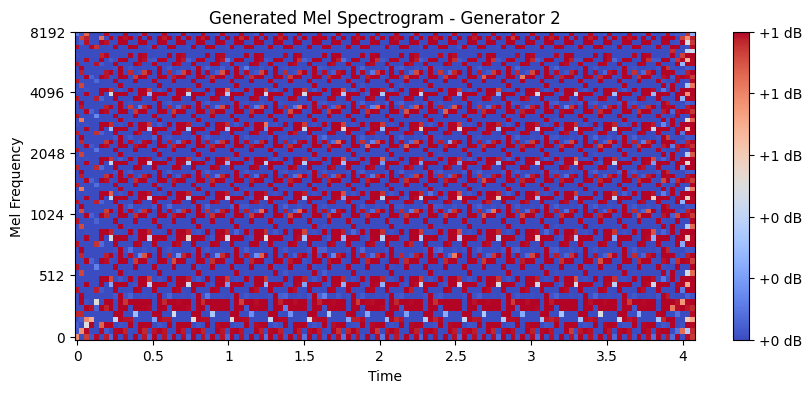

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4082


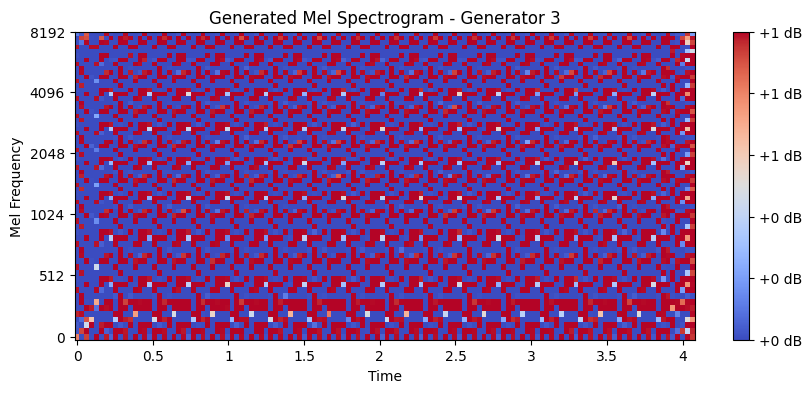

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2489


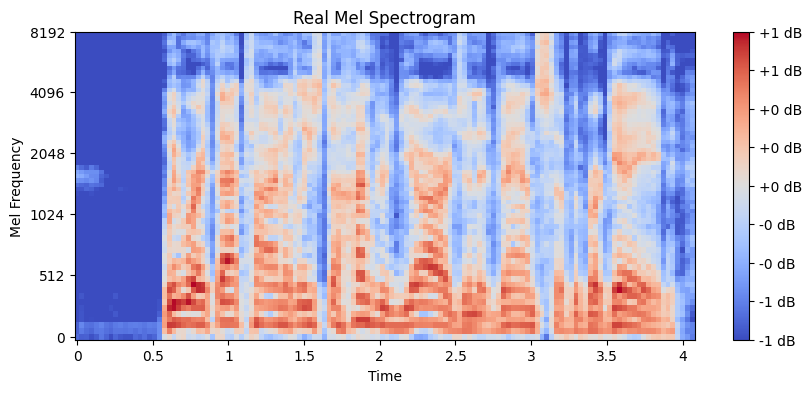

Batch [1] - D Loss: 0.8848, G Loss: 9.8413
[9/50] D Loss: 0.8848, G Loss: 9.8413
Batch [2] - D Loss: 0.8080, G Loss: 10.0273
[9/50] D Loss: 0.8080, G Loss: 10.0273
Batch [3] - D Loss: 0.9191, G Loss: 10.1458
[9/50] D Loss: 0.9191, G Loss: 10.1458
Batch [4] - D Loss: 0.9253, G Loss: 9.7638
[9/50] D Loss: 0.9253, G Loss: 9.7638
Batch [5] - D Loss: 0.8222, G Loss: 9.5160
[9/50] D Loss: 0.8222, G Loss: 9.5160
Batch [6] - D Loss: 0.8397, G Loss: 9.8196
[9/50] D Loss: 0.8397, G Loss: 9.8196
Batch [7] - D Loss: 0.8760, G Loss: 10.3248
[9/50] D Loss: 0.8760, G Loss: 10.3248
Batch [8] - D Loss: 0.8829, G Loss: 9.9779
[9/50] D Loss: 0.8829, G Loss: 9.9779
Batch [9] - D Loss: 0.8056, G Loss: 9.7659
[9/50] D Loss: 0.8056, G Loss: 9.7659
Batch [10] - D Loss: 0.7211, G Loss: 9.5938
[9/50] D Loss: 0.7211, G Loss: 9.5938
Batch [11] - D Loss: 0.6602, G Loss: 9.4769
[9/50] D Loss: 0.6602, G Loss: 9.4769
Batch [12] - D Loss: 0.6312, G Loss: 9.2776
[9/50] D Loss: 0.6312, G Loss: 9.2776
Batch [13] - D Loss

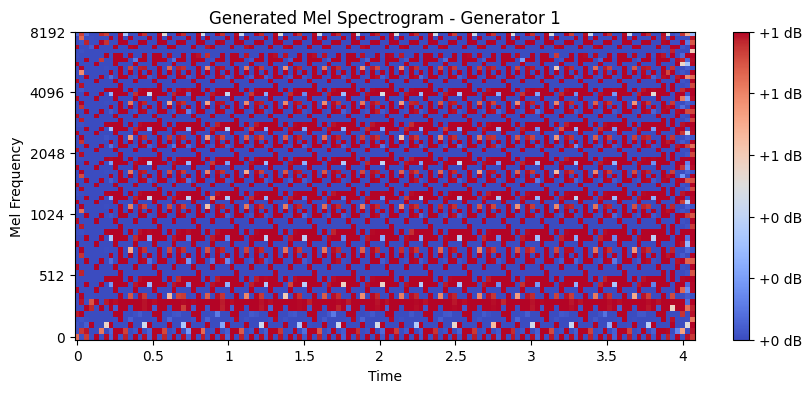

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4404


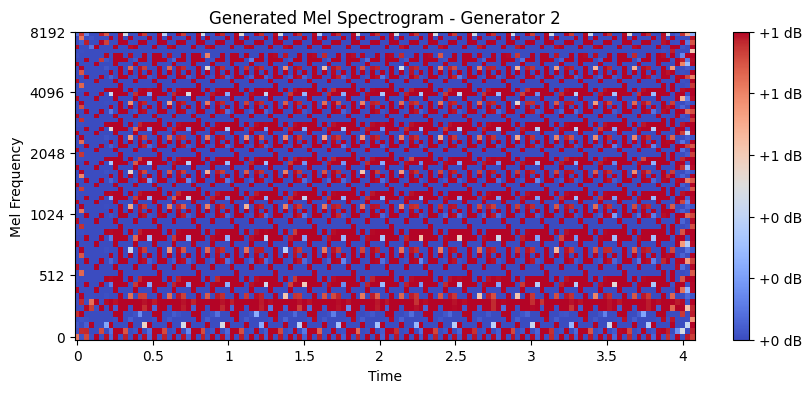

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4403


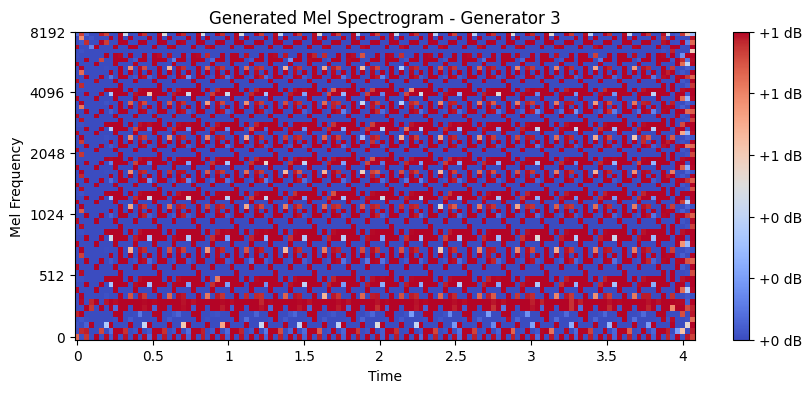

Real sample statistics:
  Min: -1.0000, Max: 0.8210, Mean: -0.3332


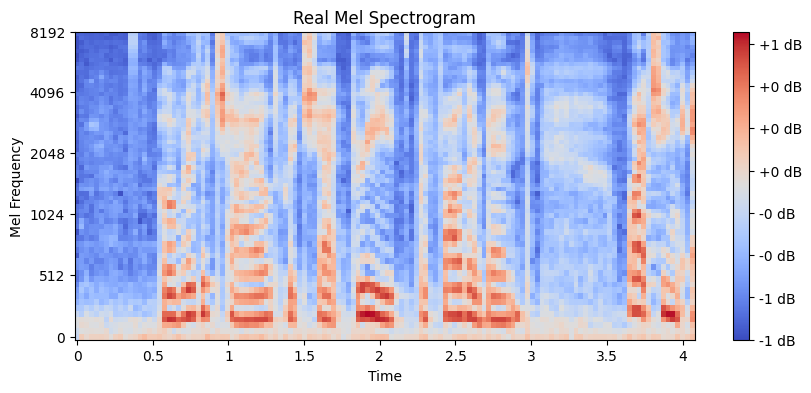

Batch [1] - D Loss: 0.5558, G Loss: 8.2021
[10/50] D Loss: 0.5558, G Loss: 8.2021
Batch [2] - D Loss: 0.5638, G Loss: 8.2685
[10/50] D Loss: 0.5638, G Loss: 8.2685
Batch [3] - D Loss: 0.5608, G Loss: 8.2028
[10/50] D Loss: 0.5608, G Loss: 8.2028
Batch [4] - D Loss: 0.5550, G Loss: 8.0295
[10/50] D Loss: 0.5550, G Loss: 8.0295
Batch [5] - D Loss: 0.5518, G Loss: 8.1425
[10/50] D Loss: 0.5518, G Loss: 8.1425
Batch [6] - D Loss: 0.5485, G Loss: 8.1592
[10/50] D Loss: 0.5485, G Loss: 8.1592
Batch [7] - D Loss: 0.5477, G Loss: 8.1620
[10/50] D Loss: 0.5477, G Loss: 8.1620
Batch [8] - D Loss: 0.5483, G Loss: 7.7578
[10/50] D Loss: 0.5483, G Loss: 7.7578
Batch [9] - D Loss: 0.5479, G Loss: 7.8796
[10/50] D Loss: 0.5479, G Loss: 7.8796
Batch [10] - D Loss: 0.5497, G Loss: 8.0525
[10/50] D Loss: 0.5497, G Loss: 8.0525
Batch [11] - D Loss: 0.5497, G Loss: 8.0048
[10/50] D Loss: 0.5497, G Loss: 8.0048
Batch [12] - D Loss: 0.5508, G Loss: 8.1404
[10/50] D Loss: 0.5508, G Loss: 8.1404
Batch [13] - 

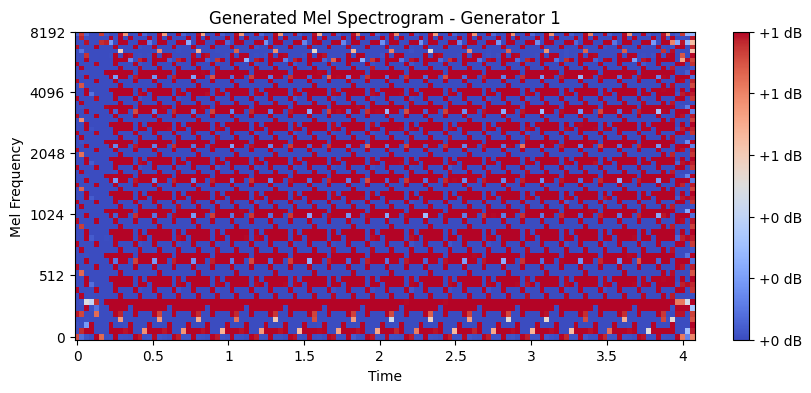

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4687


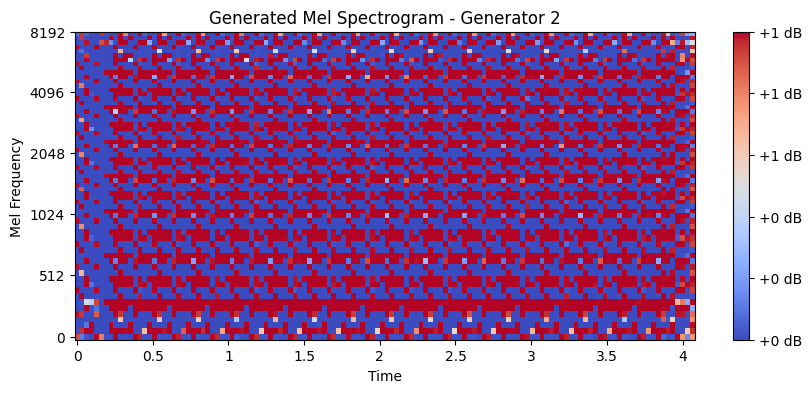

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4672


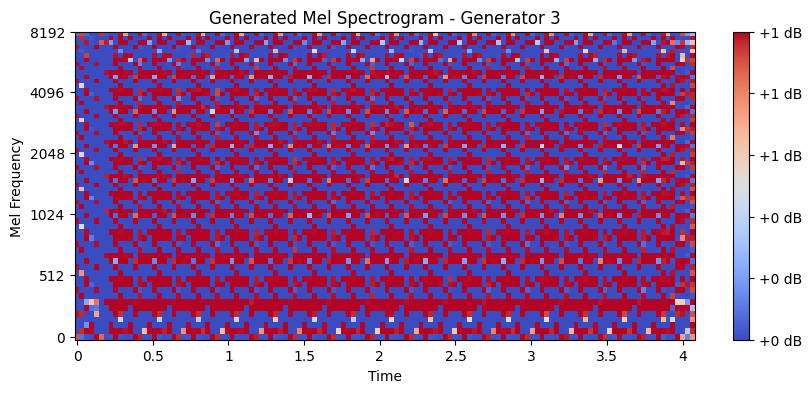

Real sample statistics:
  Min: -0.9287, Max: 1.0000, Mean: 0.1405


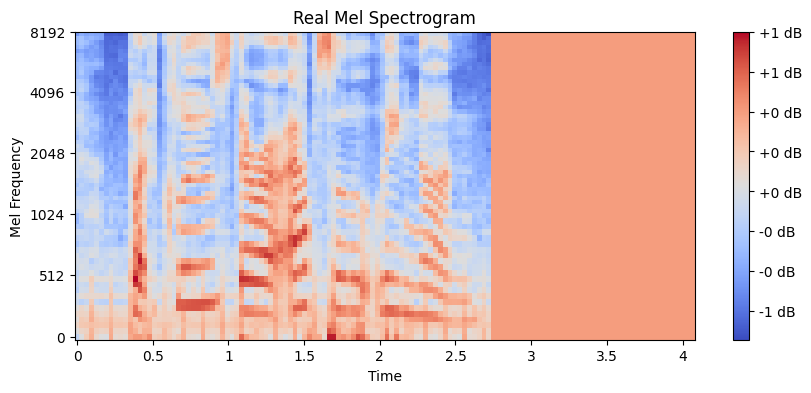

Batch [1] - D Loss: 0.5573, G Loss: 8.7228
[11/50] D Loss: 0.5573, G Loss: 8.7228
Batch [2] - D Loss: 0.5661, G Loss: 8.6330
[11/50] D Loss: 0.5661, G Loss: 8.6330
Batch [3] - D Loss: 0.5668, G Loss: 8.7583
[11/50] D Loss: 0.5668, G Loss: 8.7583
Batch [4] - D Loss: 0.5812, G Loss: 8.9110
[11/50] D Loss: 0.5812, G Loss: 8.9110
Batch [5] - D Loss: 0.5735, G Loss: 8.9889
[11/50] D Loss: 0.5735, G Loss: 8.9889
Batch [6] - D Loss: 0.5905, G Loss: 8.8785
[11/50] D Loss: 0.5905, G Loss: 8.8785
Batch [7] - D Loss: 0.5934, G Loss: 9.0708
[11/50] D Loss: 0.5934, G Loss: 9.0708
Batch [8] - D Loss: 0.6182, G Loss: 9.1174
[11/50] D Loss: 0.6182, G Loss: 9.1174
Batch [9] - D Loss: 0.5812, G Loss: 9.2051
[11/50] D Loss: 0.5812, G Loss: 9.2051
Batch [10] - D Loss: 0.5770, G Loss: 8.8929
[11/50] D Loss: 0.5770, G Loss: 8.8929
Batch [11] - D Loss: 0.5655, G Loss: 9.0454
[11/50] D Loss: 0.5655, G Loss: 9.0454
Batch [12] - D Loss: 0.5656, G Loss: 9.0183
[11/50] D Loss: 0.5656, G Loss: 9.0183
Batch [13] - 

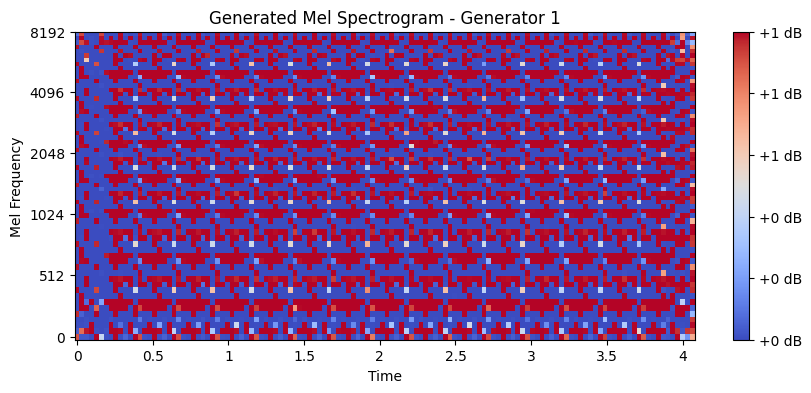

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4331


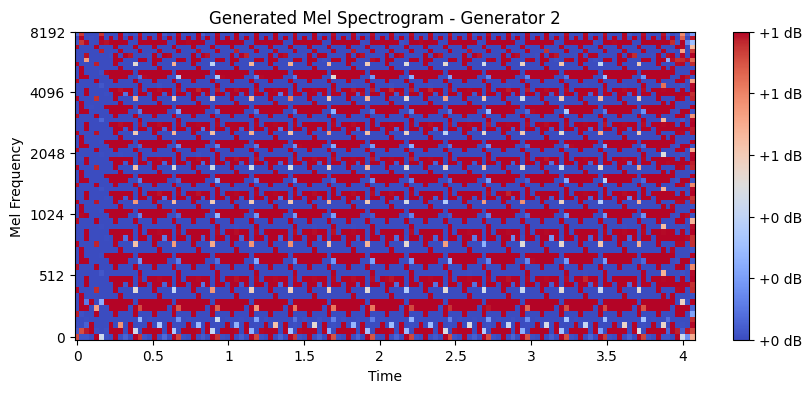

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4312


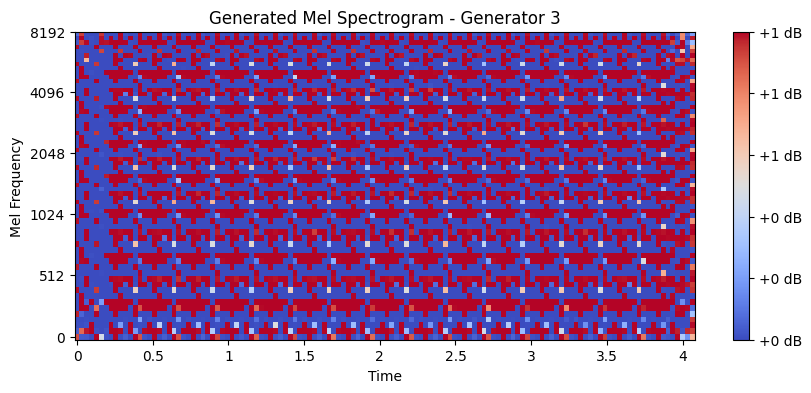

Real sample statistics:
  Min: -1.0000, Max: 0.8856, Mean: -0.3737


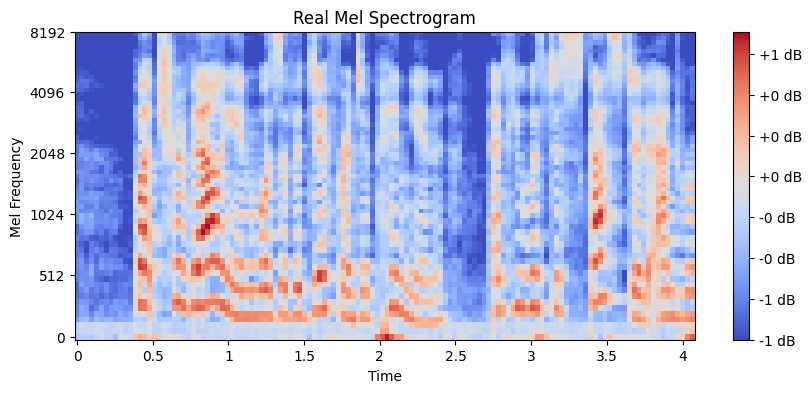

Batch [1] - D Loss: 0.5669, G Loss: 9.0168
[12/50] D Loss: 0.5669, G Loss: 9.0168
Batch [2] - D Loss: 0.5561, G Loss: 8.5276
[12/50] D Loss: 0.5561, G Loss: 8.5276
Batch [3] - D Loss: 0.5538, G Loss: 8.5205
[12/50] D Loss: 0.5538, G Loss: 8.5205
Batch [4] - D Loss: 0.5559, G Loss: 8.6425
[12/50] D Loss: 0.5559, G Loss: 8.6425
Batch [5] - D Loss: 0.5608, G Loss: 8.9153
[12/50] D Loss: 0.5608, G Loss: 8.9153
Batch [6] - D Loss: 0.5679, G Loss: 8.9735
[12/50] D Loss: 0.5679, G Loss: 8.9735
Batch [7] - D Loss: 0.5684, G Loss: 9.1314
[12/50] D Loss: 0.5684, G Loss: 9.1314
Batch [8] - D Loss: 0.5678, G Loss: 9.2860
[12/50] D Loss: 0.5678, G Loss: 9.2860
Batch [9] - D Loss: 0.5640, G Loss: 9.2994
[12/50] D Loss: 0.5640, G Loss: 9.2994
Batch [10] - D Loss: 0.5797, G Loss: 9.5089
[12/50] D Loss: 0.5797, G Loss: 9.5089
Batch [11] - D Loss: 0.5893, G Loss: 9.6247
[12/50] D Loss: 0.5893, G Loss: 9.6247
Batch [12] - D Loss: 0.6183, G Loss: 9.5585
[12/50] D Loss: 0.6183, G Loss: 9.5585
Batch [13] - 

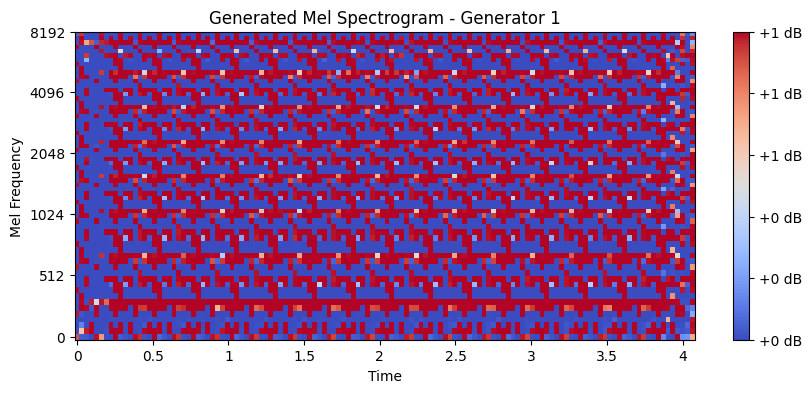

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4613


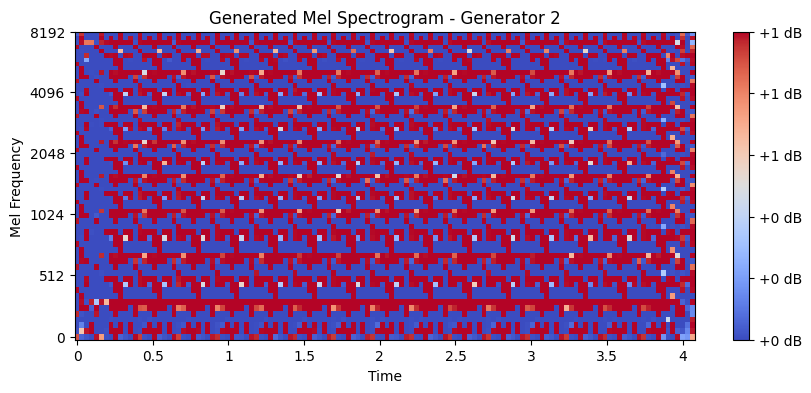

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4627


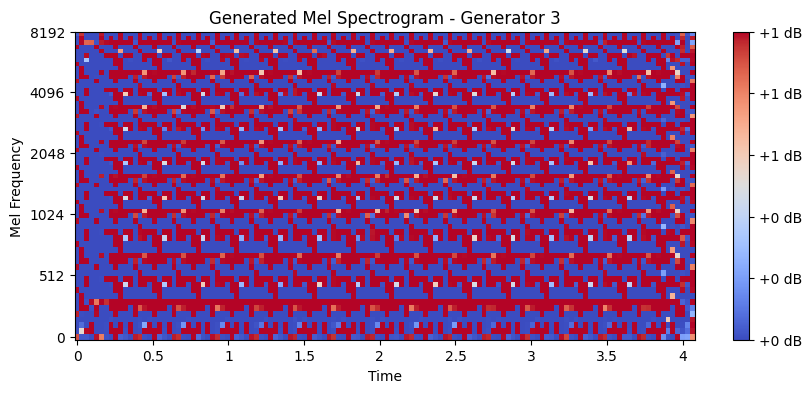

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.0061


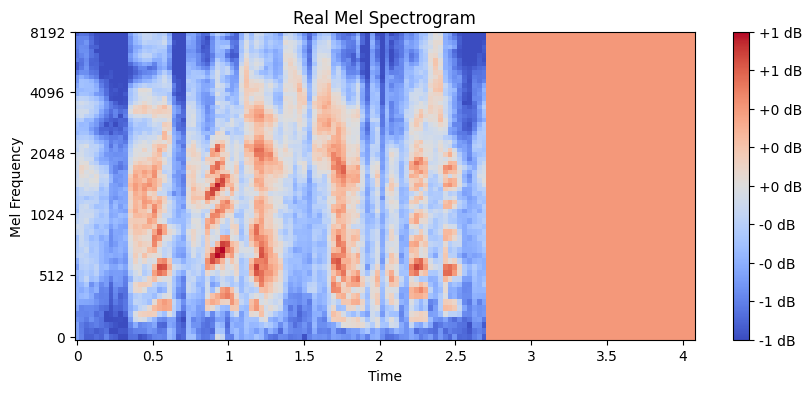

Batch [1] - D Loss: 0.5564, G Loss: 8.1512
[13/50] D Loss: 0.5564, G Loss: 8.1512
Batch [2] - D Loss: 0.5927, G Loss: 8.5692
[13/50] D Loss: 0.5927, G Loss: 8.5692
Batch [3] - D Loss: 0.6057, G Loss: 9.1757
[13/50] D Loss: 0.6057, G Loss: 9.1757
Batch [4] - D Loss: 0.6707, G Loss: 8.5596
[13/50] D Loss: 0.6707, G Loss: 8.5596
Batch [5] - D Loss: 0.5902, G Loss: 9.4723
[13/50] D Loss: 0.5902, G Loss: 9.4723
Batch [6] - D Loss: 0.5571, G Loss: 9.2307
[13/50] D Loss: 0.5571, G Loss: 9.2307
Batch [7] - D Loss: 0.5563, G Loss: 9.1687
[13/50] D Loss: 0.5563, G Loss: 9.1687
Batch [8] - D Loss: 0.5581, G Loss: 9.3427
[13/50] D Loss: 0.5581, G Loss: 9.3427
Batch [9] - D Loss: 0.5685, G Loss: 9.5175
[13/50] D Loss: 0.5685, G Loss: 9.5175
Batch [10] - D Loss: 0.5698, G Loss: 9.4056
[13/50] D Loss: 0.5698, G Loss: 9.4056
Batch [11] - D Loss: 0.5775, G Loss: 9.2465
[13/50] D Loss: 0.5775, G Loss: 9.2465
Batch [12] - D Loss: 0.5647, G Loss: 9.2227
[13/50] D Loss: 0.5647, G Loss: 9.2227
Batch [13] - 

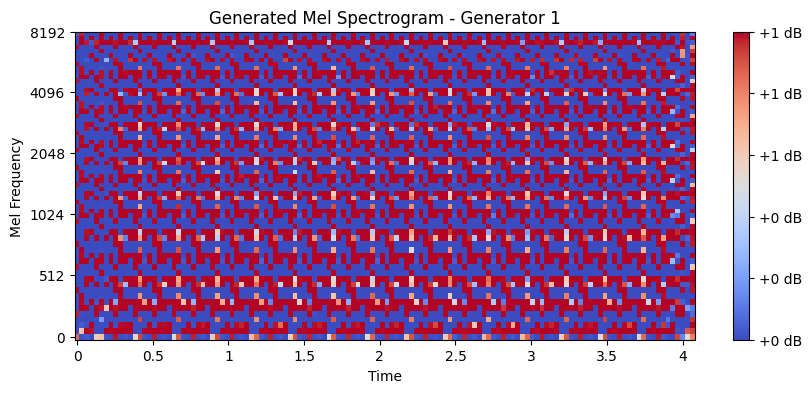

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4569


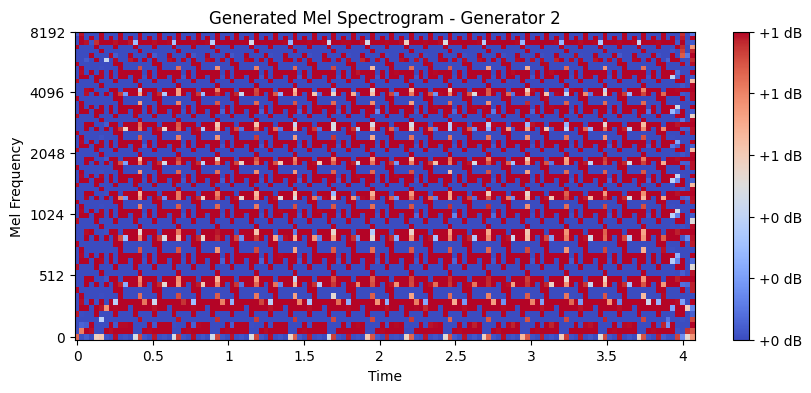

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4447


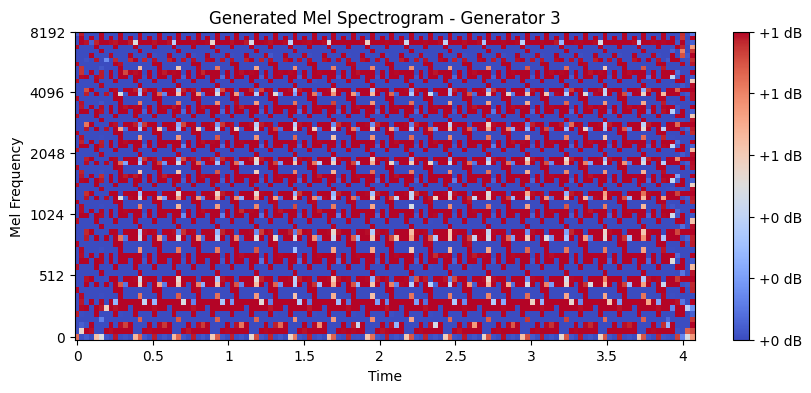

Real sample statistics:
  Min: -1.0000, Max: 0.9226, Mean: -0.2972


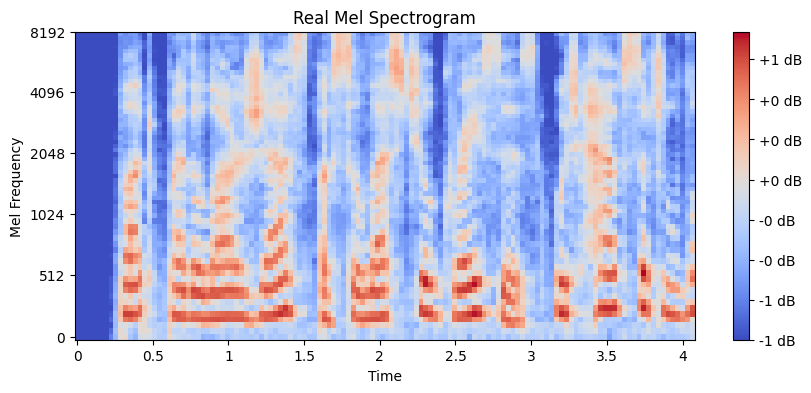

Batch [1] - D Loss: 0.5649, G Loss: 9.5873
[14/50] D Loss: 0.5649, G Loss: 9.5873
Batch [2] - D Loss: 0.5576, G Loss: 9.7886
[14/50] D Loss: 0.5576, G Loss: 9.7886
Batch [3] - D Loss: 0.5395, G Loss: 9.9800
[14/50] D Loss: 0.5395, G Loss: 9.9800
Batch [4] - D Loss: 0.5591, G Loss: 10.3139
[14/50] D Loss: 0.5591, G Loss: 10.3139
Batch [5] - D Loss: 0.5764, G Loss: 10.4950
[14/50] D Loss: 0.5764, G Loss: 10.4950
Batch [6] - D Loss: 0.6249, G Loss: 10.6455
[14/50] D Loss: 0.6249, G Loss: 10.6455
Batch [7] - D Loss: 0.6129, G Loss: 10.6256
[14/50] D Loss: 0.6129, G Loss: 10.6256
Batch [8] - D Loss: 0.6261, G Loss: 10.2575
[14/50] D Loss: 0.6261, G Loss: 10.2575
Batch [9] - D Loss: 0.5407, G Loss: 10.1952
[14/50] D Loss: 0.5407, G Loss: 10.1952
Batch [10] - D Loss: 0.5391, G Loss: 10.3337
[14/50] D Loss: 0.5391, G Loss: 10.3337
Batch [11] - D Loss: 0.5568, G Loss: 9.9998
[14/50] D Loss: 0.5568, G Loss: 9.9998
Batch [12] - D Loss: 0.5351, G Loss: 9.7029
[14/50] D Loss: 0.5351, G Loss: 9.7029

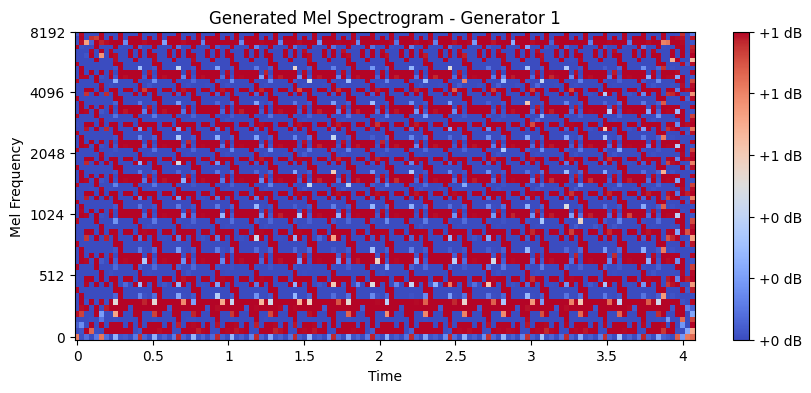

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4290


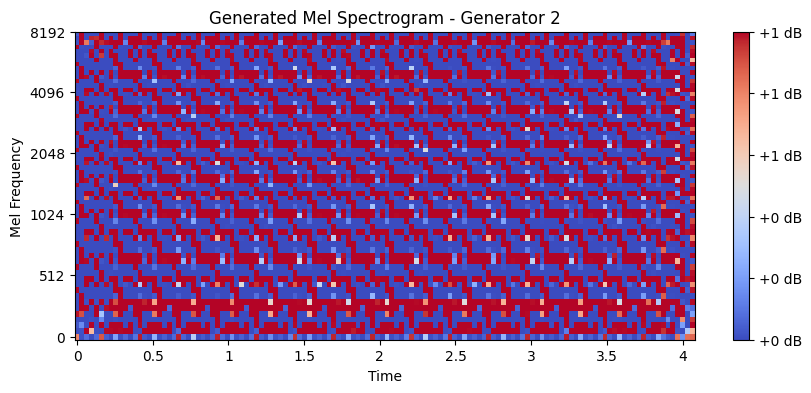

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4426


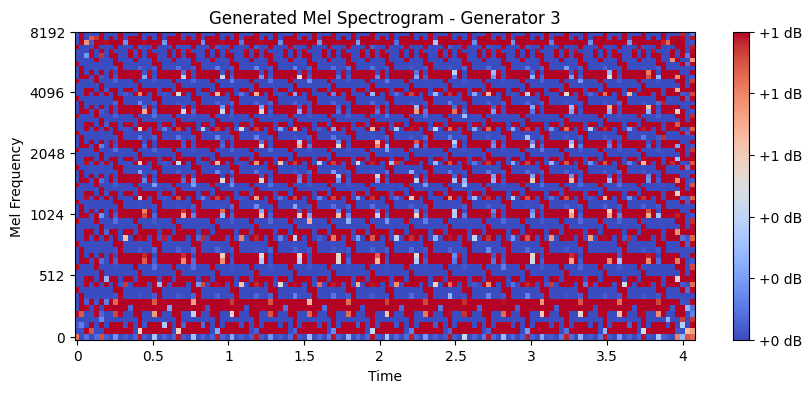

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2030


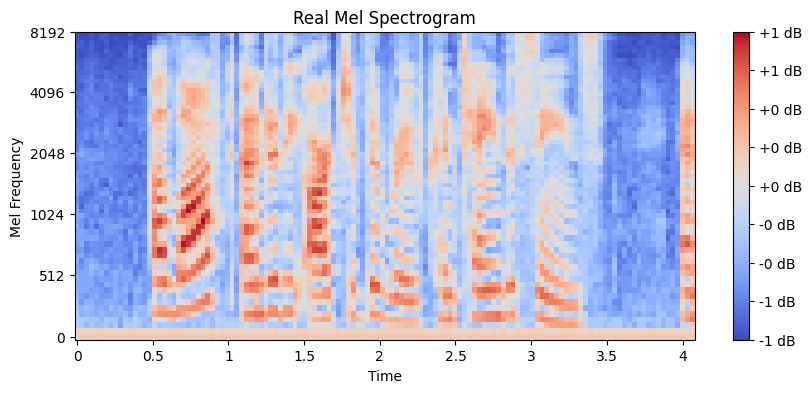

Batch [1] - D Loss: 0.4204, G Loss: 8.6336
[15/50] D Loss: 0.4204, G Loss: 8.6336
Batch [2] - D Loss: 0.3716, G Loss: 7.6174
[15/50] D Loss: 0.3716, G Loss: 7.6174
Batch [3] - D Loss: 0.3328, G Loss: 7.5669
[15/50] D Loss: 0.3328, G Loss: 7.5669
Batch [4] - D Loss: 0.3071, G Loss: 7.0050
[15/50] D Loss: 0.3071, G Loss: 7.0050
Batch [5] - D Loss: 0.3076, G Loss: 7.5101
[15/50] D Loss: 0.3076, G Loss: 7.5101
Batch [6] - D Loss: 0.2204, G Loss: 7.8393
[15/50] D Loss: 0.2204, G Loss: 7.8393
Batch [7] - D Loss: 0.2193, G Loss: 8.6055
[15/50] D Loss: 0.2193, G Loss: 8.6055
Batch [8] - D Loss: 0.2000, G Loss: 8.7130
[15/50] D Loss: 0.2000, G Loss: 8.7130
Batch [9] - D Loss: 0.1901, G Loss: 8.0065
[15/50] D Loss: 0.1901, G Loss: 8.0065
Batch [10] - D Loss: 0.1178, G Loss: 6.7995
[15/50] D Loss: 0.1178, G Loss: 6.7995
Batch [11] - D Loss: 0.0884, G Loss: 7.5267
[15/50] D Loss: 0.0884, G Loss: 7.5267
Batch [12] - D Loss: 0.0710, G Loss: 7.4620
[15/50] D Loss: 0.0710, G Loss: 7.4620
Batch [13] - 

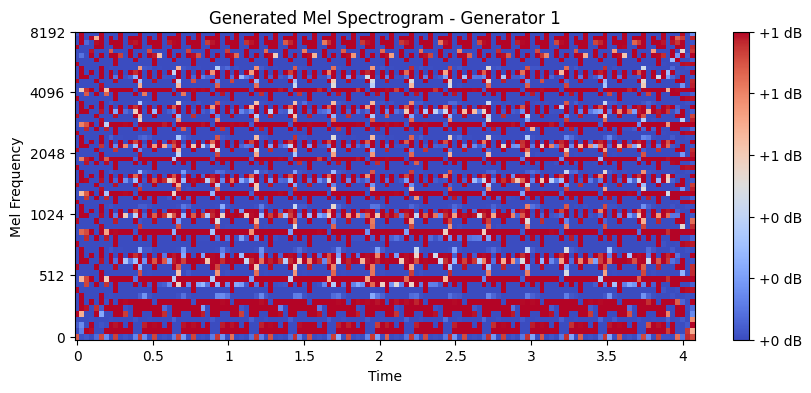

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4045


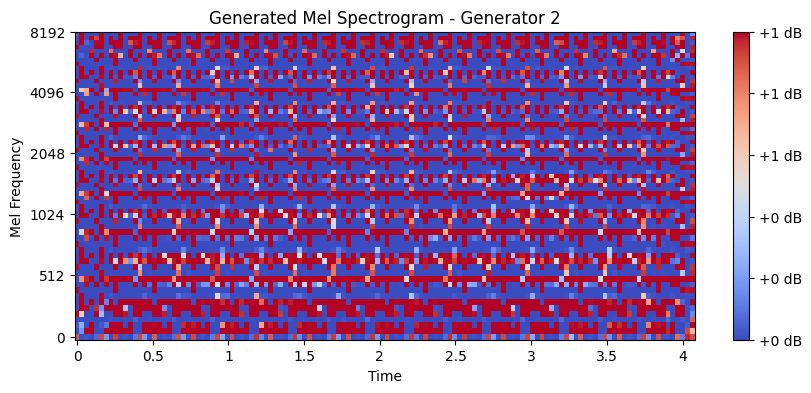

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3980


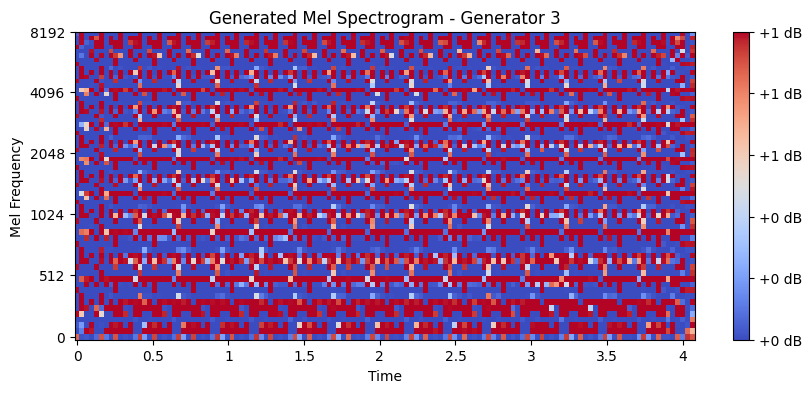

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1871


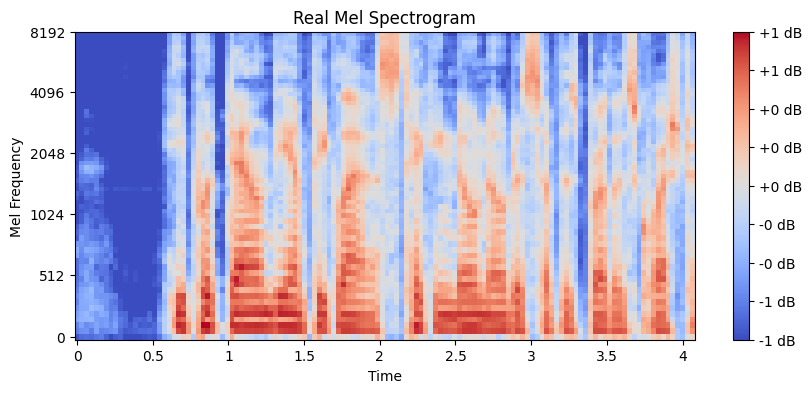

Batch [1] - D Loss: 0.0509, G Loss: 7.7498
[16/50] D Loss: 0.0509, G Loss: 7.7498
Batch [2] - D Loss: 0.0386, G Loss: 7.6071
[16/50] D Loss: 0.0386, G Loss: 7.6071
Batch [3] - D Loss: 0.0653, G Loss: 7.3495
[16/50] D Loss: 0.0653, G Loss: 7.3495
Batch [4] - D Loss: 0.0245, G Loss: 6.9746
[16/50] D Loss: 0.0245, G Loss: 6.9746
Batch [5] - D Loss: 0.0382, G Loss: 7.6161
[16/50] D Loss: 0.0382, G Loss: 7.6161
Batch [6] - D Loss: 0.0249, G Loss: 7.7380
[16/50] D Loss: 0.0249, G Loss: 7.7380
Batch [7] - D Loss: 0.0363, G Loss: 7.6284
[16/50] D Loss: 0.0363, G Loss: 7.6284
Batch [8] - D Loss: 0.0227, G Loss: 7.5549
[16/50] D Loss: 0.0227, G Loss: 7.5549
Batch [9] - D Loss: 0.0184, G Loss: 7.6300
[16/50] D Loss: 0.0184, G Loss: 7.6300
Batch [10] - D Loss: 0.0293, G Loss: 7.6387
[16/50] D Loss: 0.0293, G Loss: 7.6387
Batch [11] - D Loss: 0.0253, G Loss: 7.8035
[16/50] D Loss: 0.0253, G Loss: 7.8035
Batch [12] - D Loss: 0.0418, G Loss: 7.6266
[16/50] D Loss: 0.0418, G Loss: 7.6266
Batch [13] - 

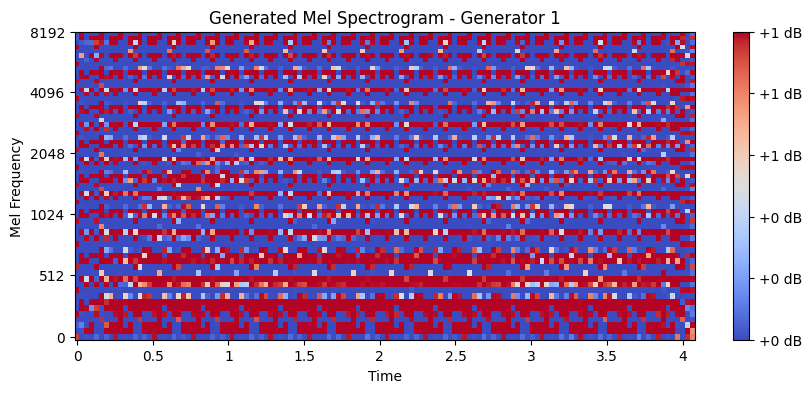

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4135


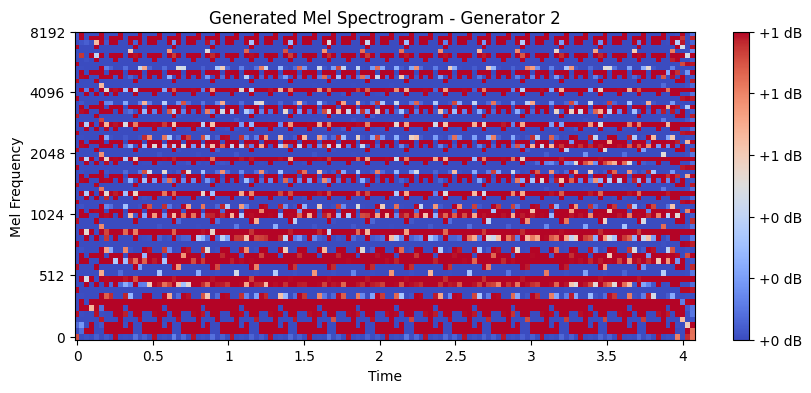

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.4033


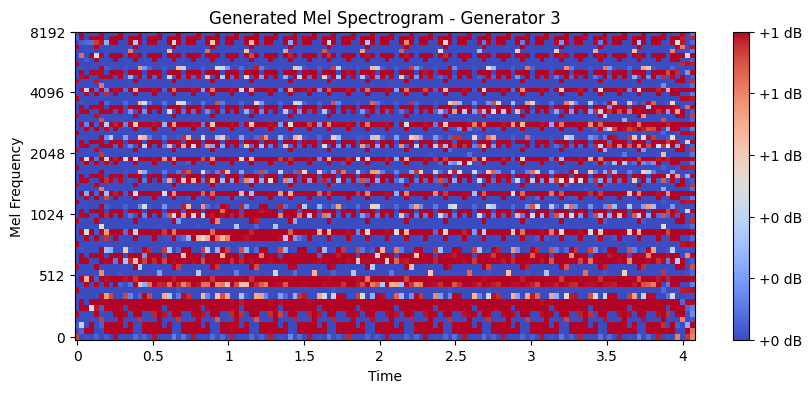

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1631


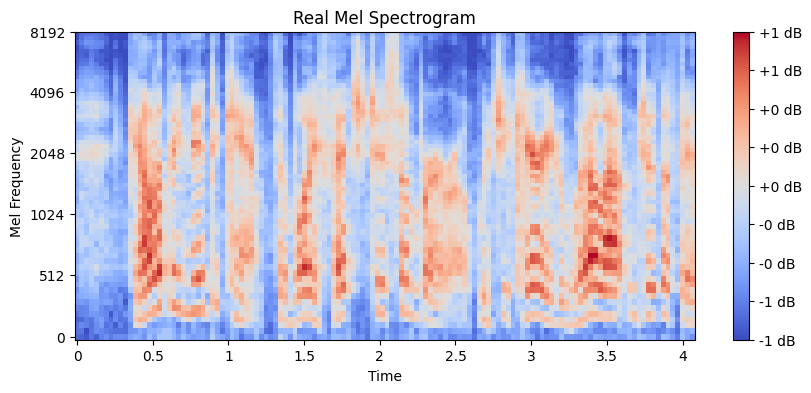

Batch [1] - D Loss: 0.0131, G Loss: 8.1453
[17/50] D Loss: 0.0131, G Loss: 8.1453
Batch [2] - D Loss: 0.0226, G Loss: 8.1565
[17/50] D Loss: 0.0226, G Loss: 8.1565
Batch [3] - D Loss: 0.0175, G Loss: 7.7842
[17/50] D Loss: 0.0175, G Loss: 7.7842
Batch [4] - D Loss: 0.0153, G Loss: 8.0993
[17/50] D Loss: 0.0153, G Loss: 8.0993
Batch [5] - D Loss: 0.0066, G Loss: 8.1238
[17/50] D Loss: 0.0066, G Loss: 8.1238
Batch [6] - D Loss: 0.0105, G Loss: 7.9440
[17/50] D Loss: 0.0105, G Loss: 7.9440
Batch [7] - D Loss: 0.0115, G Loss: 8.4276
[17/50] D Loss: 0.0115, G Loss: 8.4276
Batch [8] - D Loss: 0.0091, G Loss: 8.2175
[17/50] D Loss: 0.0091, G Loss: 8.2175
Batch [9] - D Loss: 0.0119, G Loss: 7.9884
[17/50] D Loss: 0.0119, G Loss: 7.9884
Batch [10] - D Loss: 0.0146, G Loss: 8.1628
[17/50] D Loss: 0.0146, G Loss: 8.1628
Batch [11] - D Loss: 0.0076, G Loss: 8.2128
[17/50] D Loss: 0.0076, G Loss: 8.2128
Batch [12] - D Loss: 0.0078, G Loss: 8.3566
[17/50] D Loss: 0.0078, G Loss: 8.3566
Batch [13] - 

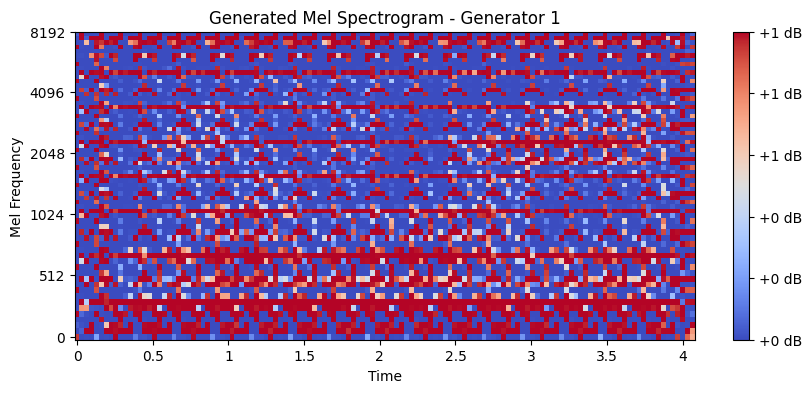

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3921


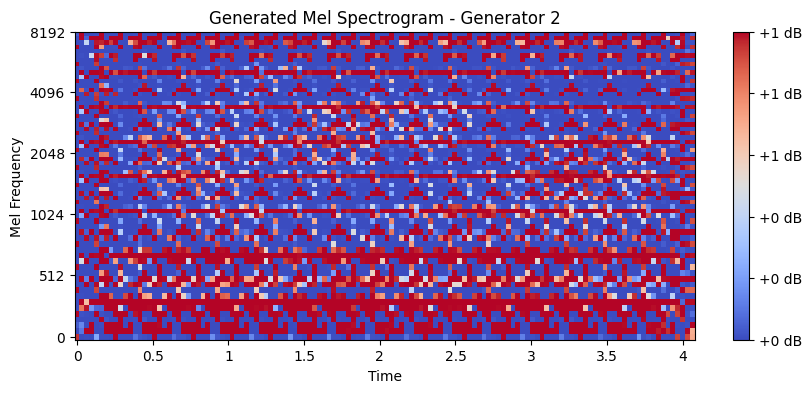

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3939


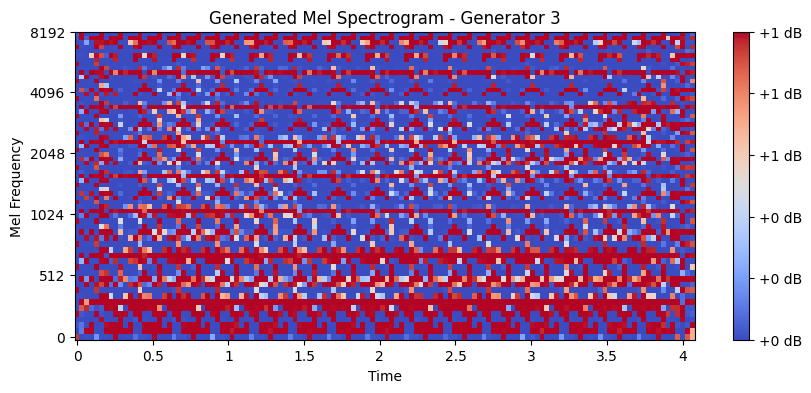

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: 0.0333


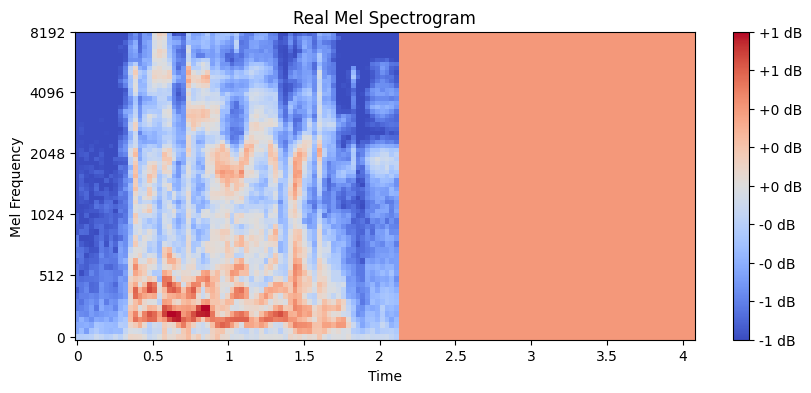

Batch [1] - D Loss: 0.0178, G Loss: 7.5675
[18/50] D Loss: 0.0178, G Loss: 7.5675
Batch [2] - D Loss: 0.0121, G Loss: 7.7322
[18/50] D Loss: 0.0121, G Loss: 7.7322
Batch [3] - D Loss: 0.0292, G Loss: 7.9952
[18/50] D Loss: 0.0292, G Loss: 7.9952
Batch [4] - D Loss: 0.0225, G Loss: 8.0645
[18/50] D Loss: 0.0225, G Loss: 8.0645
Batch [5] - D Loss: 0.0174, G Loss: 8.0741
[18/50] D Loss: 0.0174, G Loss: 8.0741
Batch [6] - D Loss: 0.0177, G Loss: 7.7749
[18/50] D Loss: 0.0177, G Loss: 7.7749
Batch [7] - D Loss: 0.0255, G Loss: 7.7231
[18/50] D Loss: 0.0255, G Loss: 7.7231
Batch [8] - D Loss: 0.0202, G Loss: 7.9011
[18/50] D Loss: 0.0202, G Loss: 7.9011
Batch [9] - D Loss: 0.0165, G Loss: 7.9331
[18/50] D Loss: 0.0165, G Loss: 7.9331
Batch [10] - D Loss: 0.0162, G Loss: 8.1998
[18/50] D Loss: 0.0162, G Loss: 8.1998
Batch [11] - D Loss: 0.0092, G Loss: 7.7140
[18/50] D Loss: 0.0092, G Loss: 7.7140
Batch [12] - D Loss: 0.0102, G Loss: 7.7717
[18/50] D Loss: 0.0102, G Loss: 7.7717
Batch [13] - 

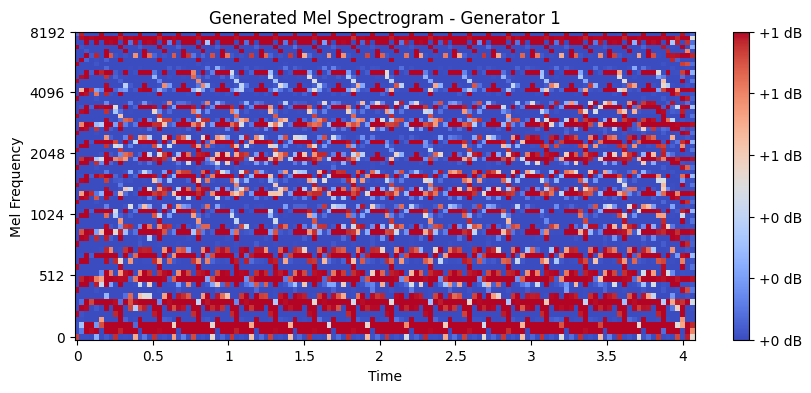

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3603


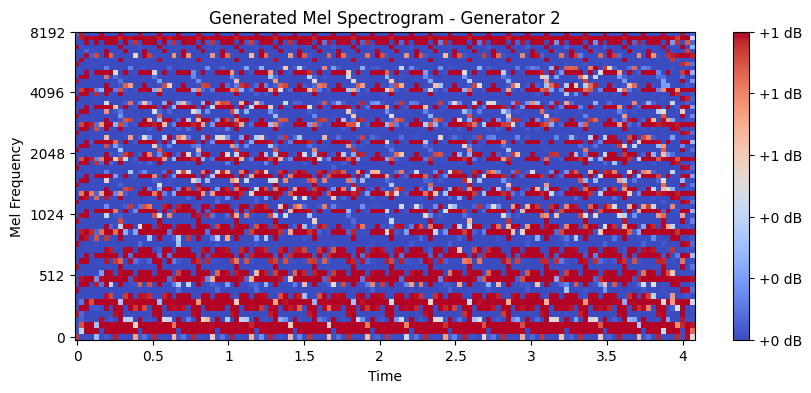

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3452


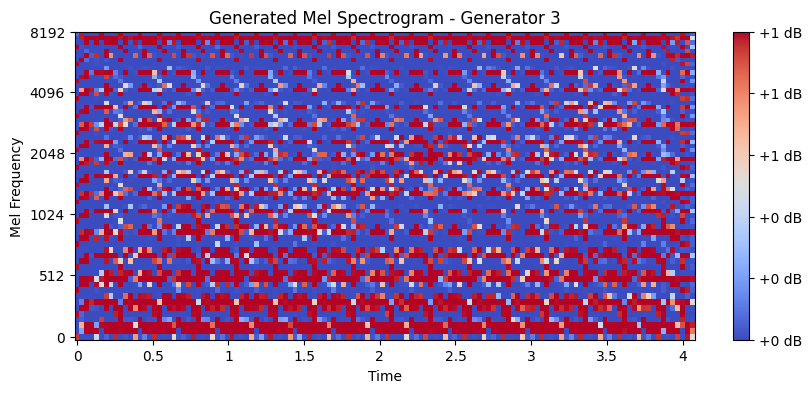

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2171


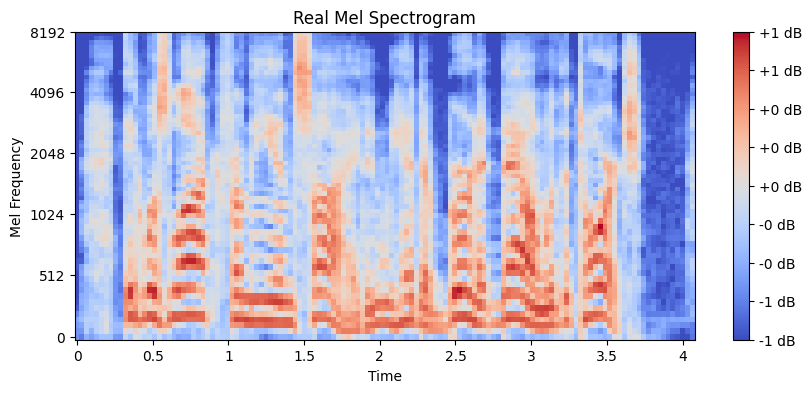

Batch [1] - D Loss: 0.0212, G Loss: 7.5245
[19/50] D Loss: 0.0212, G Loss: 7.5245
Batch [2] - D Loss: 0.0143, G Loss: 7.4953
[19/50] D Loss: 0.0143, G Loss: 7.4953
Batch [3] - D Loss: 0.0099, G Loss: 7.5031
[19/50] D Loss: 0.0099, G Loss: 7.5031
Batch [4] - D Loss: 0.0111, G Loss: 7.8298
[19/50] D Loss: 0.0111, G Loss: 7.8298
Batch [5] - D Loss: 0.0122, G Loss: 8.1513
[19/50] D Loss: 0.0122, G Loss: 8.1513
Batch [6] - D Loss: 0.0082, G Loss: 8.0437
[19/50] D Loss: 0.0082, G Loss: 8.0437
Batch [7] - D Loss: 0.0107, G Loss: 8.0096
[19/50] D Loss: 0.0107, G Loss: 8.0096
Batch [8] - D Loss: 0.0166, G Loss: 7.8879
[19/50] D Loss: 0.0166, G Loss: 7.8879
Batch [9] - D Loss: 0.0123, G Loss: 7.6164
[19/50] D Loss: 0.0123, G Loss: 7.6164
Batch [10] - D Loss: 0.0117, G Loss: 8.1488
[19/50] D Loss: 0.0117, G Loss: 8.1488
Batch [11] - D Loss: 0.0114, G Loss: 8.1116
[19/50] D Loss: 0.0114, G Loss: 8.1116
Batch [12] - D Loss: 0.0073, G Loss: 8.2194
[19/50] D Loss: 0.0073, G Loss: 8.2194
Batch [13] - 

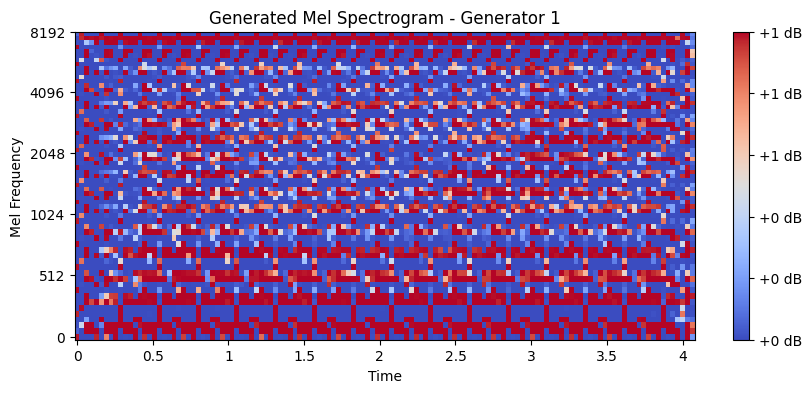

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3653


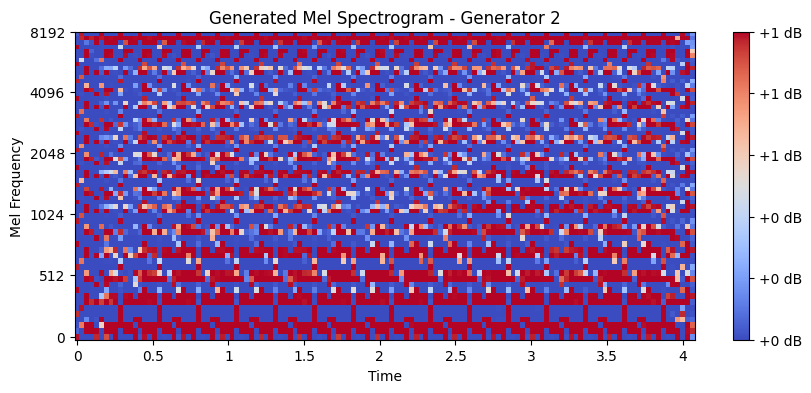

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3655


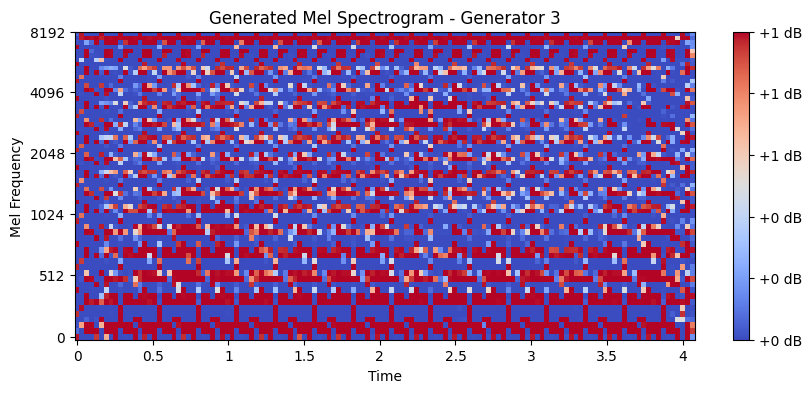

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.3646


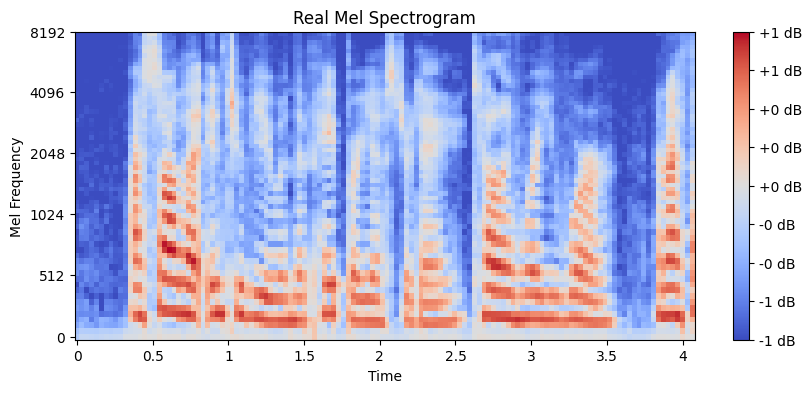

Batch [1] - D Loss: 0.0111, G Loss: 8.6135
[20/50] D Loss: 0.0111, G Loss: 8.6135
Batch [2] - D Loss: 0.0210, G Loss: 7.9906
[20/50] D Loss: 0.0210, G Loss: 7.9906
Batch [3] - D Loss: 0.0187, G Loss: 8.0411
[20/50] D Loss: 0.0187, G Loss: 8.0411
Batch [4] - D Loss: 0.0164, G Loss: 8.6107
[20/50] D Loss: 0.0164, G Loss: 8.6107
Batch [5] - D Loss: 0.0159, G Loss: 8.5547
[20/50] D Loss: 0.0159, G Loss: 8.5547
Batch [6] - D Loss: 0.0215, G Loss: 8.1179
[20/50] D Loss: 0.0215, G Loss: 8.1179
Batch [7] - D Loss: 0.0227, G Loss: 7.7366
[20/50] D Loss: 0.0227, G Loss: 7.7366
Batch [8] - D Loss: 0.0121, G Loss: 8.2255
[20/50] D Loss: 0.0121, G Loss: 8.2255
Batch [9] - D Loss: 0.0213, G Loss: 8.4138
[20/50] D Loss: 0.0213, G Loss: 8.4138
Batch [10] - D Loss: 0.0136, G Loss: 9.0221
[20/50] D Loss: 0.0136, G Loss: 9.0221
Batch [11] - D Loss: 0.0092, G Loss: 8.9212
[20/50] D Loss: 0.0092, G Loss: 8.9212
Batch [12] - D Loss: 0.0081, G Loss: 8.7987
[20/50] D Loss: 0.0081, G Loss: 8.7987
Batch [13] - 

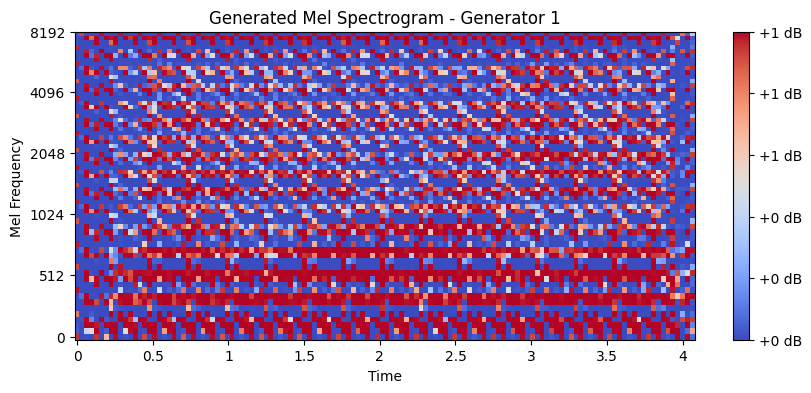

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3957


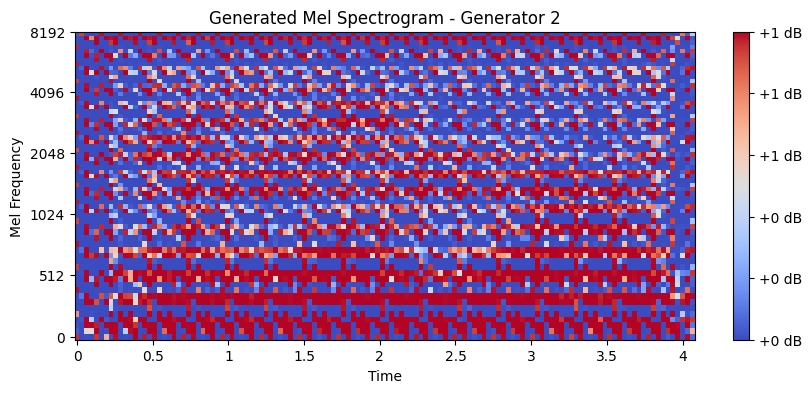

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3982


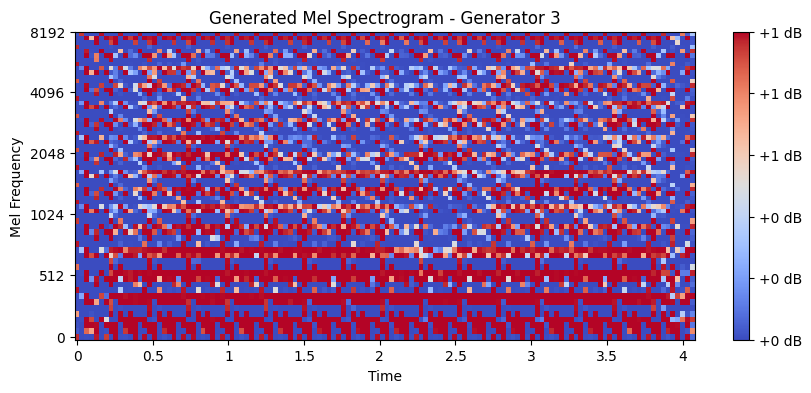

Real sample statistics:
  Min: -1.0000, Max: 0.7726, Mean: -0.3278


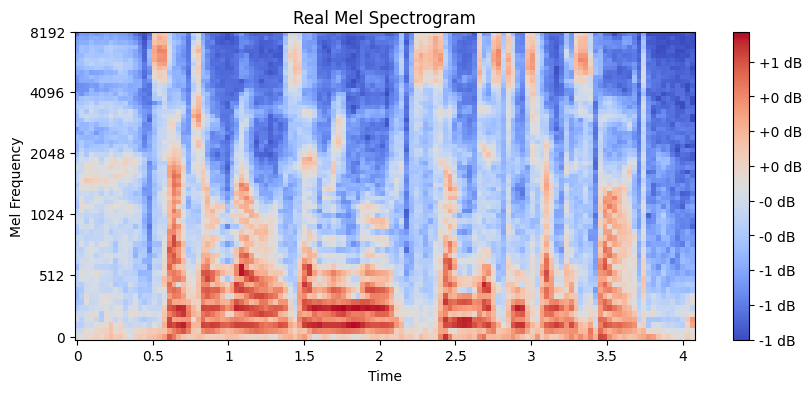

Batch [1] - D Loss: 0.0191, G Loss: 7.6046
[21/50] D Loss: 0.0191, G Loss: 7.6046
Batch [2] - D Loss: 0.0126, G Loss: 8.4028
[21/50] D Loss: 0.0126, G Loss: 8.4028
Batch [3] - D Loss: 0.0118, G Loss: 8.9958
[21/50] D Loss: 0.0118, G Loss: 8.9958
Batch [4] - D Loss: 0.0096, G Loss: 8.7730
[21/50] D Loss: 0.0096, G Loss: 8.7730
Batch [5] - D Loss: 0.0088, G Loss: 8.3835
[21/50] D Loss: 0.0088, G Loss: 8.3835
Batch [6] - D Loss: 0.0128, G Loss: 8.1846
[21/50] D Loss: 0.0128, G Loss: 8.1846
Batch [7] - D Loss: 0.0117, G Loss: 7.7112
[21/50] D Loss: 0.0117, G Loss: 7.7112
Batch [8] - D Loss: 0.0128, G Loss: 7.5692
[21/50] D Loss: 0.0128, G Loss: 7.5692
Batch [9] - D Loss: 0.0189, G Loss: 8.3730
[21/50] D Loss: 0.0189, G Loss: 8.3730
Batch [10] - D Loss: 0.0214, G Loss: 8.2266
[21/50] D Loss: 0.0214, G Loss: 8.2266
Batch [11] - D Loss: 0.0234, G Loss: 7.8878
[21/50] D Loss: 0.0234, G Loss: 7.8878
Batch [12] - D Loss: 0.0162, G Loss: 7.8448
[21/50] D Loss: 0.0162, G Loss: 7.8448
Batch [13] - 

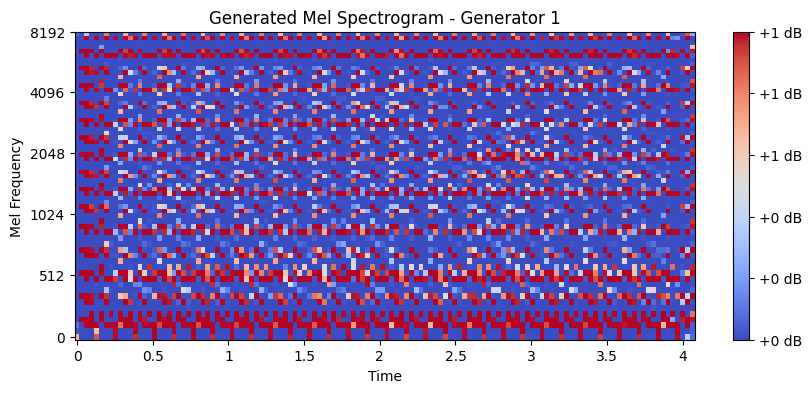

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2680


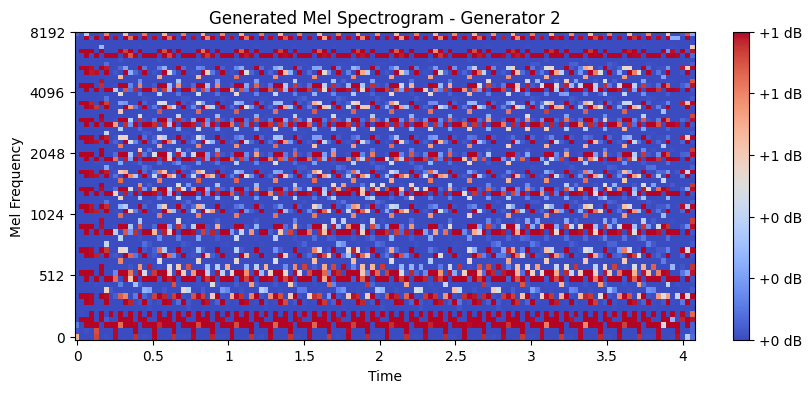

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2757


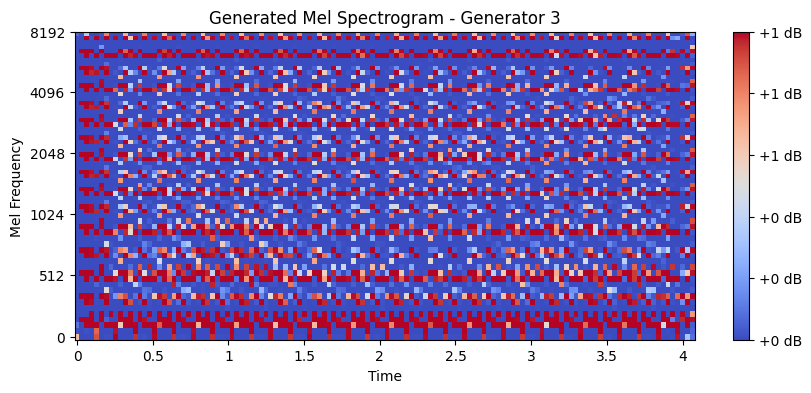

Real sample statistics:
  Min: -1.0000, Max: 0.9495, Mean: -0.1684


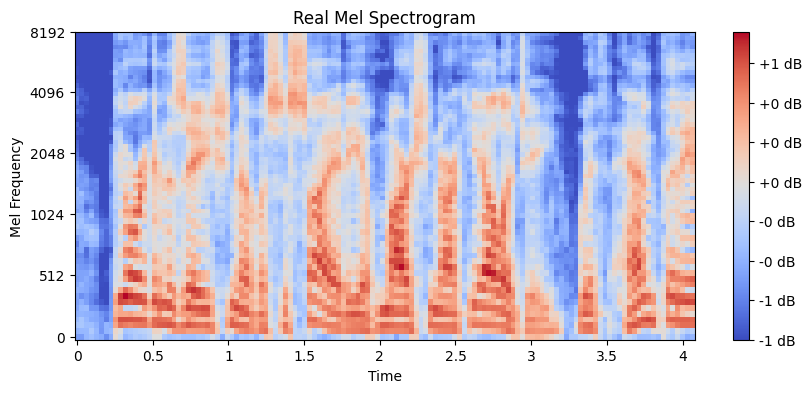

Batch [1] - D Loss: 0.0181, G Loss: 8.0713
[22/50] D Loss: 0.0181, G Loss: 8.0713
Batch [2] - D Loss: 0.0324, G Loss: 8.1268
[22/50] D Loss: 0.0324, G Loss: 8.1268
Batch [3] - D Loss: 0.0181, G Loss: 8.0268
[22/50] D Loss: 0.0181, G Loss: 8.0268
Batch [4] - D Loss: 0.0112, G Loss: 8.2010
[22/50] D Loss: 0.0112, G Loss: 8.2010
Batch [5] - D Loss: 0.0177, G Loss: 8.5974
[22/50] D Loss: 0.0177, G Loss: 8.5974
Batch [6] - D Loss: 0.0099, G Loss: 8.5611
[22/50] D Loss: 0.0099, G Loss: 8.5611
Batch [7] - D Loss: 0.0108, G Loss: 8.7538
[22/50] D Loss: 0.0108, G Loss: 8.7538
Batch [8] - D Loss: 0.0094, G Loss: 8.2672
[22/50] D Loss: 0.0094, G Loss: 8.2672
Batch [9] - D Loss: 0.0076, G Loss: 7.9051
[22/50] D Loss: 0.0076, G Loss: 7.9051
Batch [10] - D Loss: 0.0086, G Loss: 8.2590
[22/50] D Loss: 0.0086, G Loss: 8.2590
Batch [11] - D Loss: 0.0061, G Loss: 8.3111
[22/50] D Loss: 0.0061, G Loss: 8.3111
Batch [12] - D Loss: 0.0069, G Loss: 8.1962
[22/50] D Loss: 0.0069, G Loss: 8.1962
Batch [13] - 

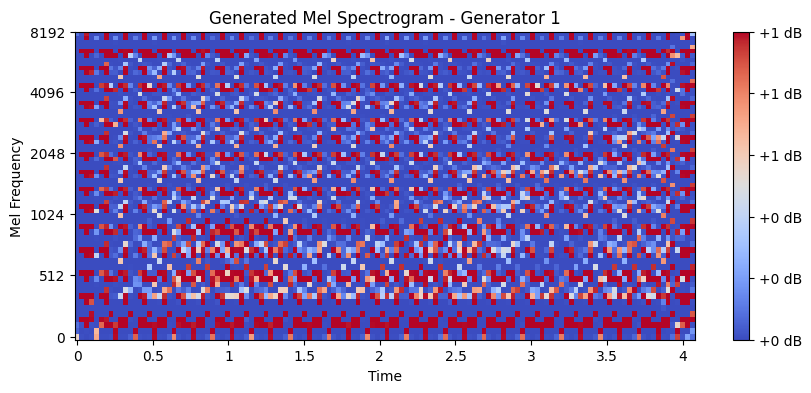

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2720


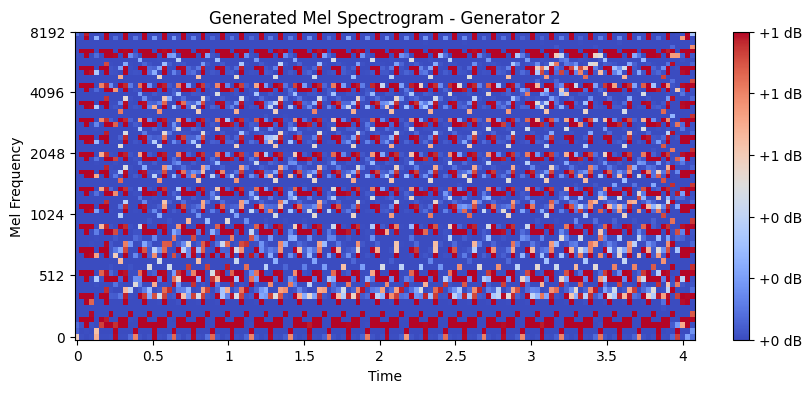

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2951


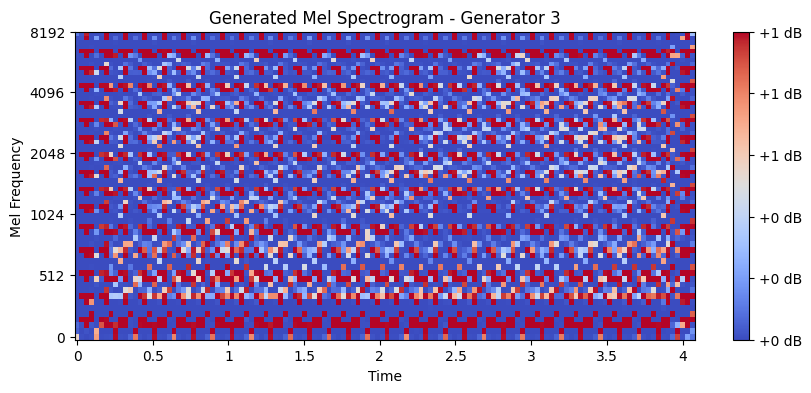

Real sample statistics:
  Min: -0.8931, Max: 1.0000, Mean: -0.0713


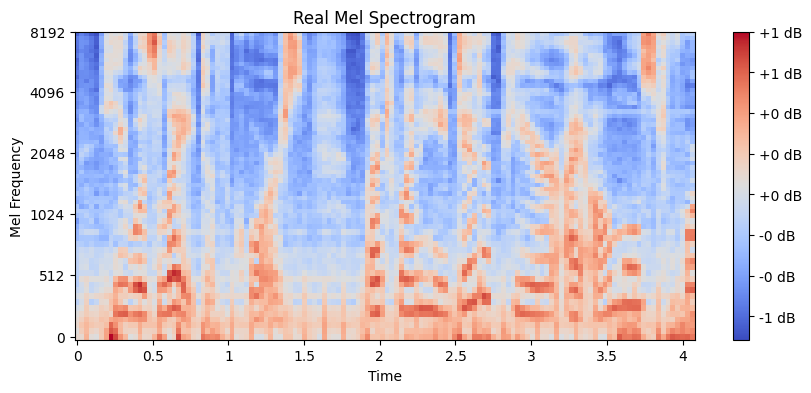

Batch [1] - D Loss: 0.0096, G Loss: 8.6266
[23/50] D Loss: 0.0096, G Loss: 8.6266
Batch [2] - D Loss: 0.0197, G Loss: 8.8360
[23/50] D Loss: 0.0197, G Loss: 8.8360
Batch [3] - D Loss: 0.0266, G Loss: 8.5917
[23/50] D Loss: 0.0266, G Loss: 8.5917
Batch [4] - D Loss: 0.0198, G Loss: 8.3114
[23/50] D Loss: 0.0198, G Loss: 8.3114
Batch [5] - D Loss: 0.0188, G Loss: 8.3623
[23/50] D Loss: 0.0188, G Loss: 8.3623
Batch [6] - D Loss: 0.0268, G Loss: 8.8957
[23/50] D Loss: 0.0268, G Loss: 8.8957
Batch [7] - D Loss: 0.0159, G Loss: 9.5696
[23/50] D Loss: 0.0159, G Loss: 9.5696
Batch [8] - D Loss: 0.0223, G Loss: 9.1528
[23/50] D Loss: 0.0223, G Loss: 9.1528
Batch [9] - D Loss: 0.0240, G Loss: 9.0467
[23/50] D Loss: 0.0240, G Loss: 9.0467
Batch [10] - D Loss: 0.0130, G Loss: 8.8037
[23/50] D Loss: 0.0130, G Loss: 8.8037
Batch [11] - D Loss: 0.0114, G Loss: 8.5944
[23/50] D Loss: 0.0114, G Loss: 8.5944
Batch [12] - D Loss: 0.0108, G Loss: 8.6834
[23/50] D Loss: 0.0108, G Loss: 8.6834
Batch [13] - 

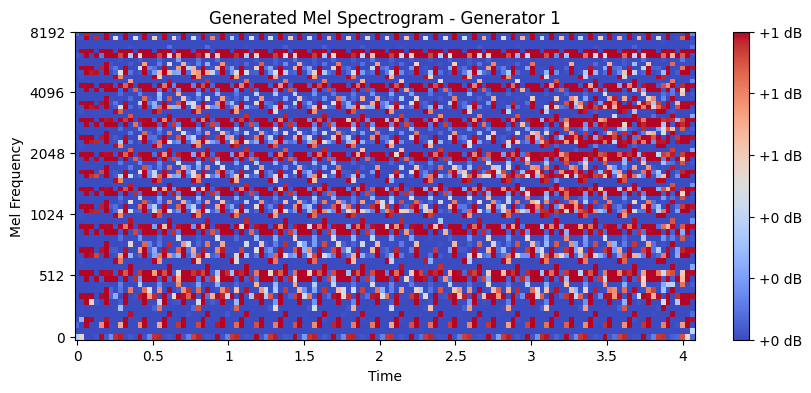

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3460


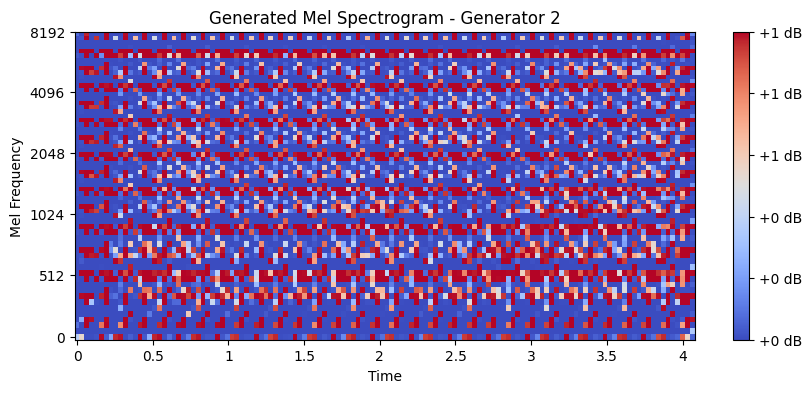

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3467


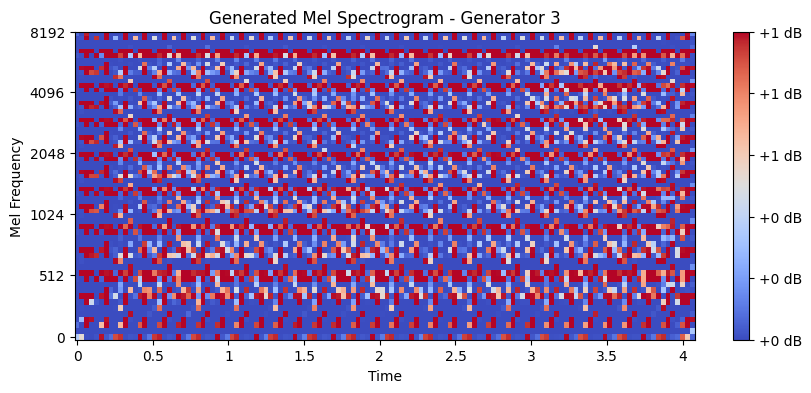

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.3066


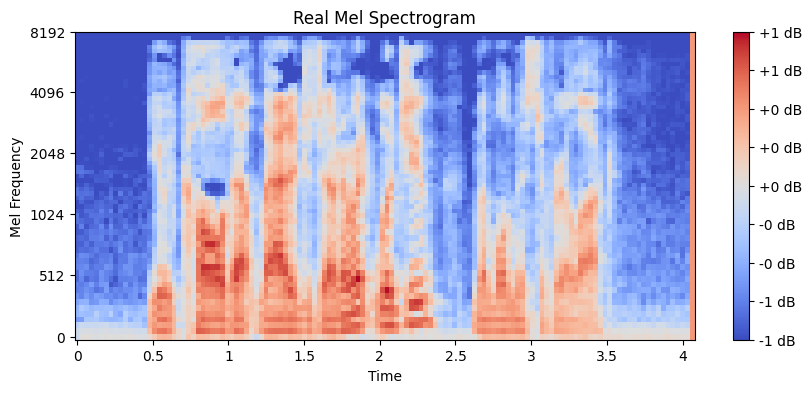

Batch [1] - D Loss: 0.0190, G Loss: 8.5892
[24/50] D Loss: 0.0190, G Loss: 8.5892
Batch [2] - D Loss: 0.0089, G Loss: 8.5007
[24/50] D Loss: 0.0089, G Loss: 8.5007
Batch [3] - D Loss: 0.0064, G Loss: 8.2381
[24/50] D Loss: 0.0064, G Loss: 8.2381
Batch [4] - D Loss: 0.0189, G Loss: 7.6386
[24/50] D Loss: 0.0189, G Loss: 7.6386
Batch [5] - D Loss: 0.0131, G Loss: 8.1659
[24/50] D Loss: 0.0131, G Loss: 8.1659
Batch [6] - D Loss: 0.0129, G Loss: 8.6748
[24/50] D Loss: 0.0129, G Loss: 8.6748
Batch [7] - D Loss: 0.0151, G Loss: 8.8687
[24/50] D Loss: 0.0151, G Loss: 8.8687
Batch [8] - D Loss: 0.0068, G Loss: 9.0500
[24/50] D Loss: 0.0068, G Loss: 9.0500
Batch [9] - D Loss: 0.0114, G Loss: 9.0470
[24/50] D Loss: 0.0114, G Loss: 9.0470
Batch [10] - D Loss: 0.0047, G Loss: 8.6956
[24/50] D Loss: 0.0047, G Loss: 8.6956
Batch [11] - D Loss: 0.0089, G Loss: 8.8304
[24/50] D Loss: 0.0089, G Loss: 8.8304
Batch [12] - D Loss: 0.0093, G Loss: 8.4043
[24/50] D Loss: 0.0093, G Loss: 8.4043
Batch [13] - 

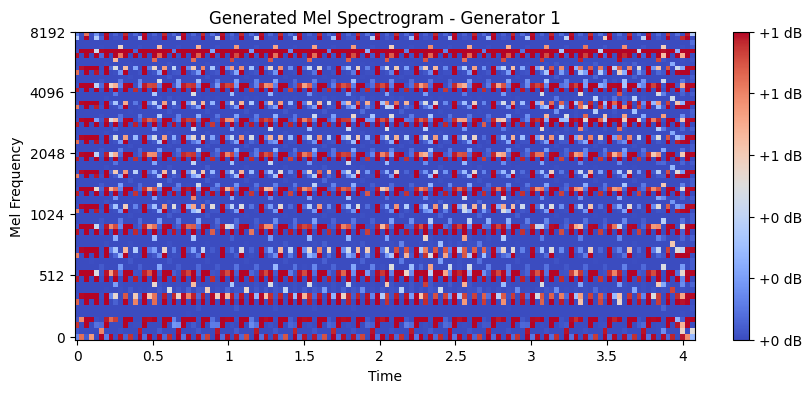

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2487


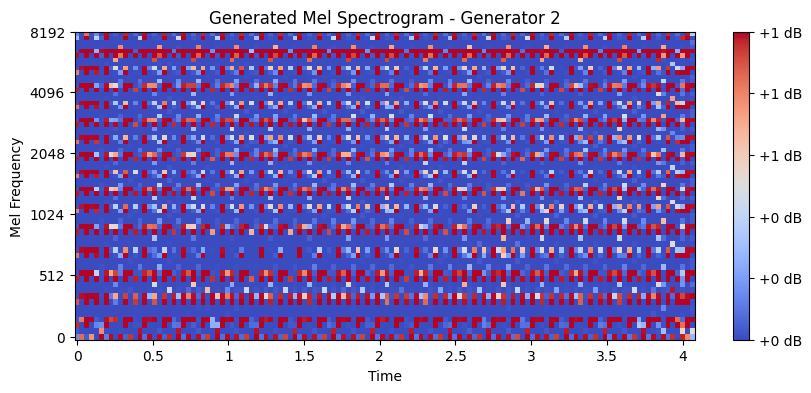

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2341


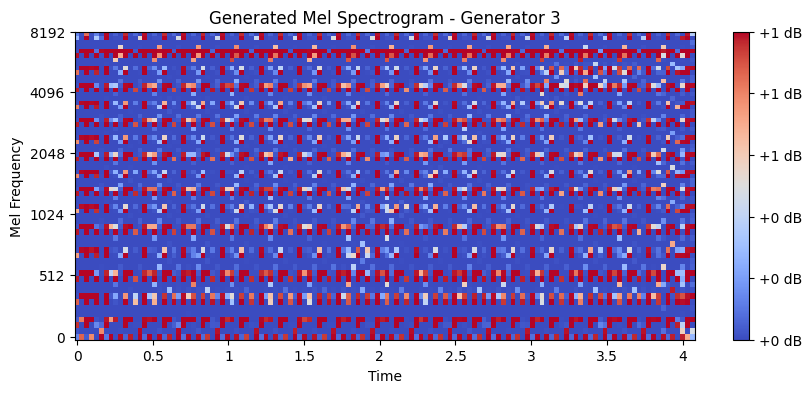

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2828


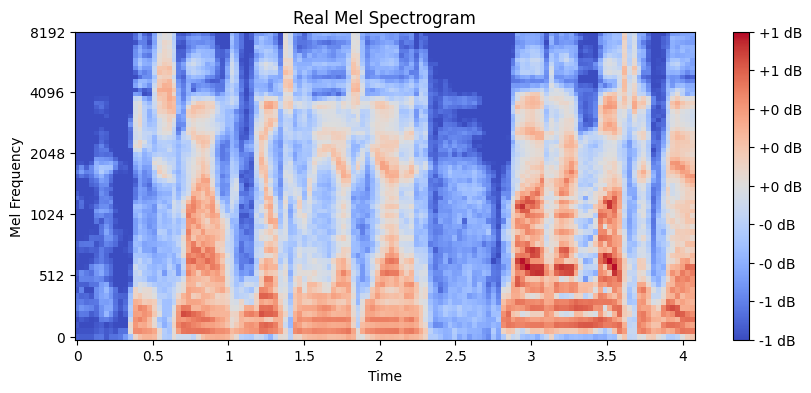

Batch [1] - D Loss: 0.0165, G Loss: 9.0472
[25/50] D Loss: 0.0165, G Loss: 9.0472
Batch [2] - D Loss: 0.0067, G Loss: 8.7384
[25/50] D Loss: 0.0067, G Loss: 8.7384
Batch [3] - D Loss: 0.0075, G Loss: 9.3736
[25/50] D Loss: 0.0075, G Loss: 9.3736
Batch [4] - D Loss: 0.0088, G Loss: 9.7521
[25/50] D Loss: 0.0088, G Loss: 9.7521
Batch [5] - D Loss: 0.0066, G Loss: 9.8336
[25/50] D Loss: 0.0066, G Loss: 9.8336
Batch [6] - D Loss: 0.0067, G Loss: 9.4217
[25/50] D Loss: 0.0067, G Loss: 9.4217
Batch [7] - D Loss: 0.0134, G Loss: 9.0419
[25/50] D Loss: 0.0134, G Loss: 9.0419
Batch [8] - D Loss: 0.0084, G Loss: 8.5416
[25/50] D Loss: 0.0084, G Loss: 8.5416
Batch [9] - D Loss: 0.0140, G Loss: 9.6544
[25/50] D Loss: 0.0140, G Loss: 9.6544
Batch [10] - D Loss: 0.0088, G Loss: 9.5858
[25/50] D Loss: 0.0088, G Loss: 9.5858
Batch [11] - D Loss: 0.0099, G Loss: 9.8282
[25/50] D Loss: 0.0099, G Loss: 9.8282
Batch [12] - D Loss: 0.0116, G Loss: 9.6364
[25/50] D Loss: 0.0116, G Loss: 9.6364
Batch [13] - 

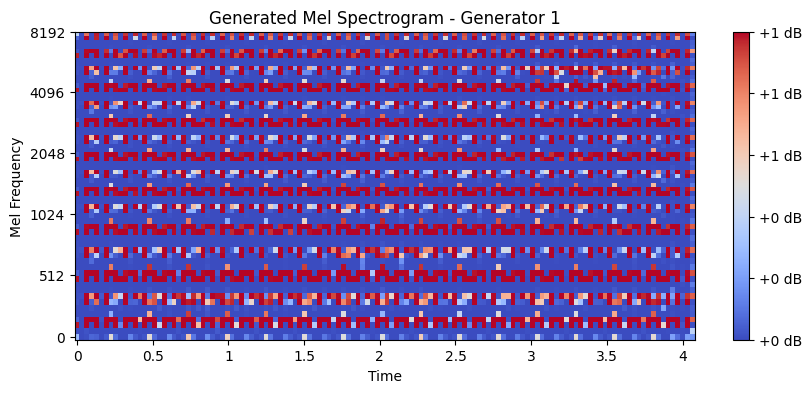

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2943


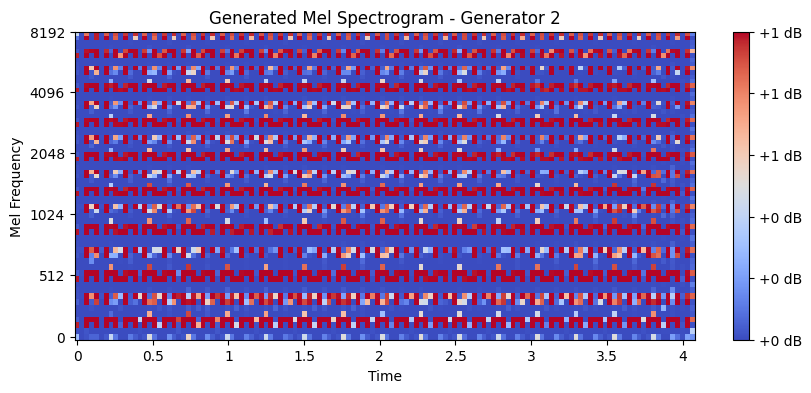

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3022


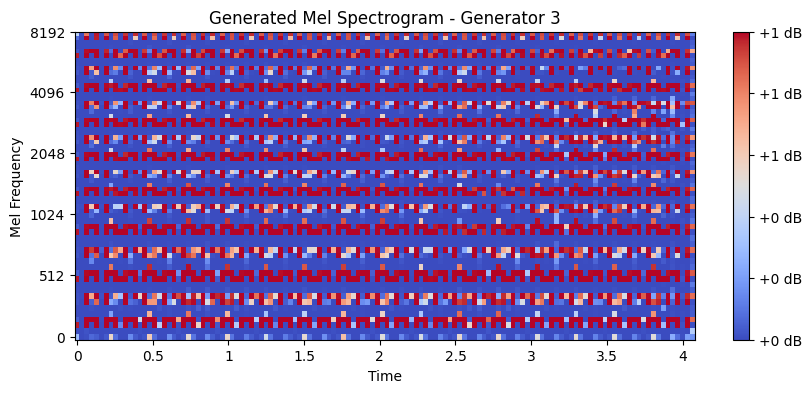

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2930


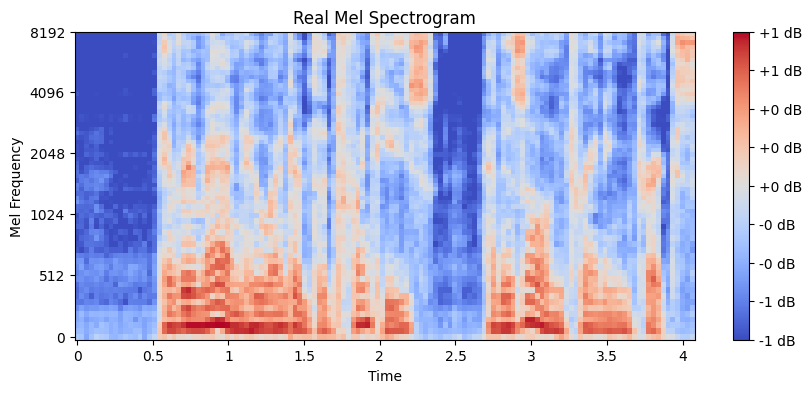

Batch [1] - D Loss: 0.0091, G Loss: 14.3782
[26/50] D Loss: 0.0091, G Loss: 14.3782
Batch [2] - D Loss: 0.0149, G Loss: 12.9764
[26/50] D Loss: 0.0149, G Loss: 12.9764
Batch [3] - D Loss: 0.0078, G Loss: 11.2703
[26/50] D Loss: 0.0078, G Loss: 11.2703
Batch [4] - D Loss: 0.0062, G Loss: 10.6597
[26/50] D Loss: 0.0062, G Loss: 10.6597
Batch [5] - D Loss: 0.0050, G Loss: 9.6192
[26/50] D Loss: 0.0050, G Loss: 9.6192
Batch [6] - D Loss: 0.0029, G Loss: 8.9041
[26/50] D Loss: 0.0029, G Loss: 8.9041
Batch [7] - D Loss: 0.0038, G Loss: 8.1867
[26/50] D Loss: 0.0038, G Loss: 8.1867
Batch [8] - D Loss: 0.0058, G Loss: 8.3346
[26/50] D Loss: 0.0058, G Loss: 8.3346
Batch [9] - D Loss: 0.0137, G Loss: 8.5446
[26/50] D Loss: 0.0137, G Loss: 8.5446
Batch [10] - D Loss: 0.0071, G Loss: 9.5865
[26/50] D Loss: 0.0071, G Loss: 9.5865
Batch [11] - D Loss: 0.0054, G Loss: 8.9552
[26/50] D Loss: 0.0054, G Loss: 8.9552
Batch [12] - D Loss: 0.0170, G Loss: 10.0113
[26/50] D Loss: 0.0170, G Loss: 10.0113
Bat

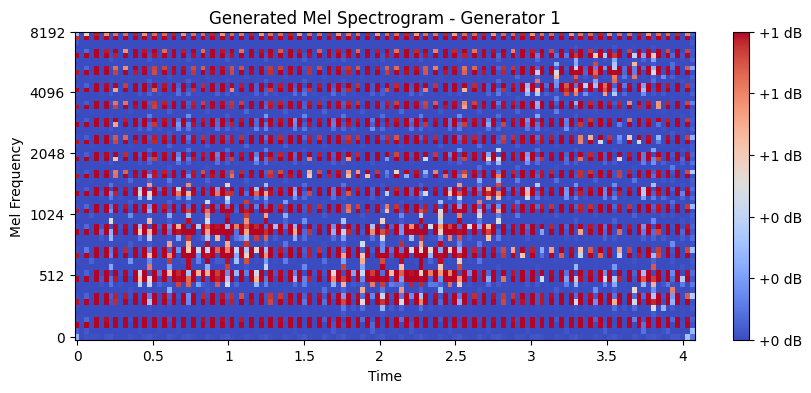

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2640


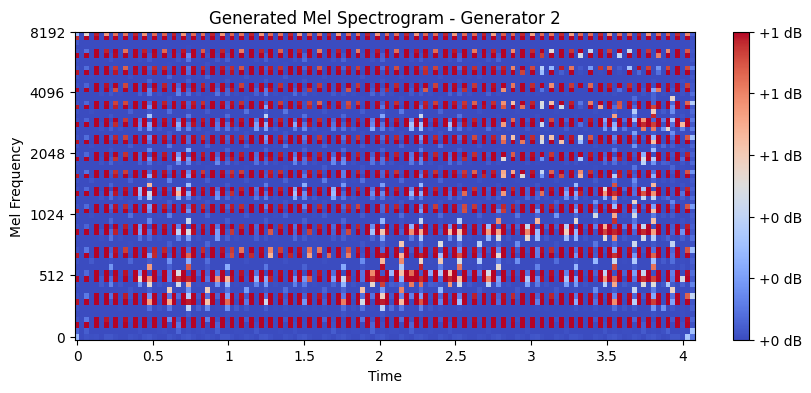

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2674


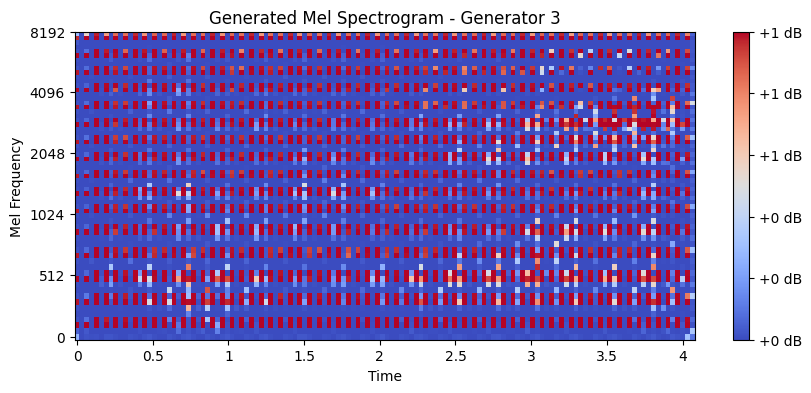

Real sample statistics:
  Min: -1.0000, Max: 0.8968, Mean: -0.3162


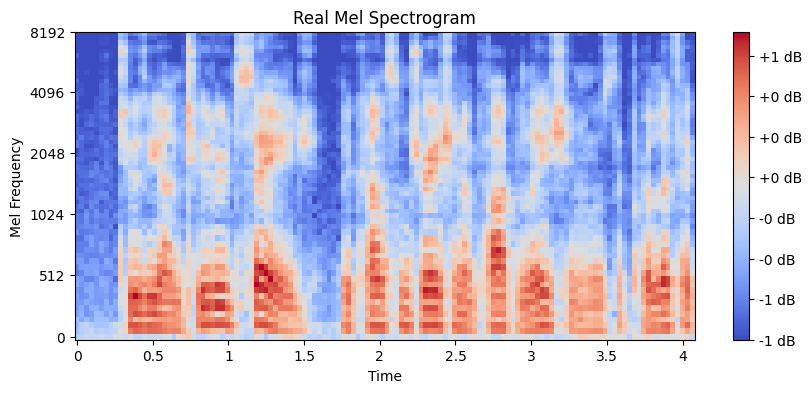

Batch [1] - D Loss: 0.0070, G Loss: 11.5404
[27/50] D Loss: 0.0070, G Loss: 11.5404
Batch [2] - D Loss: 0.0099, G Loss: 11.2143
[27/50] D Loss: 0.0099, G Loss: 11.2143
Batch [3] - D Loss: 0.0203, G Loss: 10.8757
[27/50] D Loss: 0.0203, G Loss: 10.8757
Batch [4] - D Loss: 0.0104, G Loss: 10.7761
[27/50] D Loss: 0.0104, G Loss: 10.7761
Batch [5] - D Loss: 0.0088, G Loss: 10.6884
[27/50] D Loss: 0.0088, G Loss: 10.6884
Batch [6] - D Loss: 0.0066, G Loss: 10.5653
[27/50] D Loss: 0.0066, G Loss: 10.5653
Batch [7] - D Loss: 0.0088, G Loss: 10.4509
[27/50] D Loss: 0.0088, G Loss: 10.4509
Batch [8] - D Loss: 0.0110, G Loss: 10.2819
[27/50] D Loss: 0.0110, G Loss: 10.2819
Batch [9] - D Loss: 0.0106, G Loss: 10.2229
[27/50] D Loss: 0.0106, G Loss: 10.2229
Batch [10] - D Loss: 0.0096, G Loss: 10.1579
[27/50] D Loss: 0.0096, G Loss: 10.1579
Batch [11] - D Loss: 0.0071, G Loss: 9.9036
[27/50] D Loss: 0.0071, G Loss: 9.9036
Batch [12] - D Loss: 0.0080, G Loss: 9.7907
[27/50] D Loss: 0.0080, G Loss: 

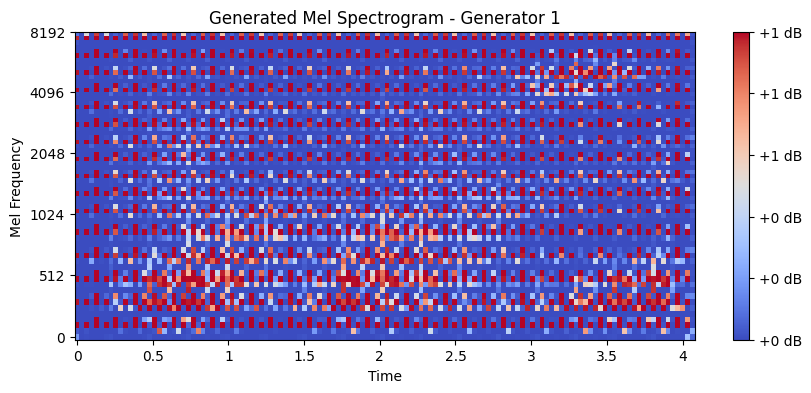

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2370


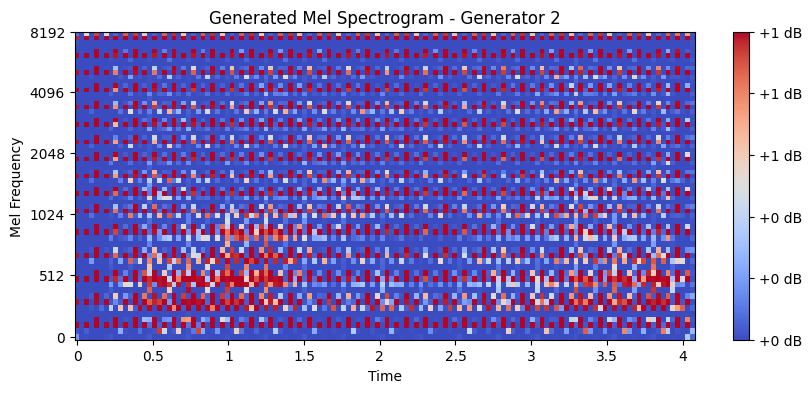

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2808


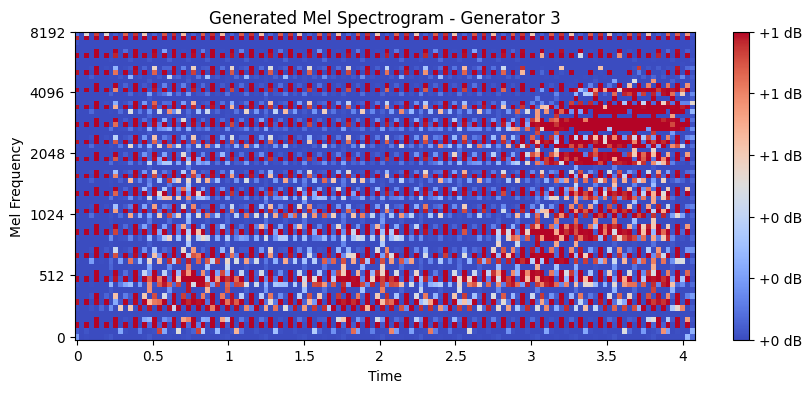

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1261


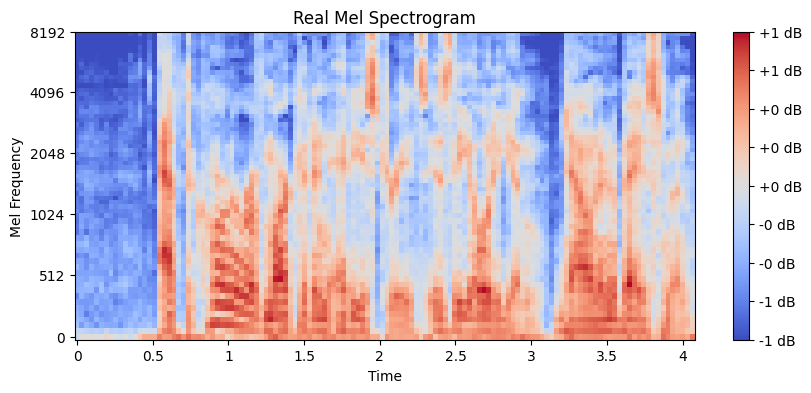

Batch [1] - D Loss: 0.0097, G Loss: 8.9564
[28/50] D Loss: 0.0097, G Loss: 8.9564
Batch [2] - D Loss: 0.0077, G Loss: 9.1218
[28/50] D Loss: 0.0077, G Loss: 9.1218
Batch [3] - D Loss: 0.0049, G Loss: 8.9682
[28/50] D Loss: 0.0049, G Loss: 8.9682
Batch [4] - D Loss: 0.0121, G Loss: 8.7243
[28/50] D Loss: 0.0121, G Loss: 8.7243
Batch [5] - D Loss: 0.0176, G Loss: 8.4289
[28/50] D Loss: 0.0176, G Loss: 8.4289
Batch [6] - D Loss: 0.0098, G Loss: 8.7350
[28/50] D Loss: 0.0098, G Loss: 8.7350
Batch [7] - D Loss: 0.0102, G Loss: 9.1566
[28/50] D Loss: 0.0102, G Loss: 9.1566
Batch [8] - D Loss: 0.0185, G Loss: 9.4640
[28/50] D Loss: 0.0185, G Loss: 9.4640
Batch [9] - D Loss: 0.0090, G Loss: 9.5834
[28/50] D Loss: 0.0090, G Loss: 9.5834
Batch [10] - D Loss: 0.0097, G Loss: 9.2026
[28/50] D Loss: 0.0097, G Loss: 9.2026
Batch [11] - D Loss: 0.0057, G Loss: 9.2009
[28/50] D Loss: 0.0057, G Loss: 9.2009
Batch [12] - D Loss: 0.0060, G Loss: 9.2607
[28/50] D Loss: 0.0060, G Loss: 9.2607
Batch [13] - 

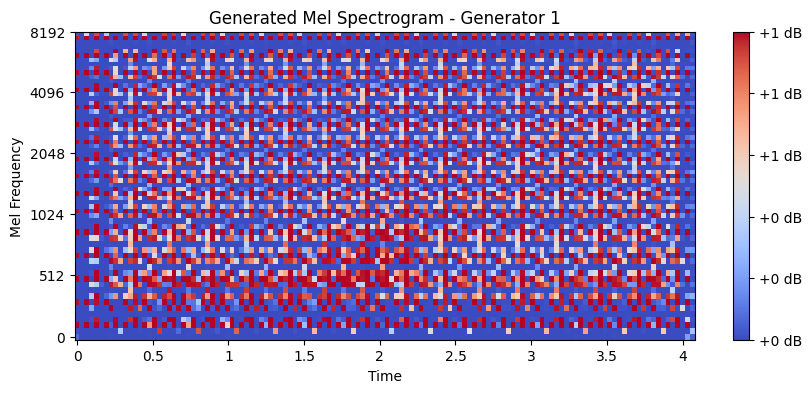

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3390


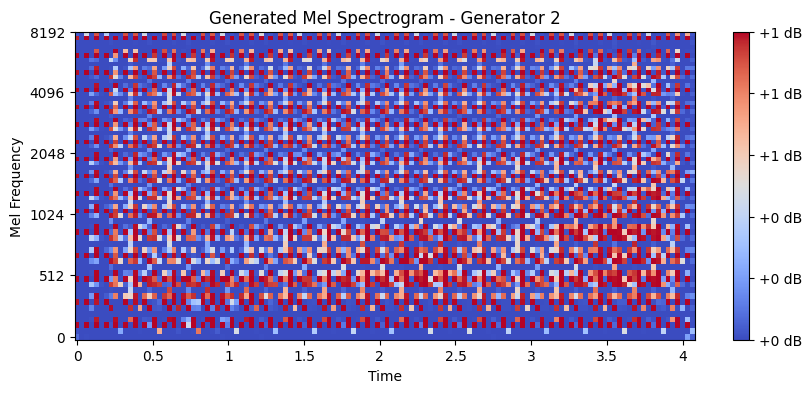

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3369


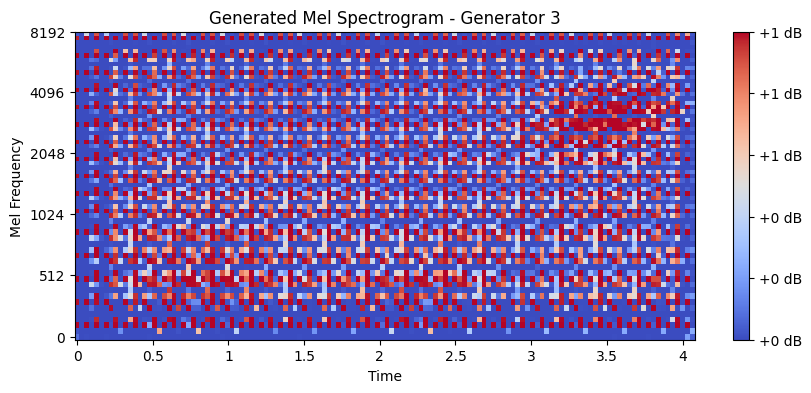

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.3106


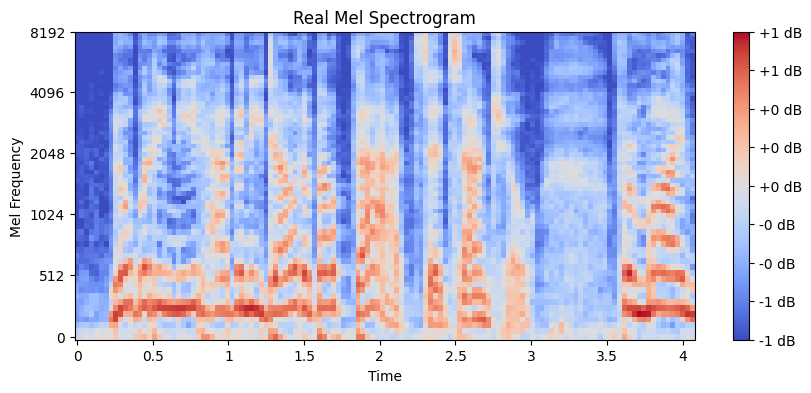

Batch [1] - D Loss: 0.0063, G Loss: 9.4440
[29/50] D Loss: 0.0063, G Loss: 9.4440
Batch [2] - D Loss: 0.0069, G Loss: 9.5784
[29/50] D Loss: 0.0069, G Loss: 9.5784
Batch [3] - D Loss: 0.0066, G Loss: 9.9993
[29/50] D Loss: 0.0066, G Loss: 9.9993
Batch [4] - D Loss: 0.0103, G Loss: 9.6380
[29/50] D Loss: 0.0103, G Loss: 9.6380
Batch [5] - D Loss: 0.0045, G Loss: 9.4593
[29/50] D Loss: 0.0045, G Loss: 9.4593
Batch [6] - D Loss: 0.0037, G Loss: 9.1927
[29/50] D Loss: 0.0037, G Loss: 9.1927
Batch [7] - D Loss: 0.0039, G Loss: 9.0831
[29/50] D Loss: 0.0039, G Loss: 9.0831
Batch [8] - D Loss: 0.0055, G Loss: 9.1072
[29/50] D Loss: 0.0055, G Loss: 9.1072
Batch [9] - D Loss: 0.0042, G Loss: 9.2506
[29/50] D Loss: 0.0042, G Loss: 9.2506
Batch [10] - D Loss: 0.0038, G Loss: 9.7195
[29/50] D Loss: 0.0038, G Loss: 9.7195
Batch [11] - D Loss: 0.0068, G Loss: 9.3069
[29/50] D Loss: 0.0068, G Loss: 9.3069
Batch [12] - D Loss: 0.0052, G Loss: 9.1974
[29/50] D Loss: 0.0052, G Loss: 9.1974
Batch [13] - 

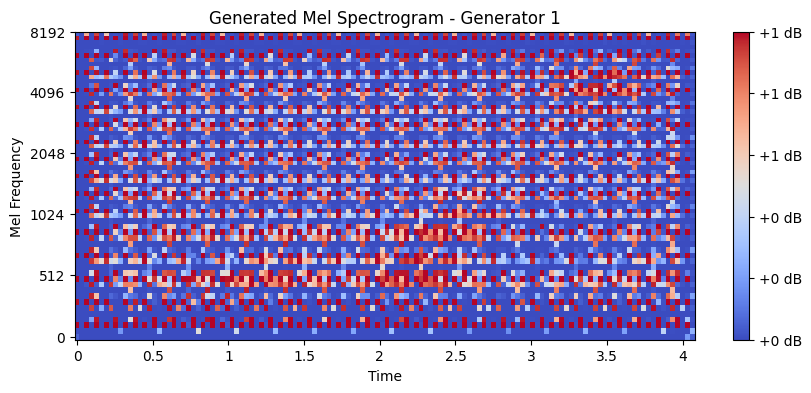

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2847


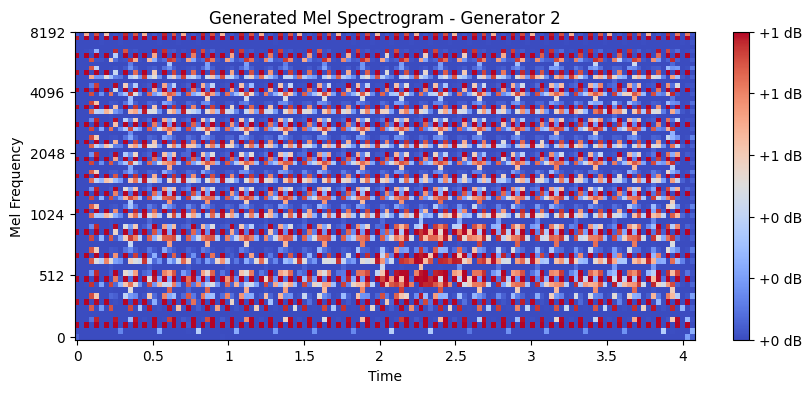

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2860


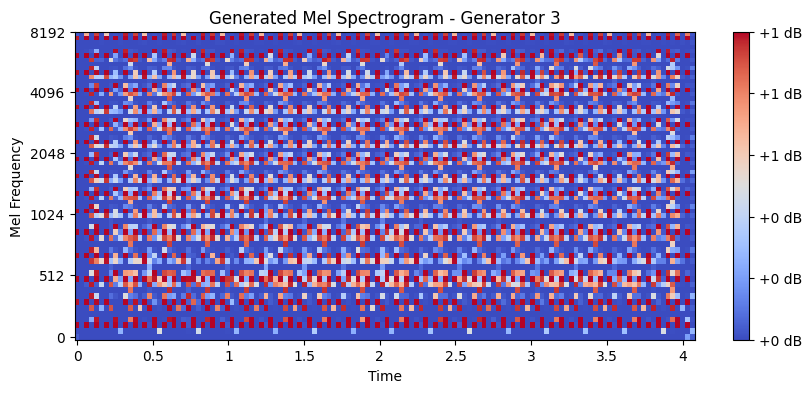

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2337


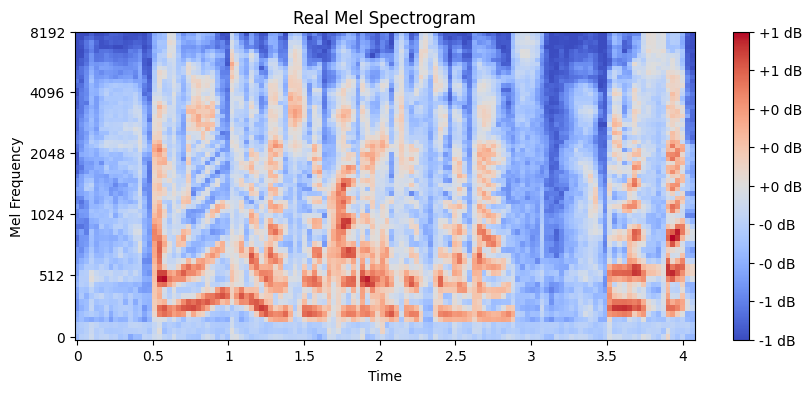

Batch [1] - D Loss: 0.0043, G Loss: 9.1267
[30/50] D Loss: 0.0043, G Loss: 9.1267
Batch [2] - D Loss: 0.0027, G Loss: 9.0299
[30/50] D Loss: 0.0027, G Loss: 9.0299
Batch [3] - D Loss: 0.0040, G Loss: 9.2176
[30/50] D Loss: 0.0040, G Loss: 9.2176
Batch [4] - D Loss: 0.0056, G Loss: 10.2842
[30/50] D Loss: 0.0056, G Loss: 10.2842
Batch [5] - D Loss: 0.0049, G Loss: 9.3709
[30/50] D Loss: 0.0049, G Loss: 9.3709
Batch [6] - D Loss: 0.0058, G Loss: 9.8082
[30/50] D Loss: 0.0058, G Loss: 9.8082
Batch [7] - D Loss: 0.0089, G Loss: 9.2097
[30/50] D Loss: 0.0089, G Loss: 9.2097
Batch [8] - D Loss: 0.0055, G Loss: 9.3237
[30/50] D Loss: 0.0055, G Loss: 9.3237
Batch [9] - D Loss: 0.0088, G Loss: 8.6015
[30/50] D Loss: 0.0088, G Loss: 8.6015
Batch [10] - D Loss: 0.0139, G Loss: 9.2741
[30/50] D Loss: 0.0139, G Loss: 9.2741
Batch [11] - D Loss: 0.0171, G Loss: 9.2783
[30/50] D Loss: 0.0171, G Loss: 9.2783
Batch [12] - D Loss: 0.0128, G Loss: 9.0950
[30/50] D Loss: 0.0128, G Loss: 9.0950
Batch [13] 

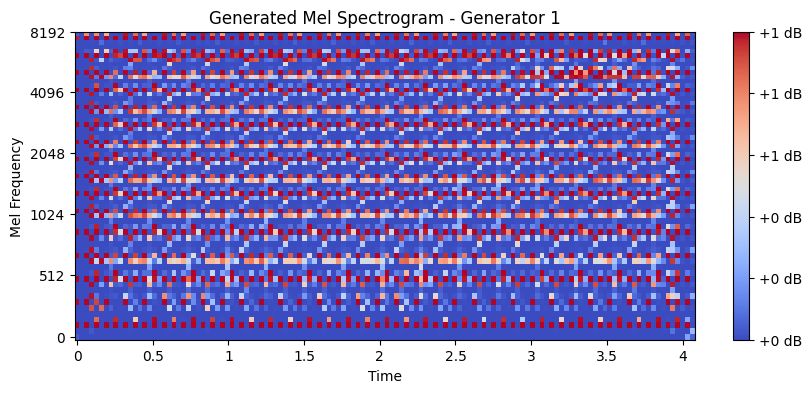

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2552


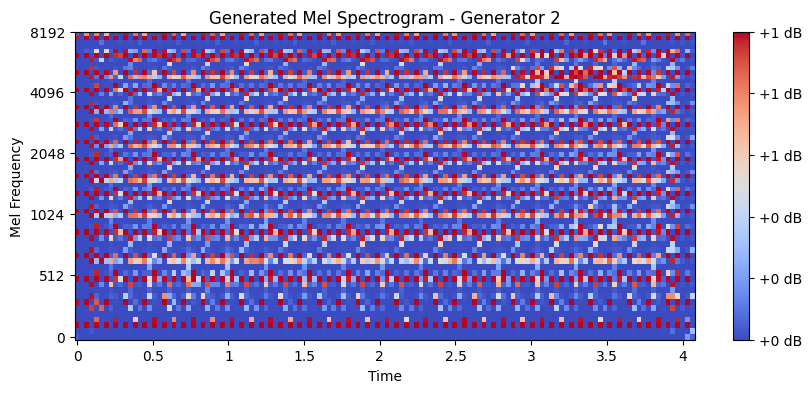

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2464


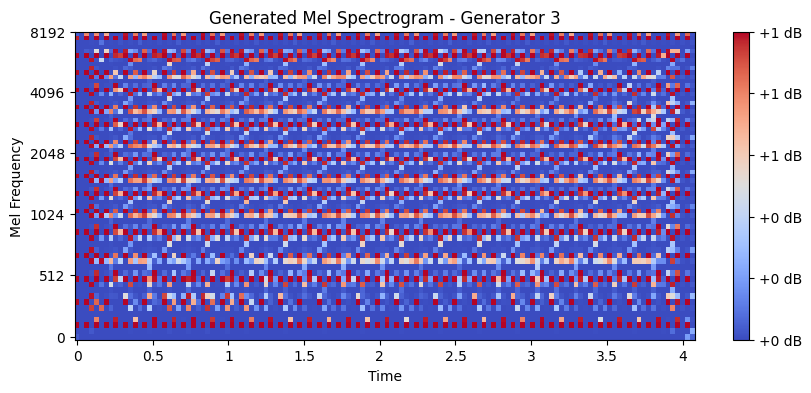

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1797


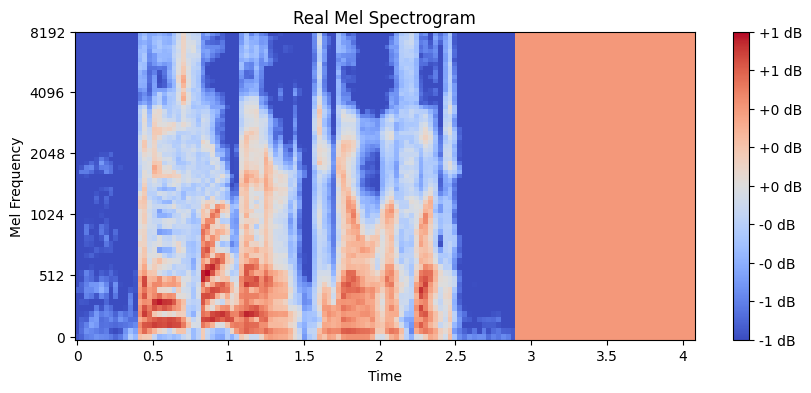

Batch [1] - D Loss: 0.0353, G Loss: 9.1344
[31/50] D Loss: 0.0353, G Loss: 9.1344
Batch [2] - D Loss: 0.0146, G Loss: 9.3424
[31/50] D Loss: 0.0146, G Loss: 9.3424
Batch [3] - D Loss: 0.0133, G Loss: 9.3123
[31/50] D Loss: 0.0133, G Loss: 9.3123
Batch [4] - D Loss: 0.0100, G Loss: 8.9458
[31/50] D Loss: 0.0100, G Loss: 8.9458
Batch [5] - D Loss: 0.0135, G Loss: 8.9283
[31/50] D Loss: 0.0135, G Loss: 8.9283
Batch [6] - D Loss: 0.0070, G Loss: 8.9978
[31/50] D Loss: 0.0070, G Loss: 8.9978
Batch [7] - D Loss: 0.0072, G Loss: 9.3056
[31/50] D Loss: 0.0072, G Loss: 9.3056
Batch [8] - D Loss: 0.0085, G Loss: 8.9226
[31/50] D Loss: 0.0085, G Loss: 8.9226
Batch [9] - D Loss: 0.0058, G Loss: 9.0782
[31/50] D Loss: 0.0058, G Loss: 9.0782
Batch [10] - D Loss: 0.0098, G Loss: 9.2038
[31/50] D Loss: 0.0098, G Loss: 9.2038
Batch [11] - D Loss: 0.0097, G Loss: 9.0847
[31/50] D Loss: 0.0097, G Loss: 9.0847
Batch [12] - D Loss: 0.0103, G Loss: 9.4312
[31/50] D Loss: 0.0103, G Loss: 9.4312
Batch [13] - 

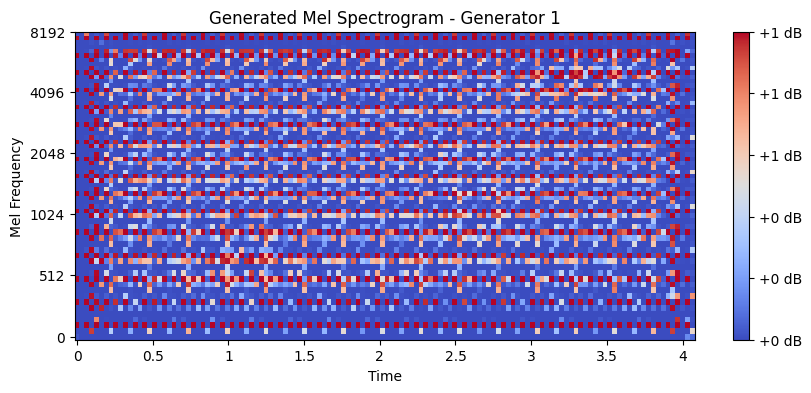

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2534


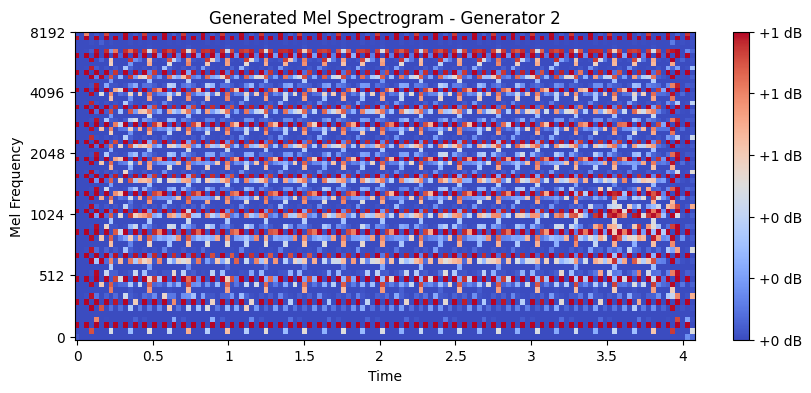

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2532


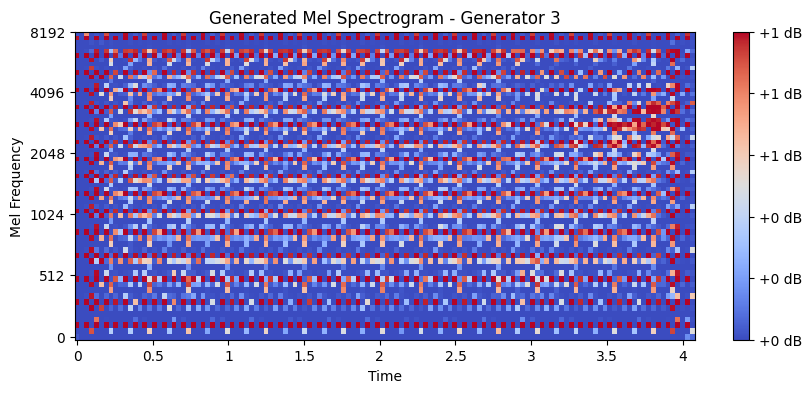

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: 0.0258


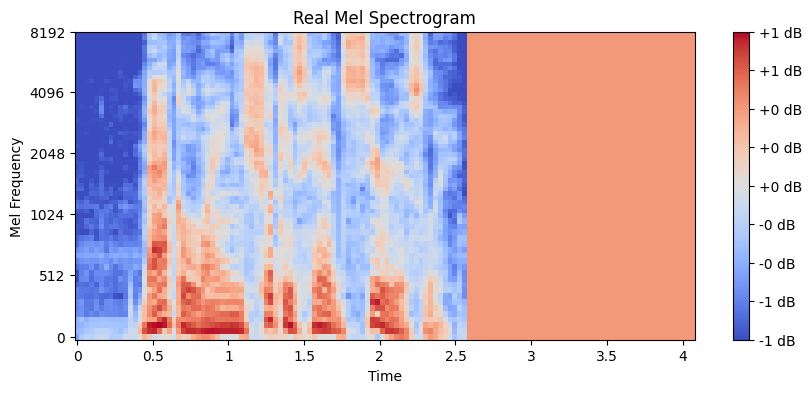

Batch [1] - D Loss: 0.0125, G Loss: 9.2152
[32/50] D Loss: 0.0125, G Loss: 9.2152
Batch [2] - D Loss: 0.0151, G Loss: 9.2869
[32/50] D Loss: 0.0151, G Loss: 9.2869
Batch [3] - D Loss: 0.0166, G Loss: 9.6862
[32/50] D Loss: 0.0166, G Loss: 9.6862
Batch [4] - D Loss: 0.0132, G Loss: 10.2711
[32/50] D Loss: 0.0132, G Loss: 10.2711
Batch [5] - D Loss: 0.0165, G Loss: 10.2011
[32/50] D Loss: 0.0165, G Loss: 10.2011
Batch [6] - D Loss: 0.0069, G Loss: 9.8363
[32/50] D Loss: 0.0069, G Loss: 9.8363
Batch [7] - D Loss: 0.0187, G Loss: 9.6984
[32/50] D Loss: 0.0187, G Loss: 9.6984
Batch [8] - D Loss: 0.0145, G Loss: 10.0798
[32/50] D Loss: 0.0145, G Loss: 10.0798
Batch [9] - D Loss: 0.0172, G Loss: 9.5987
[32/50] D Loss: 0.0172, G Loss: 9.5987
Batch [10] - D Loss: 0.0232, G Loss: 9.7553
[32/50] D Loss: 0.0232, G Loss: 9.7553
Batch [11] - D Loss: 0.0147, G Loss: 9.7156
[32/50] D Loss: 0.0147, G Loss: 9.7156
Batch [12] - D Loss: 0.0066, G Loss: 9.8993
[32/50] D Loss: 0.0066, G Loss: 9.8993
Batch [

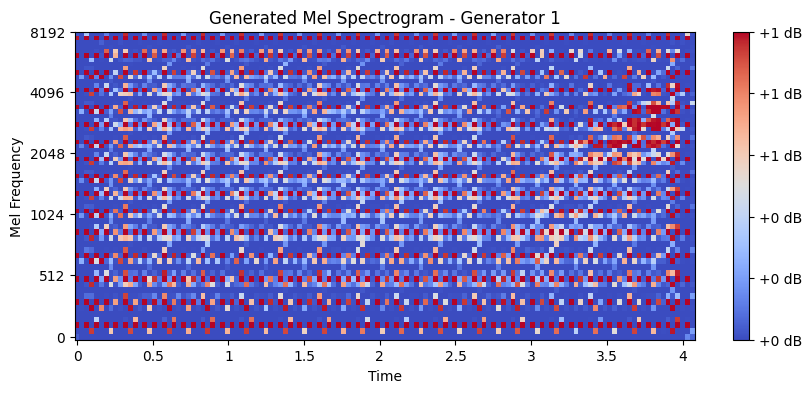

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2191


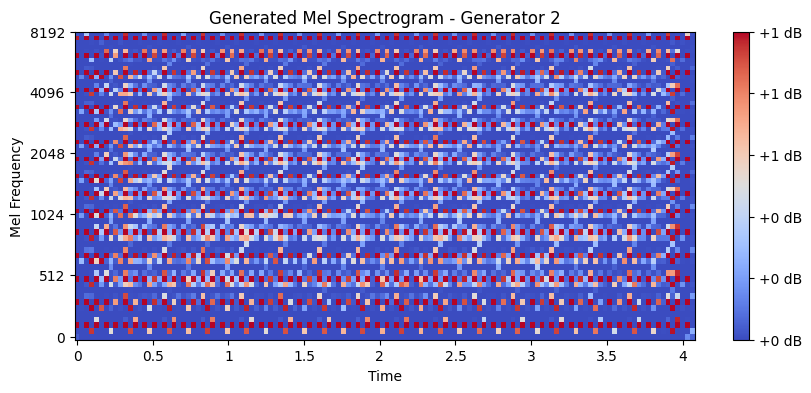

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2320


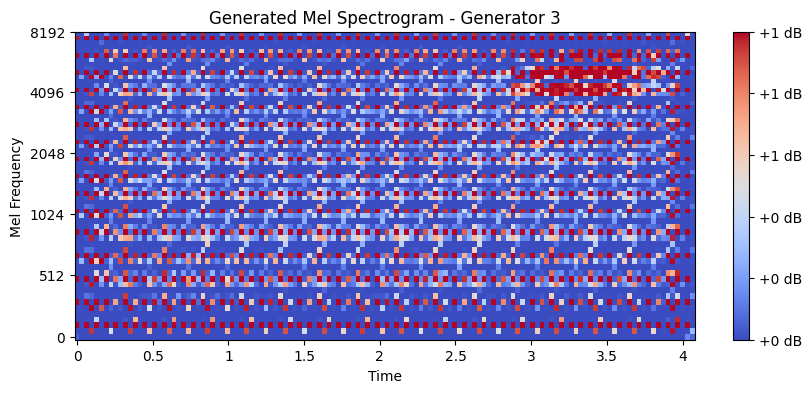

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2434


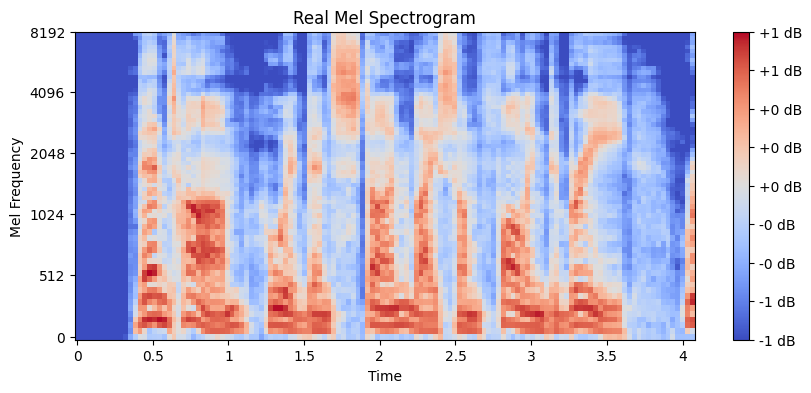

Batch [1] - D Loss: 0.0029, G Loss: 8.4495
[33/50] D Loss: 0.0029, G Loss: 8.4495
Batch [2] - D Loss: 0.0054, G Loss: 8.9949
[33/50] D Loss: 0.0054, G Loss: 8.9949
Batch [3] - D Loss: 0.0028, G Loss: 9.2588
[33/50] D Loss: 0.0028, G Loss: 9.2588
Batch [4] - D Loss: 0.0030, G Loss: 8.7400
[33/50] D Loss: 0.0030, G Loss: 8.7400
Batch [5] - D Loss: 0.0055, G Loss: 9.1677
[33/50] D Loss: 0.0055, G Loss: 9.1677
Batch [6] - D Loss: 0.0019, G Loss: 9.2404
[33/50] D Loss: 0.0019, G Loss: 9.2404
Batch [7] - D Loss: 0.0034, G Loss: 9.5499
[33/50] D Loss: 0.0034, G Loss: 9.5499
Batch [8] - D Loss: 0.0040, G Loss: 9.6582
[33/50] D Loss: 0.0040, G Loss: 9.6582
Batch [9] - D Loss: 0.0036, G Loss: 9.2840
[33/50] D Loss: 0.0036, G Loss: 9.2840
Batch [10] - D Loss: 0.0084, G Loss: 9.5051
[33/50] D Loss: 0.0084, G Loss: 9.5051
Batch [11] - D Loss: 0.0020, G Loss: 9.0331
[33/50] D Loss: 0.0020, G Loss: 9.0331
Batch [12] - D Loss: 0.0028, G Loss: 9.2883
[33/50] D Loss: 0.0028, G Loss: 9.2883
Batch [13] - 

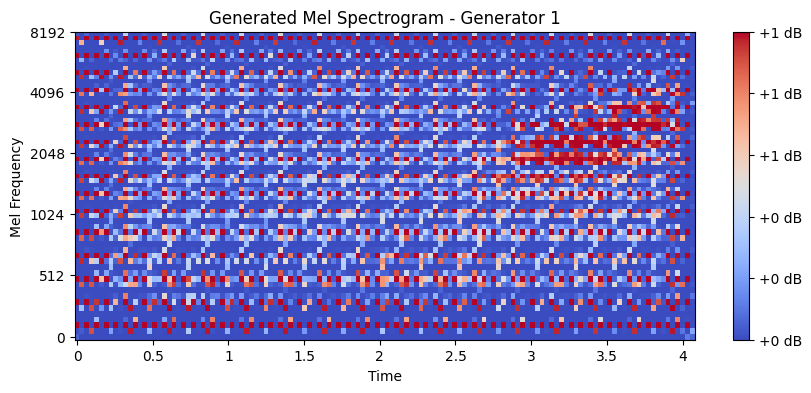

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2062


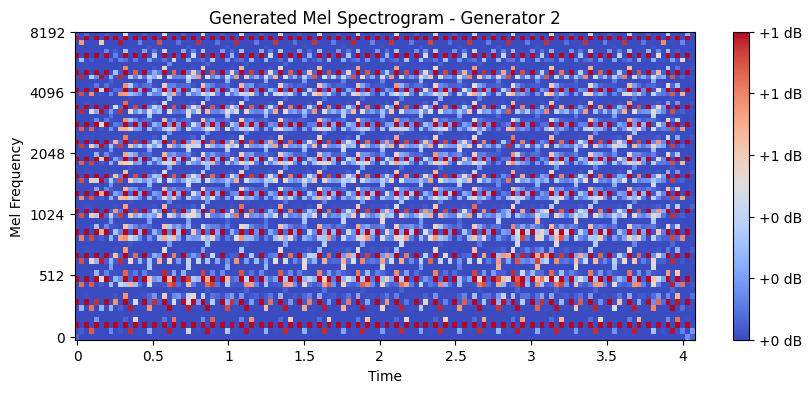

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2312


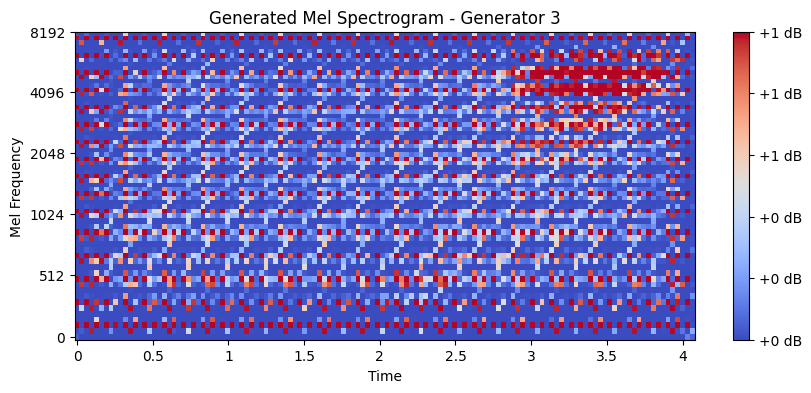

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.3881


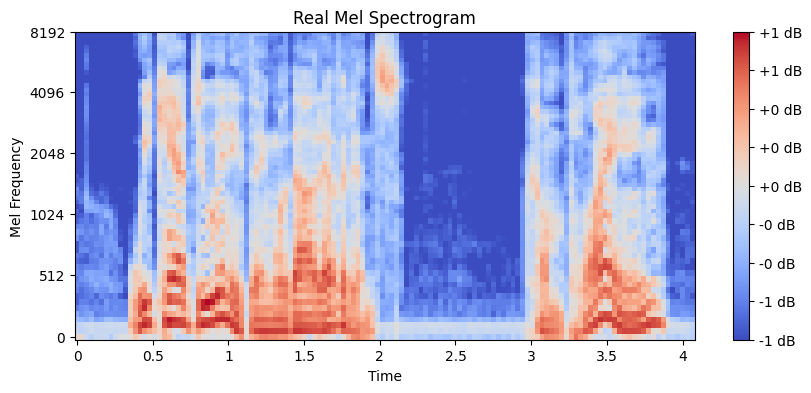

Batch [1] - D Loss: 0.0023, G Loss: 9.9816
[34/50] D Loss: 0.0023, G Loss: 9.9816
Batch [2] - D Loss: 0.0100, G Loss: 9.8389
[34/50] D Loss: 0.0100, G Loss: 9.8389
Batch [3] - D Loss: 0.0077, G Loss: 9.6528
[34/50] D Loss: 0.0077, G Loss: 9.6528
Batch [4] - D Loss: 0.0069, G Loss: 9.7788
[34/50] D Loss: 0.0069, G Loss: 9.7788
Batch [5] - D Loss: 0.0025, G Loss: 10.1218
[34/50] D Loss: 0.0025, G Loss: 10.1218
Batch [6] - D Loss: 0.0032, G Loss: 10.1623
[34/50] D Loss: 0.0032, G Loss: 10.1623
Batch [7] - D Loss: 0.0039, G Loss: 9.9675
[34/50] D Loss: 0.0039, G Loss: 9.9675
Batch [8] - D Loss: 0.0032, G Loss: 9.8199
[34/50] D Loss: 0.0032, G Loss: 9.8199
Batch [9] - D Loss: 0.0072, G Loss: 9.6364
[34/50] D Loss: 0.0072, G Loss: 9.6364
Batch [10] - D Loss: 0.0053, G Loss: 9.7290
[34/50] D Loss: 0.0053, G Loss: 9.7290
Batch [11] - D Loss: 0.0073, G Loss: 9.8256
[34/50] D Loss: 0.0073, G Loss: 9.8256
Batch [12] - D Loss: 0.0084, G Loss: 10.1384
[34/50] D Loss: 0.0084, G Loss: 10.1384
Batch [

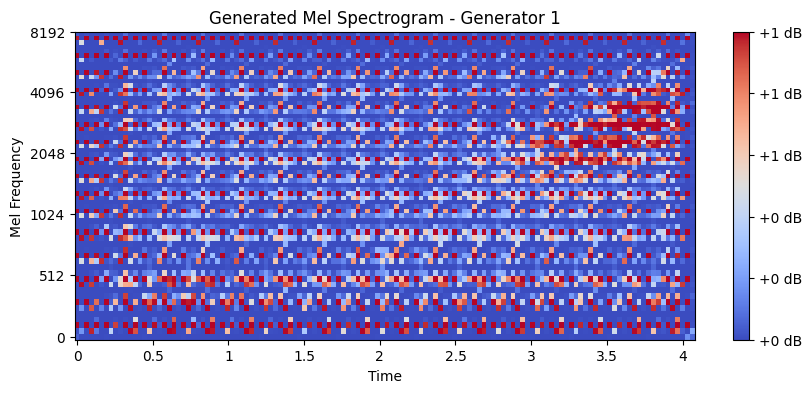

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2118


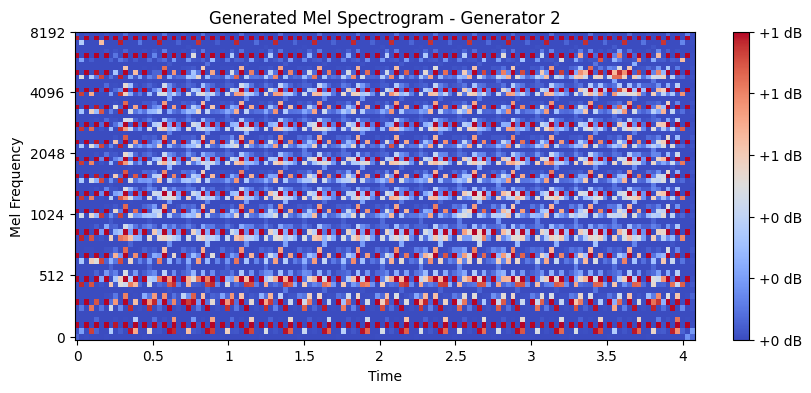

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2097


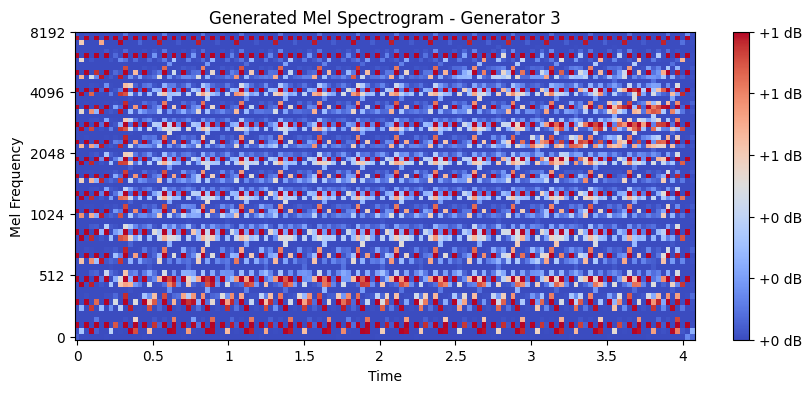

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.0971


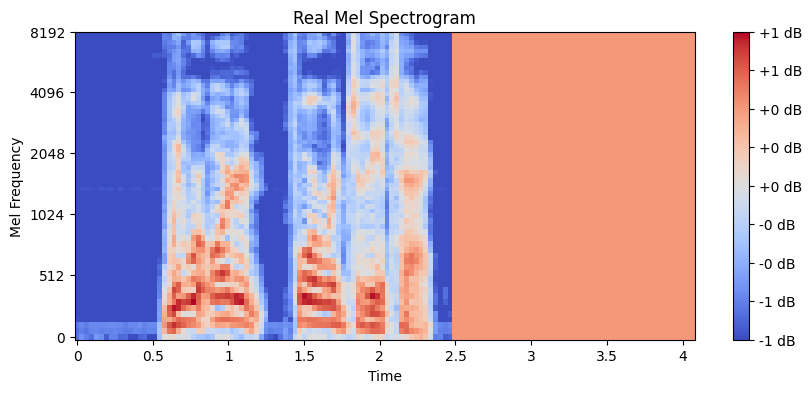

Batch [1] - D Loss: 0.0065, G Loss: 9.9187
[35/50] D Loss: 0.0065, G Loss: 9.9187
Batch [2] - D Loss: 0.0086, G Loss: 9.7376
[35/50] D Loss: 0.0086, G Loss: 9.7376
Batch [3] - D Loss: 0.0062, G Loss: 9.7179
[35/50] D Loss: 0.0062, G Loss: 9.7179
Batch [4] - D Loss: 0.0136, G Loss: 10.0445
[35/50] D Loss: 0.0136, G Loss: 10.0445
Batch [5] - D Loss: 0.0131, G Loss: 9.6200
[35/50] D Loss: 0.0131, G Loss: 9.6200
Batch [6] - D Loss: 0.0073, G Loss: 9.6013
[35/50] D Loss: 0.0073, G Loss: 9.6013
Batch [7] - D Loss: 0.0042, G Loss: 9.5038
[35/50] D Loss: 0.0042, G Loss: 9.5038
Batch [8] - D Loss: 0.0074, G Loss: 9.5434
[35/50] D Loss: 0.0074, G Loss: 9.5434
Batch [9] - D Loss: 0.0086, G Loss: 9.5615
[35/50] D Loss: 0.0086, G Loss: 9.5615
Batch [10] - D Loss: 0.0157, G Loss: 9.8308
[35/50] D Loss: 0.0157, G Loss: 9.8308
Batch [11] - D Loss: 0.0047, G Loss: 10.1153
[35/50] D Loss: 0.0047, G Loss: 10.1153
Batch [12] - D Loss: 0.0054, G Loss: 10.3873
[35/50] D Loss: 0.0054, G Loss: 10.3873
Batch [

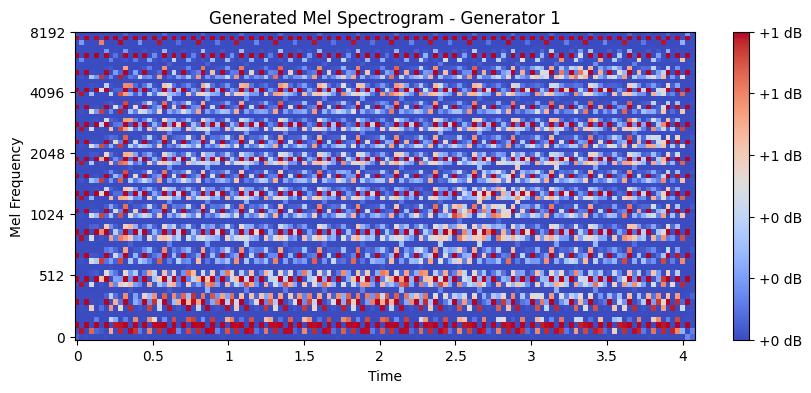

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2314


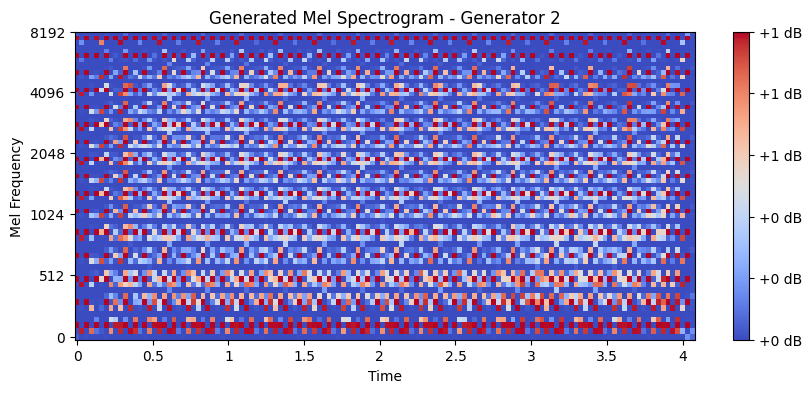

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2491


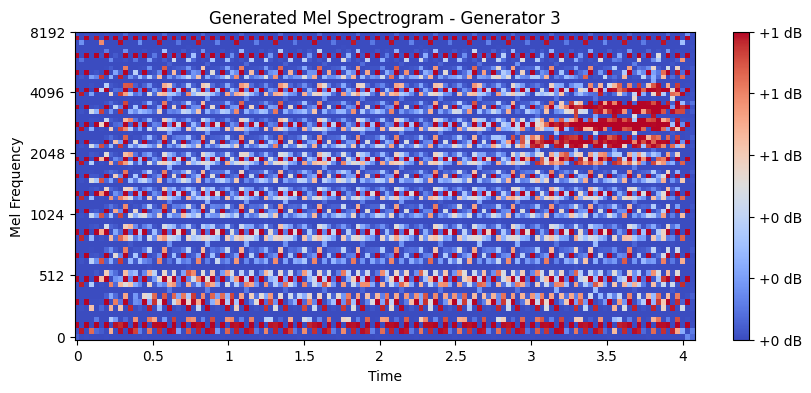

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1053


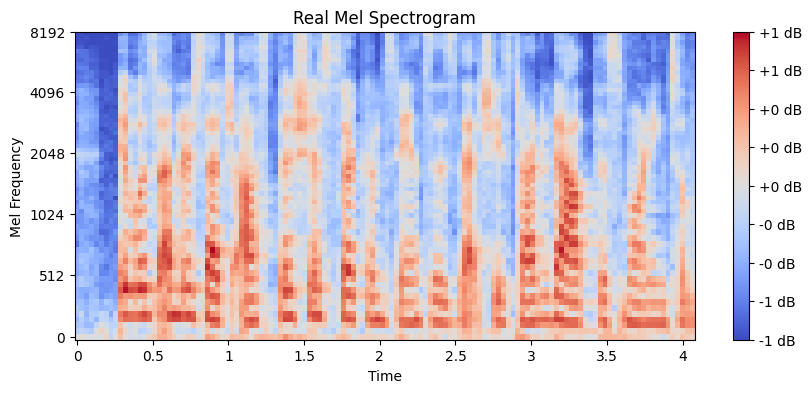

Batch [1] - D Loss: 0.0071, G Loss: 9.4001
[36/50] D Loss: 0.0071, G Loss: 9.4001
Batch [2] - D Loss: 0.0177, G Loss: 9.3292
[36/50] D Loss: 0.0177, G Loss: 9.3292
Batch [3] - D Loss: 0.0120, G Loss: 9.4284
[36/50] D Loss: 0.0120, G Loss: 9.4284
Batch [4] - D Loss: 0.0067, G Loss: 9.7049
[36/50] D Loss: 0.0067, G Loss: 9.7049
Batch [5] - D Loss: 0.0061, G Loss: 10.1243
[36/50] D Loss: 0.0061, G Loss: 10.1243
Batch [6] - D Loss: 0.0127, G Loss: 9.6669
[36/50] D Loss: 0.0127, G Loss: 9.6669
Batch [7] - D Loss: 0.0085, G Loss: 9.4184
[36/50] D Loss: 0.0085, G Loss: 9.4184
Batch [8] - D Loss: 0.0059, G Loss: 9.3942
[36/50] D Loss: 0.0059, G Loss: 9.3942
Batch [9] - D Loss: 0.0237, G Loss: 9.7147
[36/50] D Loss: 0.0237, G Loss: 9.7147
Batch [10] - D Loss: 0.0048, G Loss: 10.3062
[36/50] D Loss: 0.0048, G Loss: 10.3062
Batch [11] - D Loss: 0.0101, G Loss: 10.3009
[36/50] D Loss: 0.0101, G Loss: 10.3009
Batch [12] - D Loss: 0.0122, G Loss: 9.7935
[36/50] D Loss: 0.0122, G Loss: 9.7935
Batch [

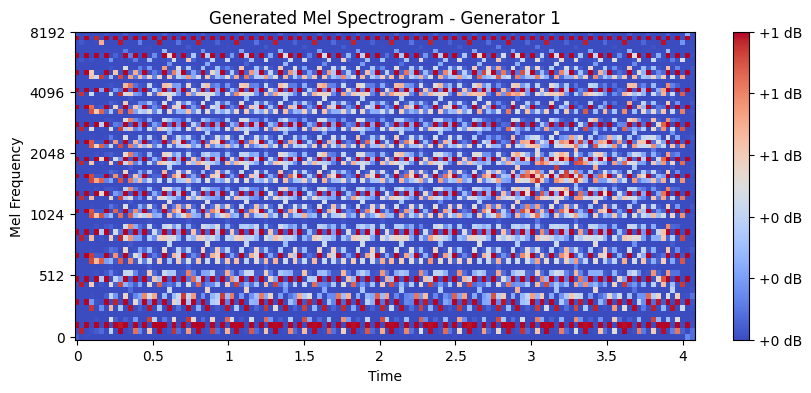

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2463


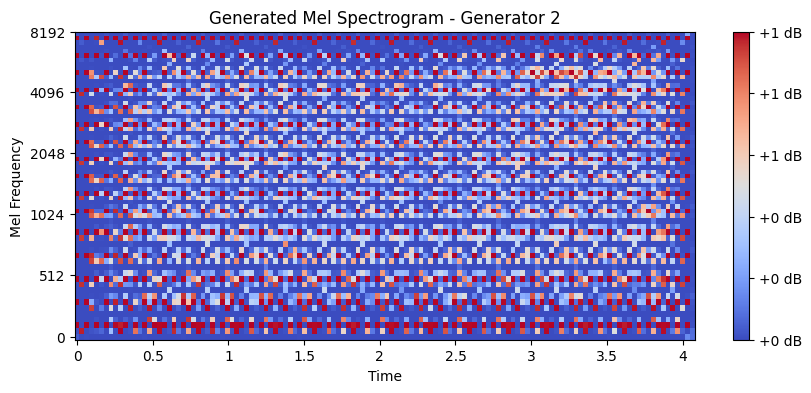

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2328


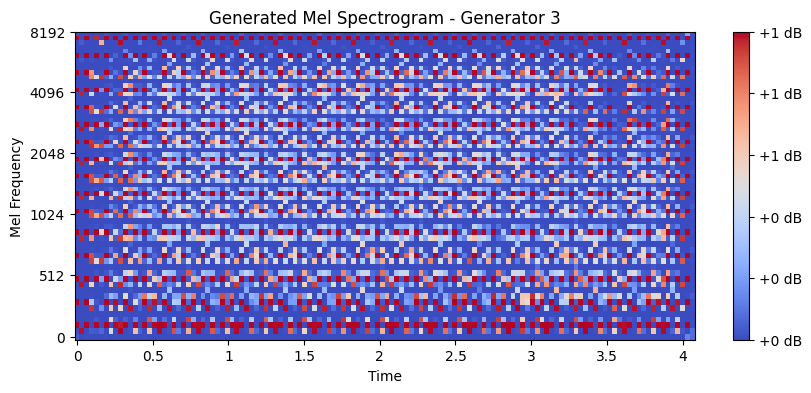

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.3153


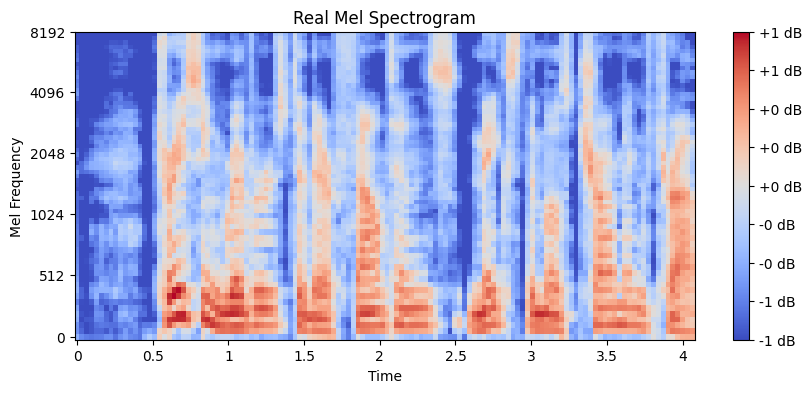

Batch [1] - D Loss: 0.0074, G Loss: 9.8682
[37/50] D Loss: 0.0074, G Loss: 9.8682
Batch [2] - D Loss: 0.0064, G Loss: 10.1030
[37/50] D Loss: 0.0064, G Loss: 10.1030
Batch [3] - D Loss: 0.0143, G Loss: 9.9386
[37/50] D Loss: 0.0143, G Loss: 9.9386
Batch [4] - D Loss: 0.0042, G Loss: 9.6976
[37/50] D Loss: 0.0042, G Loss: 9.6976
Batch [5] - D Loss: 0.0089, G Loss: 9.8658
[37/50] D Loss: 0.0089, G Loss: 9.8658
Batch [6] - D Loss: 0.0061, G Loss: 9.9310
[37/50] D Loss: 0.0061, G Loss: 9.9310
Batch [7] - D Loss: 0.0054, G Loss: 9.6365
[37/50] D Loss: 0.0054, G Loss: 9.6365
Batch [8] - D Loss: 0.0104, G Loss: 9.7410
[37/50] D Loss: 0.0104, G Loss: 9.7410
Batch [9] - D Loss: 0.0093, G Loss: 10.5488
[37/50] D Loss: 0.0093, G Loss: 10.5488
Batch [10] - D Loss: 0.0110, G Loss: 9.9778
[37/50] D Loss: 0.0110, G Loss: 9.9778
Batch [11] - D Loss: 0.0045, G Loss: 9.6926
[37/50] D Loss: 0.0045, G Loss: 9.6926
Batch [12] - D Loss: 0.0071, G Loss: 9.6113
[37/50] D Loss: 0.0071, G Loss: 9.6113
Batch [13

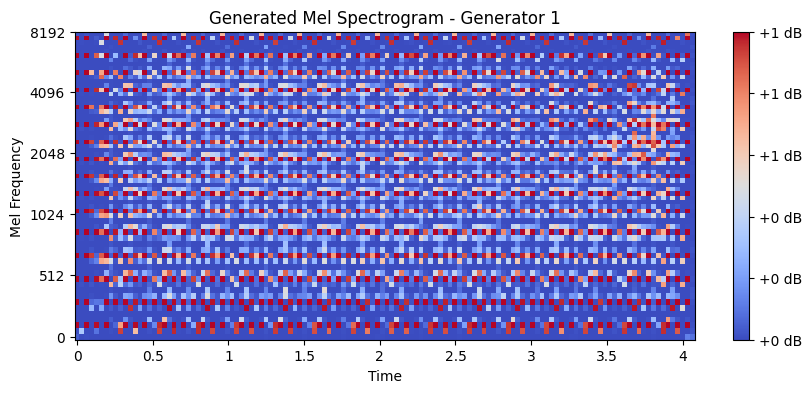

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2234


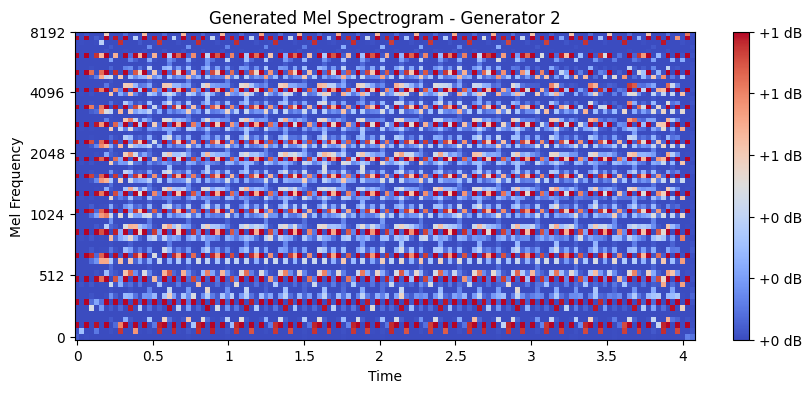

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2312


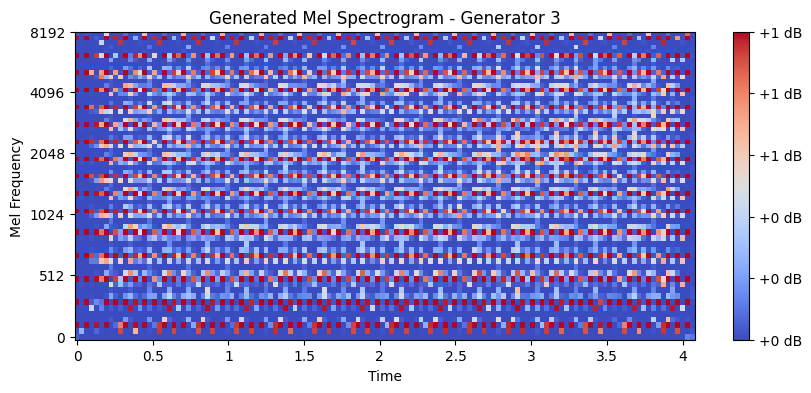

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1493


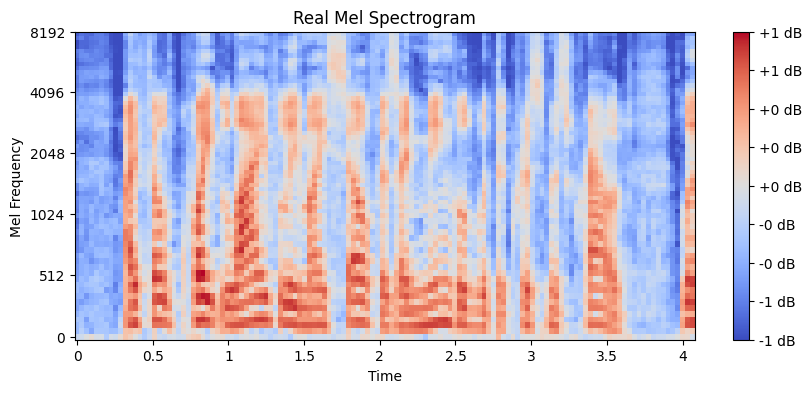

Batch [1] - D Loss: 0.0053, G Loss: 9.0266
[38/50] D Loss: 0.0053, G Loss: 9.0266
Batch [2] - D Loss: 0.0077, G Loss: 8.9825
[38/50] D Loss: 0.0077, G Loss: 8.9825
Batch [3] - D Loss: 0.0092, G Loss: 9.3326
[38/50] D Loss: 0.0092, G Loss: 9.3326
Batch [4] - D Loss: 0.0165, G Loss: 9.4985
[38/50] D Loss: 0.0165, G Loss: 9.4985
Batch [5] - D Loss: 0.0135, G Loss: 9.9638
[38/50] D Loss: 0.0135, G Loss: 9.9638
Batch [6] - D Loss: 0.0073, G Loss: 9.3250
[38/50] D Loss: 0.0073, G Loss: 9.3250
Batch [7] - D Loss: 0.0107, G Loss: 9.8603
[38/50] D Loss: 0.0107, G Loss: 9.8603
Batch [8] - D Loss: 0.0136, G Loss: 10.1831
[38/50] D Loss: 0.0136, G Loss: 10.1831
Batch [9] - D Loss: 0.0131, G Loss: 9.5087
[38/50] D Loss: 0.0131, G Loss: 9.5087
Batch [10] - D Loss: 0.0069, G Loss: 9.4043
[38/50] D Loss: 0.0069, G Loss: 9.4043
Batch [11] - D Loss: 0.0054, G Loss: 9.6056
[38/50] D Loss: 0.0054, G Loss: 9.6056
Batch [12] - D Loss: 0.0200, G Loss: 9.8899
[38/50] D Loss: 0.0200, G Loss: 9.8899
Batch [13] 

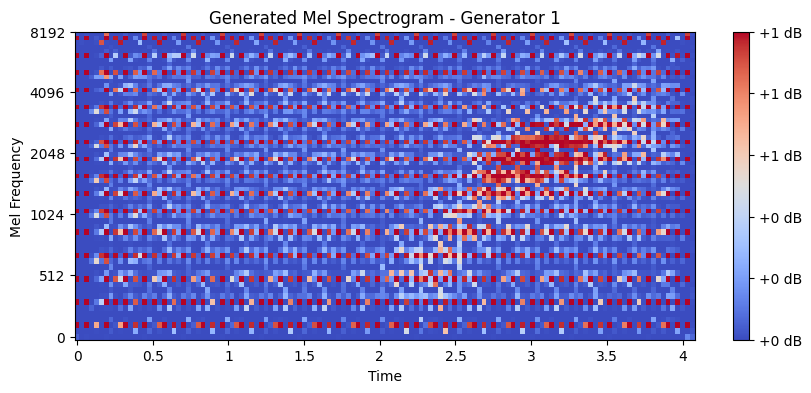

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1717


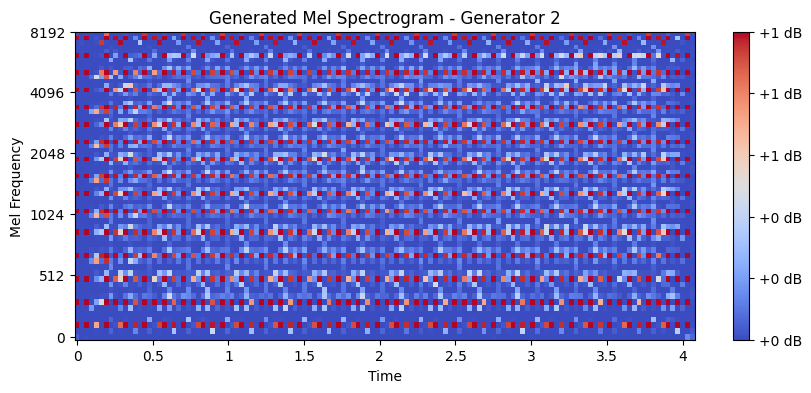

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1821


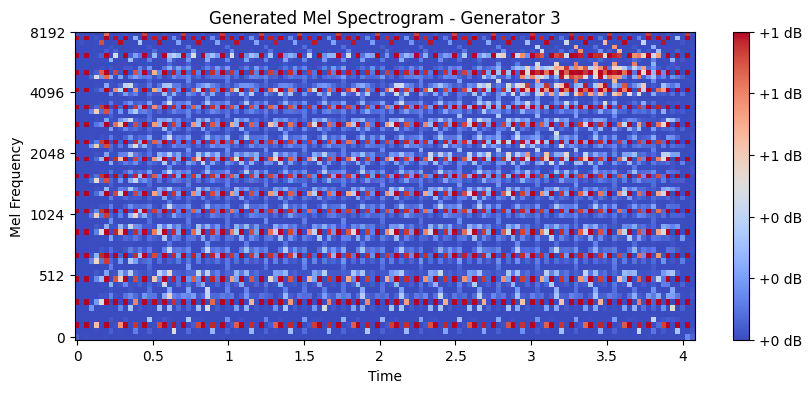

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.3366


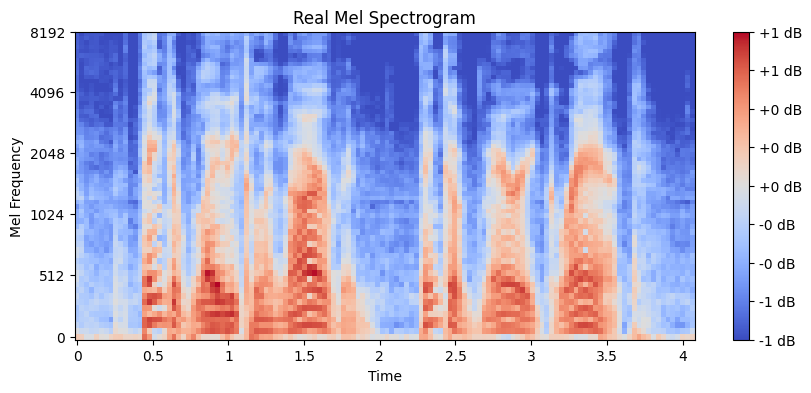

Batch [1] - D Loss: 0.0111, G Loss: 10.0223
[39/50] D Loss: 0.0111, G Loss: 10.0223
Batch [2] - D Loss: 0.0076, G Loss: 10.0877
[39/50] D Loss: 0.0076, G Loss: 10.0877
Batch [3] - D Loss: 0.0126, G Loss: 9.8801
[39/50] D Loss: 0.0126, G Loss: 9.8801
Batch [4] - D Loss: 0.0092, G Loss: 10.1774
[39/50] D Loss: 0.0092, G Loss: 10.1774
Batch [5] - D Loss: 0.0063, G Loss: 10.4258
[39/50] D Loss: 0.0063, G Loss: 10.4258
Batch [6] - D Loss: 0.0102, G Loss: 9.7798
[39/50] D Loss: 0.0102, G Loss: 9.7798
Batch [7] - D Loss: 0.0119, G Loss: 9.6224
[39/50] D Loss: 0.0119, G Loss: 9.6224
Batch [8] - D Loss: 0.0189, G Loss: 9.4277
[39/50] D Loss: 0.0189, G Loss: 9.4277
Batch [9] - D Loss: 0.0171, G Loss: 9.8654
[39/50] D Loss: 0.0171, G Loss: 9.8654
Batch [10] - D Loss: 0.0100, G Loss: 10.1855
[39/50] D Loss: 0.0100, G Loss: 10.1855
Batch [11] - D Loss: 0.0069, G Loss: 10.0139
[39/50] D Loss: 0.0069, G Loss: 10.0139
Batch [12] - D Loss: 0.0099, G Loss: 10.1439
[39/50] D Loss: 0.0099, G Loss: 10.1439

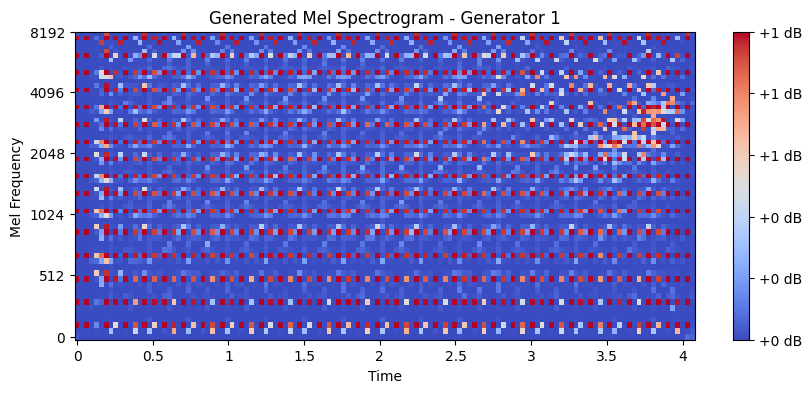

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1497


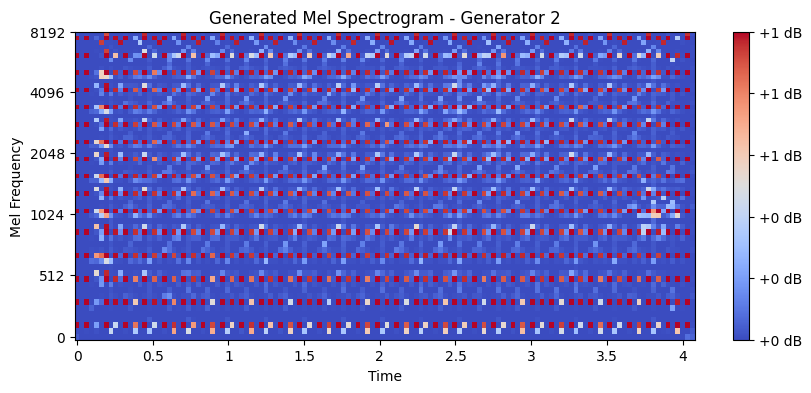

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1577


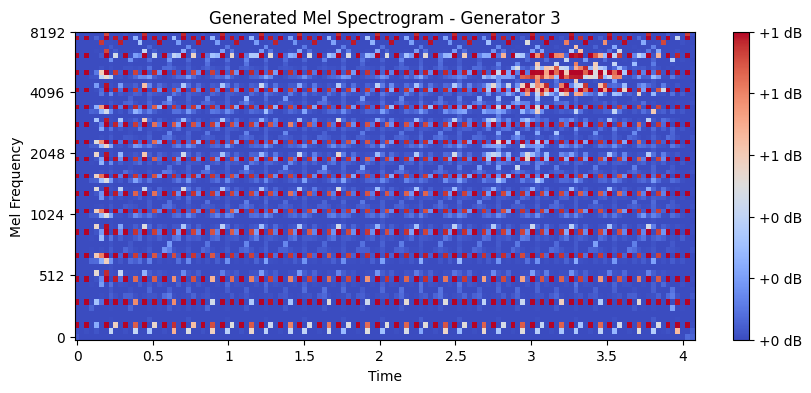

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1540


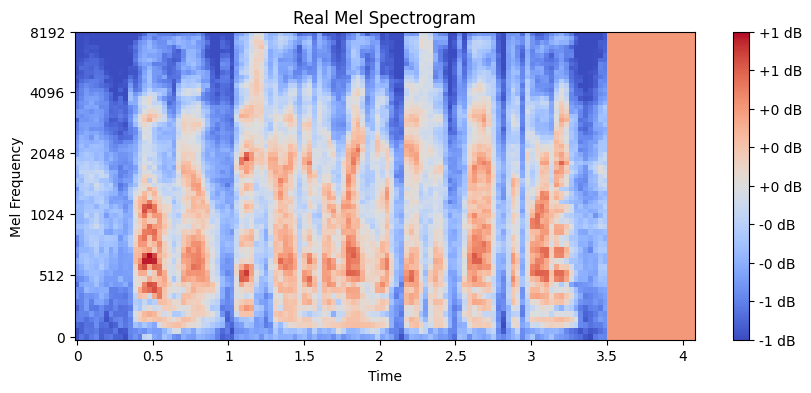

Batch [1] - D Loss: 0.0142, G Loss: 10.0495
[40/50] D Loss: 0.0142, G Loss: 10.0495
Batch [2] - D Loss: 0.0056, G Loss: 9.6981
[40/50] D Loss: 0.0056, G Loss: 9.6981
Batch [3] - D Loss: 0.0059, G Loss: 9.4359
[40/50] D Loss: 0.0059, G Loss: 9.4359
Batch [4] - D Loss: 0.0094, G Loss: 9.9546
[40/50] D Loss: 0.0094, G Loss: 9.9546
Batch [5] - D Loss: 0.0047, G Loss: 9.8899
[40/50] D Loss: 0.0047, G Loss: 9.8899
Batch [6] - D Loss: 0.0053, G Loss: 9.5694
[40/50] D Loss: 0.0053, G Loss: 9.5694
Batch [7] - D Loss: 0.0067, G Loss: 9.6303
[40/50] D Loss: 0.0067, G Loss: 9.6303
Batch [8] - D Loss: 0.0080, G Loss: 9.7378
[40/50] D Loss: 0.0080, G Loss: 9.7378
Batch [9] - D Loss: 0.0057, G Loss: 10.0471
[40/50] D Loss: 0.0057, G Loss: 10.0471
Batch [10] - D Loss: 0.0040, G Loss: 10.4549
[40/50] D Loss: 0.0040, G Loss: 10.4549
Batch [11] - D Loss: 0.0075, G Loss: 10.5028
[40/50] D Loss: 0.0075, G Loss: 10.5028
Batch [12] - D Loss: 0.0187, G Loss: 10.5501
[40/50] D Loss: 0.0187, G Loss: 10.5501
Bat

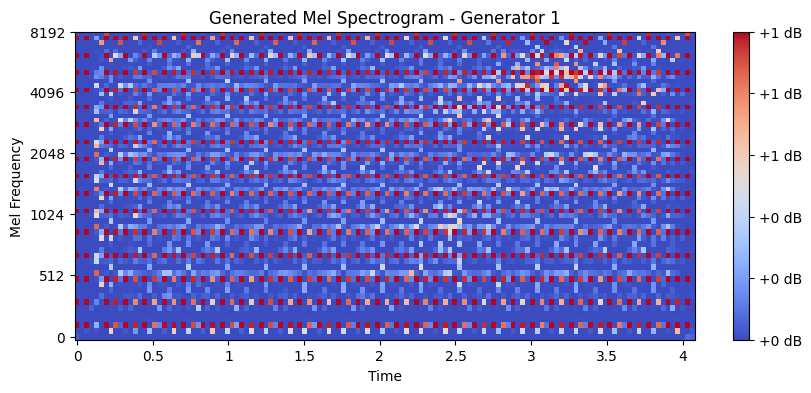

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1613


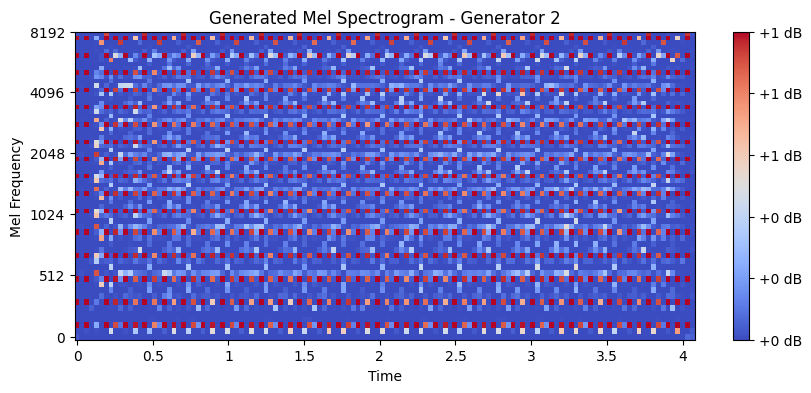

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1704


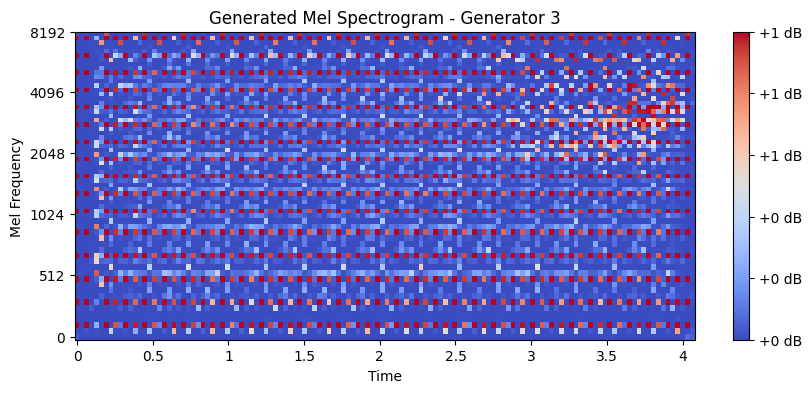

Real sample statistics:
  Min: -1.0000, Max: 0.9988, Mean: -0.2772


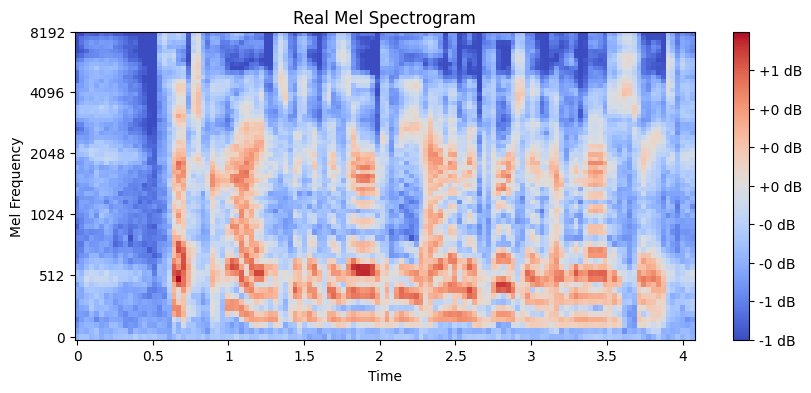

Batch [1] - D Loss: 0.0018, G Loss: 9.8218
[41/50] D Loss: 0.0018, G Loss: 9.8218
Batch [2] - D Loss: 0.0037, G Loss: 9.7544
[41/50] D Loss: 0.0037, G Loss: 9.7544
Batch [3] - D Loss: 0.0065, G Loss: 9.8179
[41/50] D Loss: 0.0065, G Loss: 9.8179
Batch [4] - D Loss: 0.0059, G Loss: 10.0989
[41/50] D Loss: 0.0059, G Loss: 10.0989
Batch [5] - D Loss: 0.0044, G Loss: 10.4966
[41/50] D Loss: 0.0044, G Loss: 10.4966
Batch [6] - D Loss: 0.0082, G Loss: 10.2258
[41/50] D Loss: 0.0082, G Loss: 10.2258
Batch [7] - D Loss: 0.0068, G Loss: 9.8203
[41/50] D Loss: 0.0068, G Loss: 9.8203
Batch [8] - D Loss: 0.0033, G Loss: 9.8574
[41/50] D Loss: 0.0033, G Loss: 9.8574
Batch [9] - D Loss: 0.0106, G Loss: 10.1318
[41/50] D Loss: 0.0106, G Loss: 10.1318
Batch [10] - D Loss: 0.0065, G Loss: 10.1629
[41/50] D Loss: 0.0065, G Loss: 10.1629
Batch [11] - D Loss: 0.0048, G Loss: 9.6289
[41/50] D Loss: 0.0048, G Loss: 9.6289
Batch [12] - D Loss: 0.0043, G Loss: 9.9754
[41/50] D Loss: 0.0043, G Loss: 9.9754
Bat

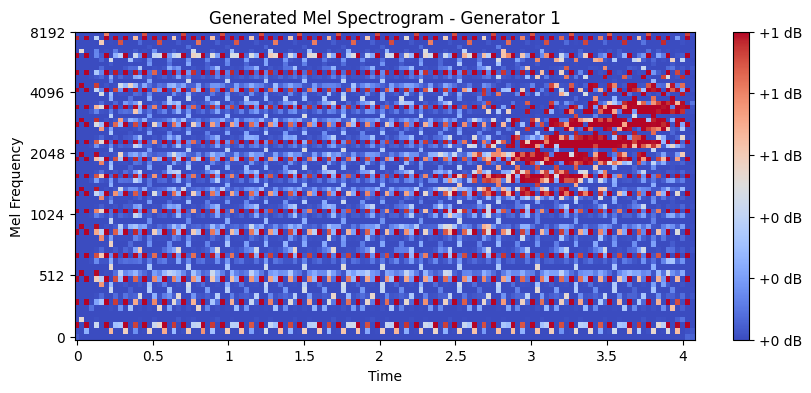

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1770


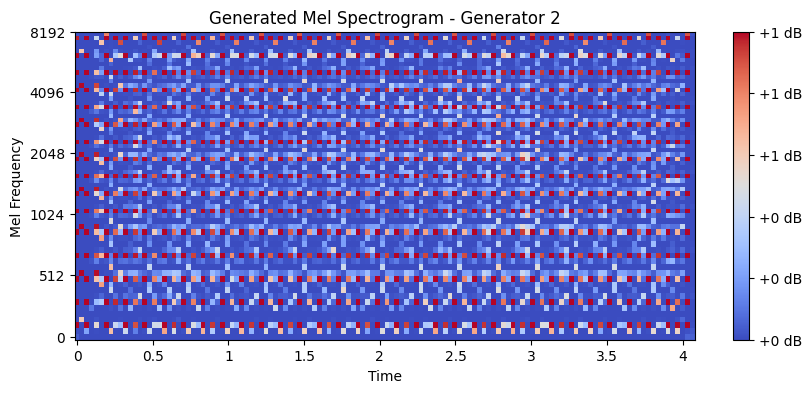

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1804


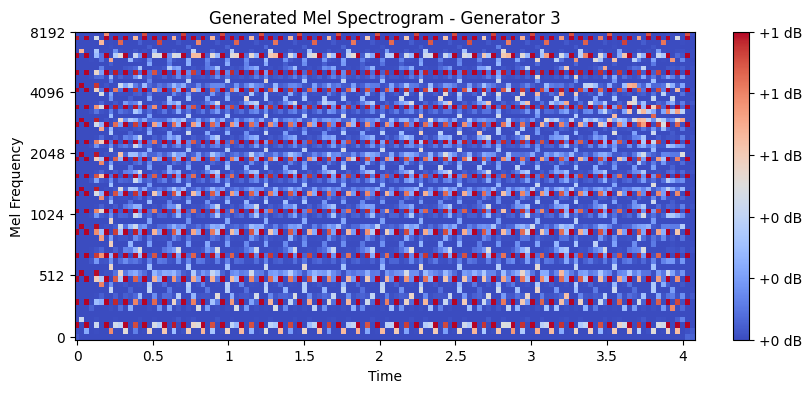

Real sample statistics:
  Min: -1.0000, Max: 0.9520, Mean: -0.4034


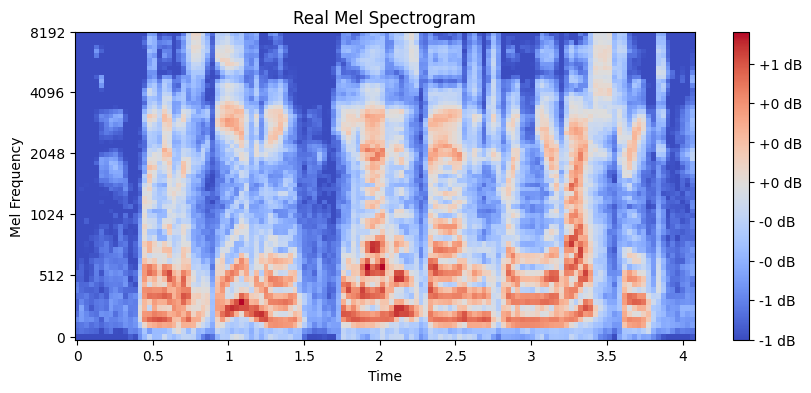

Batch [1] - D Loss: 0.0056, G Loss: 9.6224
[42/50] D Loss: 0.0056, G Loss: 9.6224
Batch [2] - D Loss: 0.0026, G Loss: 10.0193
[42/50] D Loss: 0.0026, G Loss: 10.0193
Batch [3] - D Loss: 0.0100, G Loss: 10.5081
[42/50] D Loss: 0.0100, G Loss: 10.5081
Batch [4] - D Loss: 0.0050, G Loss: 10.1448
[42/50] D Loss: 0.0050, G Loss: 10.1448
Batch [5] - D Loss: 0.0067, G Loss: 10.0827
[42/50] D Loss: 0.0067, G Loss: 10.0827
Batch [6] - D Loss: 0.0067, G Loss: 10.4692
[42/50] D Loss: 0.0067, G Loss: 10.4692
Batch [7] - D Loss: 0.0056, G Loss: 10.2089
[42/50] D Loss: 0.0056, G Loss: 10.2089
Batch [8] - D Loss: 0.0034, G Loss: 10.0844
[42/50] D Loss: 0.0034, G Loss: 10.0844
Batch [9] - D Loss: 0.0087, G Loss: 10.6313
[42/50] D Loss: 0.0087, G Loss: 10.6313
Batch [10] - D Loss: 0.0034, G Loss: 11.1642
[42/50] D Loss: 0.0034, G Loss: 11.1642
Batch [11] - D Loss: 0.0038, G Loss: 11.0386
[42/50] D Loss: 0.0038, G Loss: 11.0386
Batch [12] - D Loss: 0.0089, G Loss: 10.4476
[42/50] D Loss: 0.0089, G Loss:

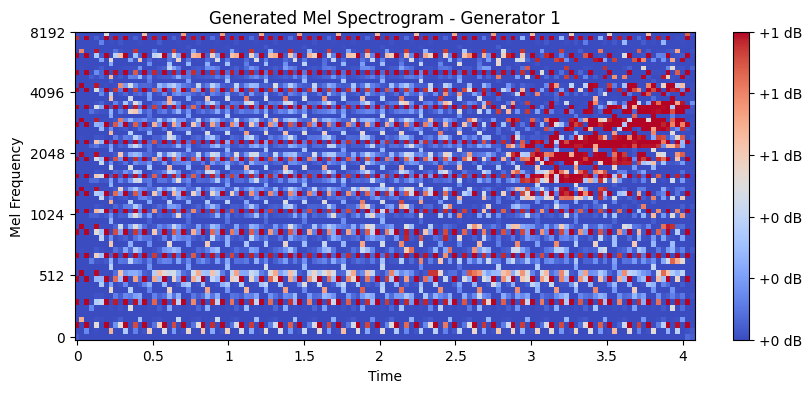

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1939


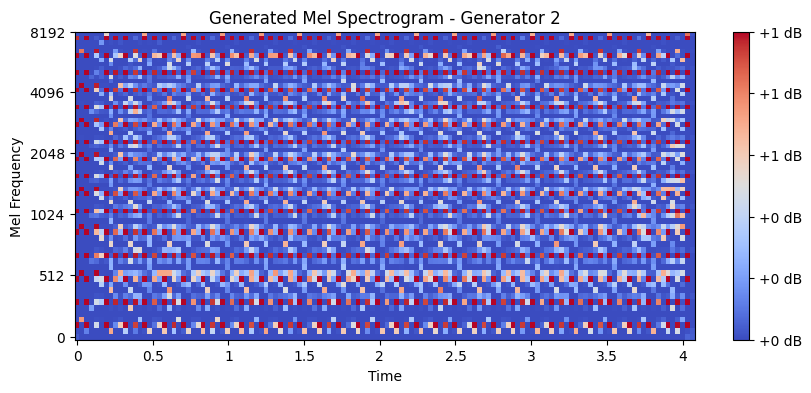

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1920


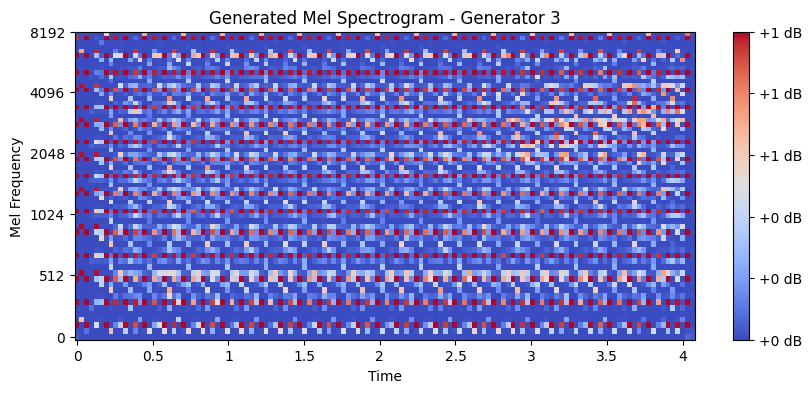

Real sample statistics:
  Min: -1.0000, Max: 0.9736, Mean: -0.2149


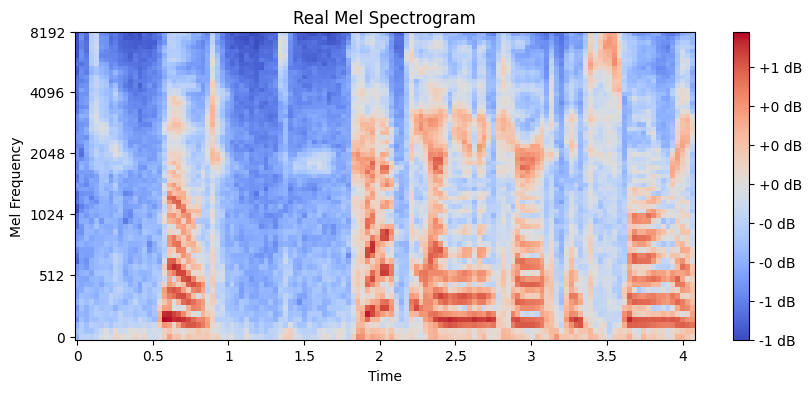

Batch [1] - D Loss: 0.0139, G Loss: 10.1738
[43/50] D Loss: 0.0139, G Loss: 10.1738
Batch [2] - D Loss: 0.0127, G Loss: 10.0800
[43/50] D Loss: 0.0127, G Loss: 10.0800
Batch [3] - D Loss: 0.0075, G Loss: 9.7665
[43/50] D Loss: 0.0075, G Loss: 9.7665
Batch [4] - D Loss: 0.0038, G Loss: 9.7781
[43/50] D Loss: 0.0038, G Loss: 9.7781
Batch [5] - D Loss: 0.0065, G Loss: 9.8058
[43/50] D Loss: 0.0065, G Loss: 9.8058
Batch [6] - D Loss: 0.0052, G Loss: 9.6844
[43/50] D Loss: 0.0052, G Loss: 9.6844
Batch [7] - D Loss: 0.0033, G Loss: 9.9042
[43/50] D Loss: 0.0033, G Loss: 9.9042
Batch [8] - D Loss: 0.0027, G Loss: 10.0749
[43/50] D Loss: 0.0027, G Loss: 10.0749
Batch [9] - D Loss: 0.0076, G Loss: 10.0608
[43/50] D Loss: 0.0076, G Loss: 10.0608
Batch [10] - D Loss: 0.0014, G Loss: 9.9341
[43/50] D Loss: 0.0014, G Loss: 9.9341
Batch [11] - D Loss: 0.0029, G Loss: 10.0603
[43/50] D Loss: 0.0029, G Loss: 10.0603
Batch [12] - D Loss: 0.0028, G Loss: 10.1675
[43/50] D Loss: 0.0028, G Loss: 10.1675
B

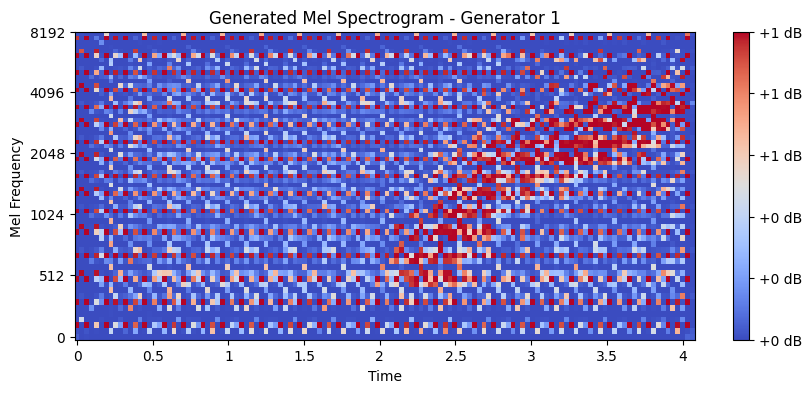

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.1889


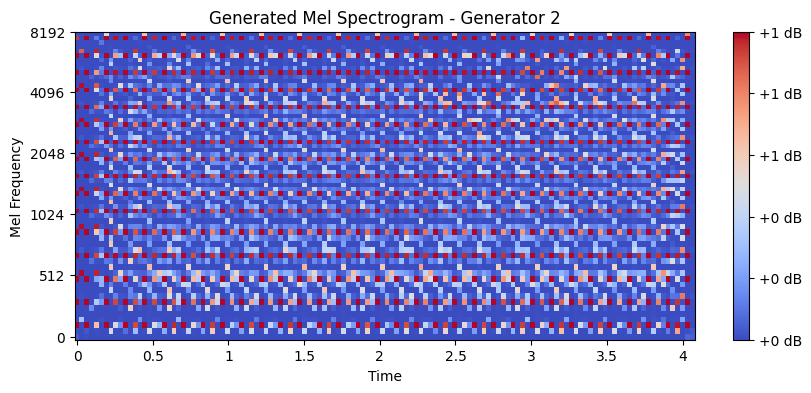

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2190


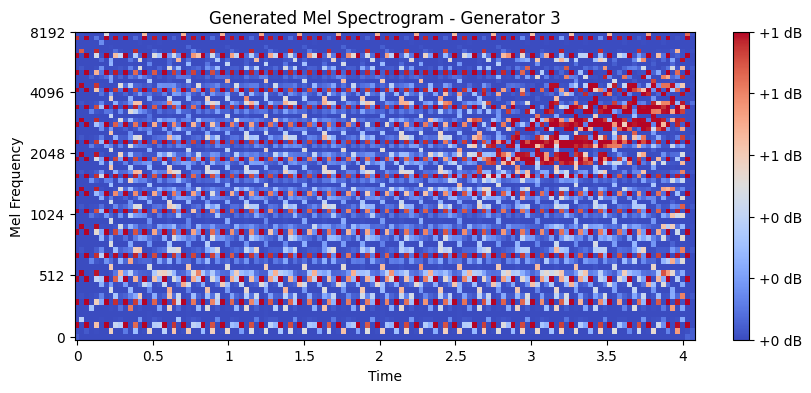

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.5189


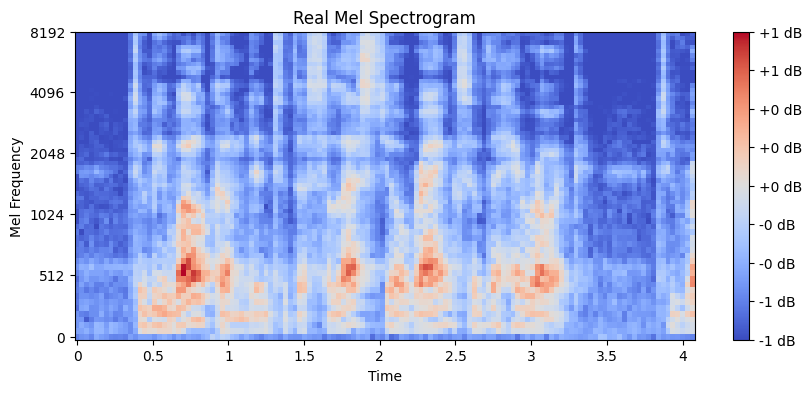

Batch [1] - D Loss: 0.0036, G Loss: 10.5349
[44/50] D Loss: 0.0036, G Loss: 10.5349
Batch [2] - D Loss: 0.0036, G Loss: 10.3971
[44/50] D Loss: 0.0036, G Loss: 10.3971
Batch [3] - D Loss: 0.0030, G Loss: 10.2014
[44/50] D Loss: 0.0030, G Loss: 10.2014
Batch [4] - D Loss: 0.0038, G Loss: 10.1851
[44/50] D Loss: 0.0038, G Loss: 10.1851
Batch [5] - D Loss: 0.0031, G Loss: 10.3580
[44/50] D Loss: 0.0031, G Loss: 10.3580
Batch [6] - D Loss: 0.0073, G Loss: 10.6304
[44/50] D Loss: 0.0073, G Loss: 10.6304
Batch [7] - D Loss: 0.0063, G Loss: 10.5813
[44/50] D Loss: 0.0063, G Loss: 10.5813
Batch [8] - D Loss: 0.0021, G Loss: 10.1582
[44/50] D Loss: 0.0021, G Loss: 10.1582
Batch [9] - D Loss: 0.0017, G Loss: 10.3541
[44/50] D Loss: 0.0017, G Loss: 10.3541
Batch [10] - D Loss: 0.0044, G Loss: 10.4270
[44/50] D Loss: 0.0044, G Loss: 10.4270
Batch [11] - D Loss: 0.0044, G Loss: 9.8868
[44/50] D Loss: 0.0044, G Loss: 9.8868
Batch [12] - D Loss: 0.0062, G Loss: 9.7475
[44/50] D Loss: 0.0062, G Loss: 

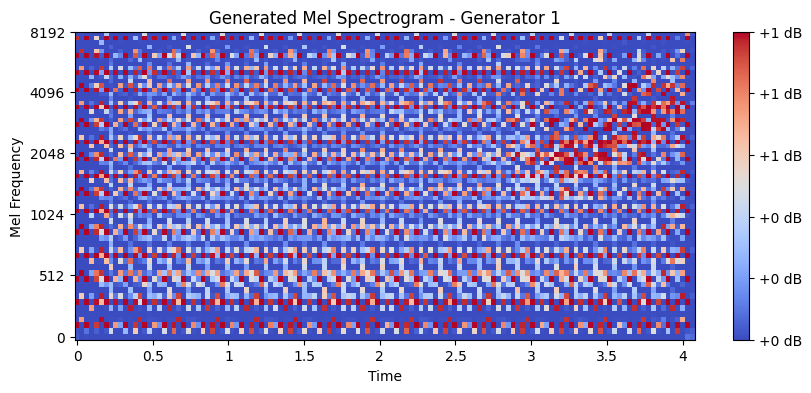

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2468


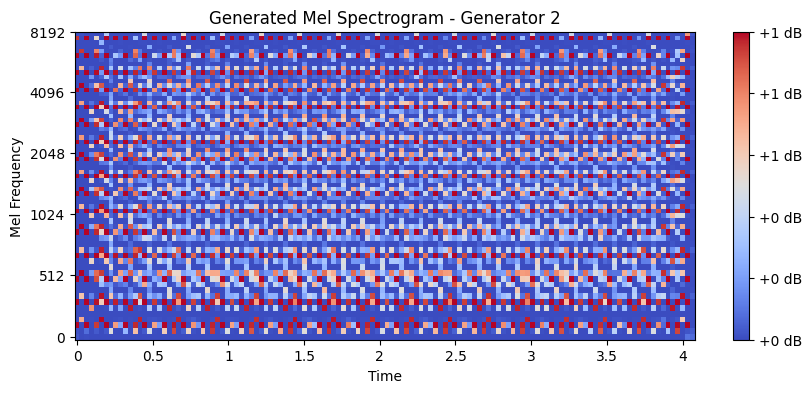

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2491


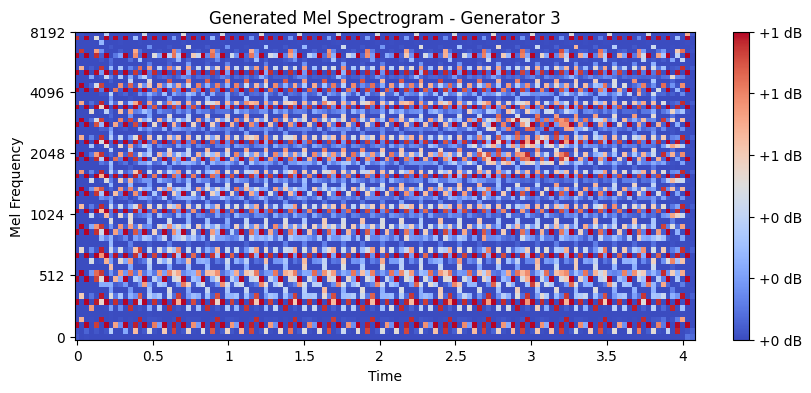

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2650


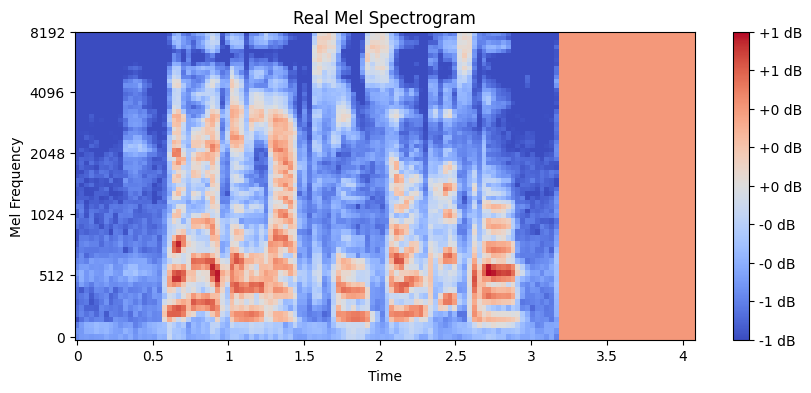

Batch [1] - D Loss: 0.0060, G Loss: 10.2845
[45/50] D Loss: 0.0060, G Loss: 10.2845
Batch [2] - D Loss: 0.0078, G Loss: 10.4100
[45/50] D Loss: 0.0078, G Loss: 10.4100
Batch [3] - D Loss: 0.0068, G Loss: 10.2611
[45/50] D Loss: 0.0068, G Loss: 10.2611
Batch [4] - D Loss: 0.0043, G Loss: 10.1402
[45/50] D Loss: 0.0043, G Loss: 10.1402
Batch [5] - D Loss: 0.0066, G Loss: 10.2110
[45/50] D Loss: 0.0066, G Loss: 10.2110
Batch [6] - D Loss: 0.0128, G Loss: 10.3769
[45/50] D Loss: 0.0128, G Loss: 10.3769
Batch [7] - D Loss: 0.0111, G Loss: 10.5105
[45/50] D Loss: 0.0111, G Loss: 10.5105
Batch [8] - D Loss: 0.0025, G Loss: 10.3094
[45/50] D Loss: 0.0025, G Loss: 10.3094
Batch [9] - D Loss: 0.0036, G Loss: 10.2854
[45/50] D Loss: 0.0036, G Loss: 10.2854
Batch [10] - D Loss: 0.0070, G Loss: 10.4292
[45/50] D Loss: 0.0070, G Loss: 10.4292
Batch [11] - D Loss: 0.0046, G Loss: 10.5187
[45/50] D Loss: 0.0046, G Loss: 10.5187
Batch [12] - D Loss: 0.0038, G Loss: 10.5521
[45/50] D Loss: 0.0038, G Los

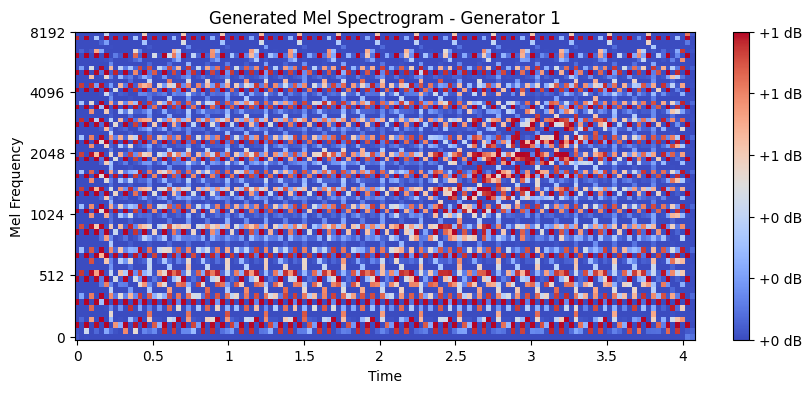

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2538


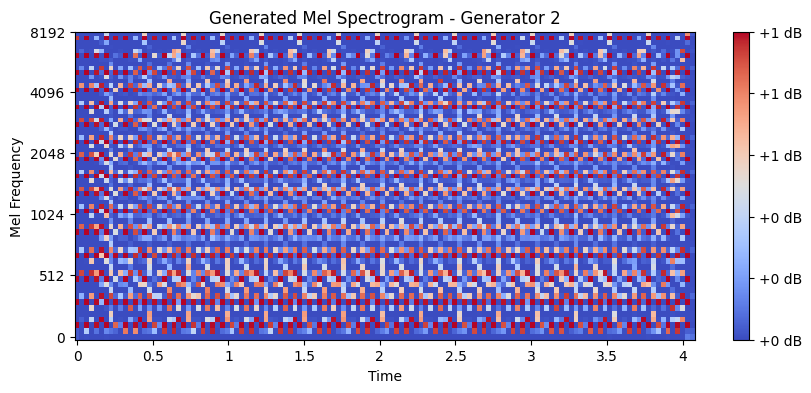

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2637


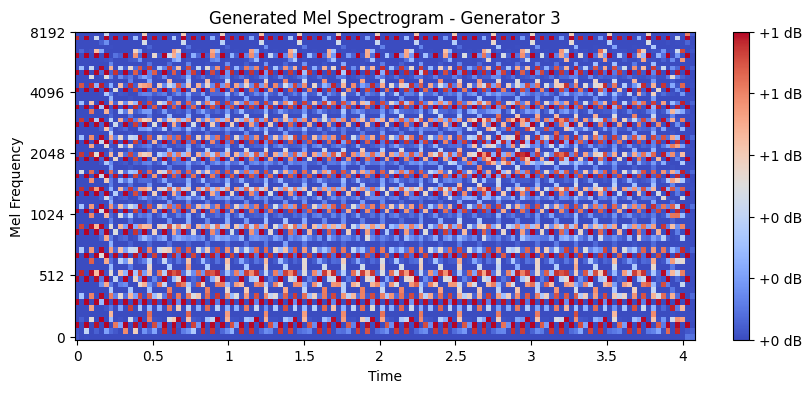

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.1708


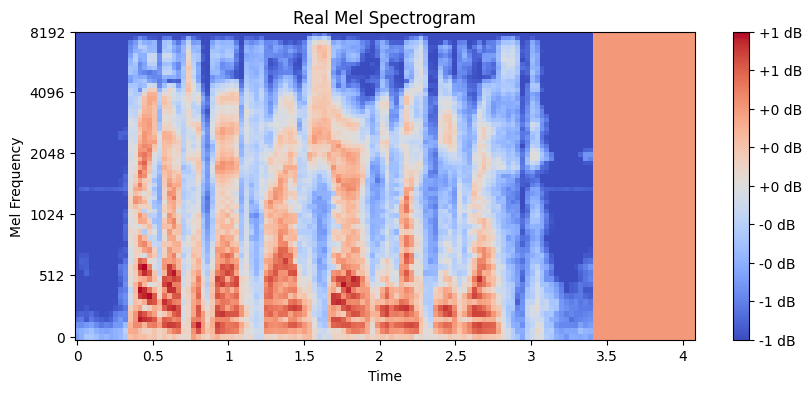

Batch [1] - D Loss: 0.0121, G Loss: 10.4257
[46/50] D Loss: 0.0121, G Loss: 10.4257
Batch [2] - D Loss: 0.0035, G Loss: 10.8649
[46/50] D Loss: 0.0035, G Loss: 10.8649
Batch [3] - D Loss: 0.0080, G Loss: 10.8213
[46/50] D Loss: 0.0080, G Loss: 10.8213
Batch [4] - D Loss: 0.0059, G Loss: 10.5765
[46/50] D Loss: 0.0059, G Loss: 10.5765
Batch [5] - D Loss: 0.0102, G Loss: 10.5864
[46/50] D Loss: 0.0102, G Loss: 10.5864
Batch [6] - D Loss: 0.0031, G Loss: 10.6671
[46/50] D Loss: 0.0031, G Loss: 10.6671
Batch [7] - D Loss: 0.0087, G Loss: 10.7164
[46/50] D Loss: 0.0087, G Loss: 10.7164
Batch [8] - D Loss: 0.0080, G Loss: 10.8201
[46/50] D Loss: 0.0080, G Loss: 10.8201
Batch [9] - D Loss: 0.0109, G Loss: 11.0274
[46/50] D Loss: 0.0109, G Loss: 11.0274
Batch [10] - D Loss: 0.0031, G Loss: 10.8125
[46/50] D Loss: 0.0031, G Loss: 10.8125
Batch [11] - D Loss: 0.0058, G Loss: 10.7064
[46/50] D Loss: 0.0058, G Loss: 10.7064
Batch [12] - D Loss: 0.0050, G Loss: 10.7142
[46/50] D Loss: 0.0050, G Los

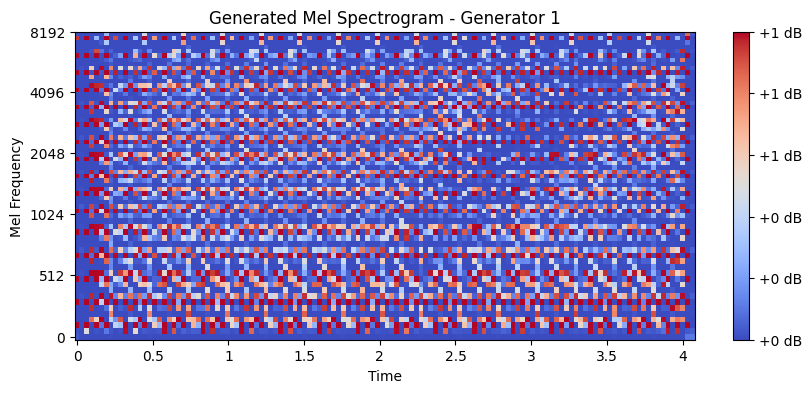

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2773


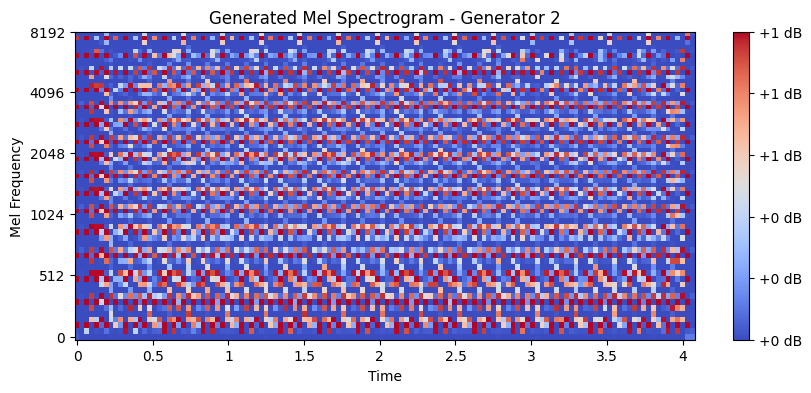

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2762


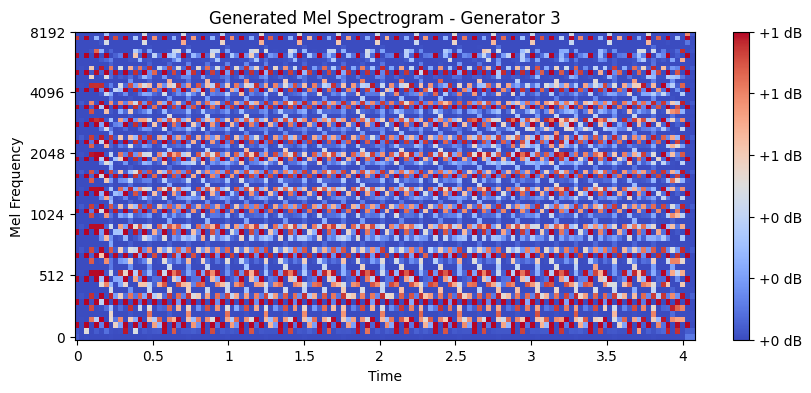

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.2391


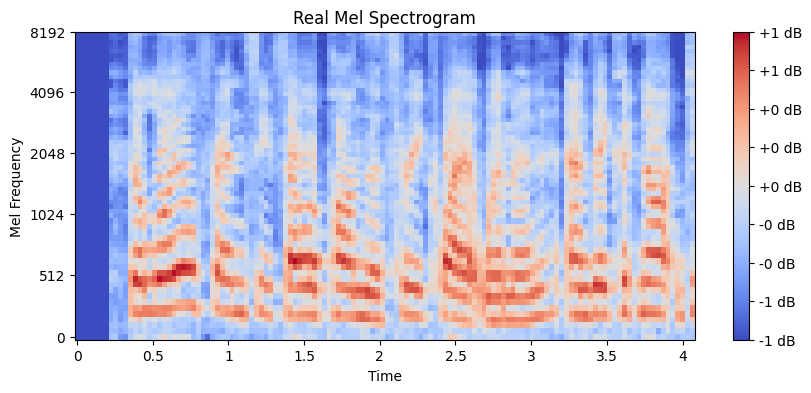

Batch [1] - D Loss: 0.0058, G Loss: 11.1209
[47/50] D Loss: 0.0058, G Loss: 11.1209
Batch [2] - D Loss: 0.0073, G Loss: 11.0984
[47/50] D Loss: 0.0073, G Loss: 11.0984
Batch [3] - D Loss: 0.0062, G Loss: 10.5243
[47/50] D Loss: 0.0062, G Loss: 10.5243
Batch [4] - D Loss: 0.0063, G Loss: 10.5189
[47/50] D Loss: 0.0063, G Loss: 10.5189
Batch [5] - D Loss: 0.0033, G Loss: 10.5735
[47/50] D Loss: 0.0033, G Loss: 10.5735
Batch [6] - D Loss: 0.0042, G Loss: 10.4461
[47/50] D Loss: 0.0042, G Loss: 10.4461
Batch [7] - D Loss: 0.0040, G Loss: 10.7479
[47/50] D Loss: 0.0040, G Loss: 10.7479
Batch [8] - D Loss: 0.0064, G Loss: 10.5653
[47/50] D Loss: 0.0064, G Loss: 10.5653
Batch [9] - D Loss: 0.0059, G Loss: 10.7423
[47/50] D Loss: 0.0059, G Loss: 10.7423
Batch [10] - D Loss: 0.0078, G Loss: 10.6259
[47/50] D Loss: 0.0078, G Loss: 10.6259
Batch [11] - D Loss: 0.0053, G Loss: 10.2651
[47/50] D Loss: 0.0053, G Loss: 10.2651
Batch [12] - D Loss: 0.0103, G Loss: 10.1331
[47/50] D Loss: 0.0103, G Los

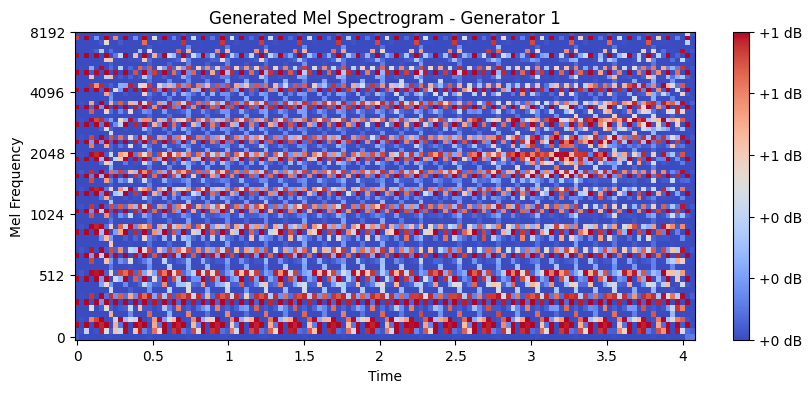

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2813


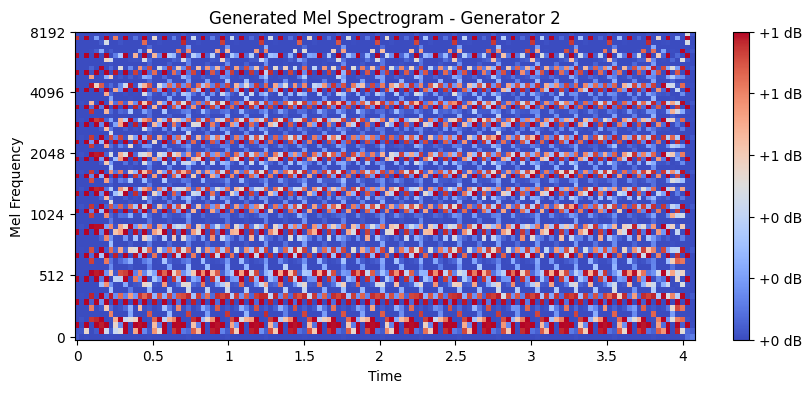

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2752


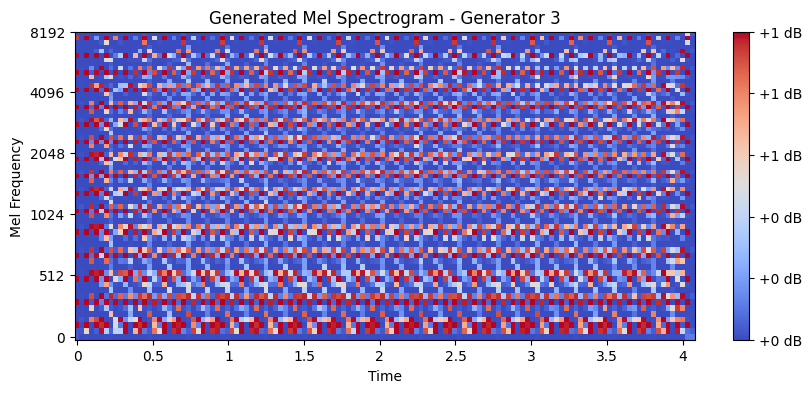

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: 0.0252


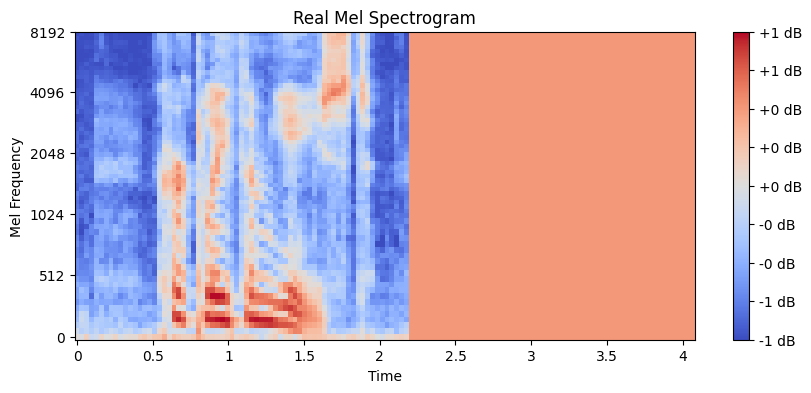

Batch [1] - D Loss: 0.0124, G Loss: 10.6840
[48/50] D Loss: 0.0124, G Loss: 10.6840
Batch [2] - D Loss: 0.0061, G Loss: 10.7477
[48/50] D Loss: 0.0061, G Loss: 10.7477
Batch [3] - D Loss: 0.0064, G Loss: 10.7736
[48/50] D Loss: 0.0064, G Loss: 10.7736
Batch [4] - D Loss: 0.0055, G Loss: 11.0475
[48/50] D Loss: 0.0055, G Loss: 11.0475
Batch [5] - D Loss: 0.0054, G Loss: 10.6308
[48/50] D Loss: 0.0054, G Loss: 10.6308
Batch [6] - D Loss: 0.0045, G Loss: 10.4823
[48/50] D Loss: 0.0045, G Loss: 10.4823
Batch [7] - D Loss: 0.0036, G Loss: 10.6150
[48/50] D Loss: 0.0036, G Loss: 10.6150
Batch [8] - D Loss: 0.0064, G Loss: 10.5663
[48/50] D Loss: 0.0064, G Loss: 10.5663
Batch [9] - D Loss: 0.0078, G Loss: 10.3659
[48/50] D Loss: 0.0078, G Loss: 10.3659
Batch [10] - D Loss: 0.0072, G Loss: 10.3193
[48/50] D Loss: 0.0072, G Loss: 10.3193
Batch [11] - D Loss: 0.0112, G Loss: 10.4952
[48/50] D Loss: 0.0112, G Loss: 10.4952
Batch [12] - D Loss: 0.0055, G Loss: 10.5536
[48/50] D Loss: 0.0055, G Los

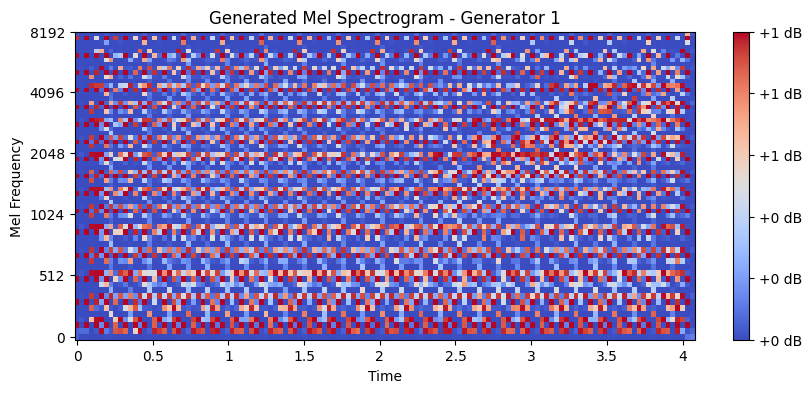

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2827


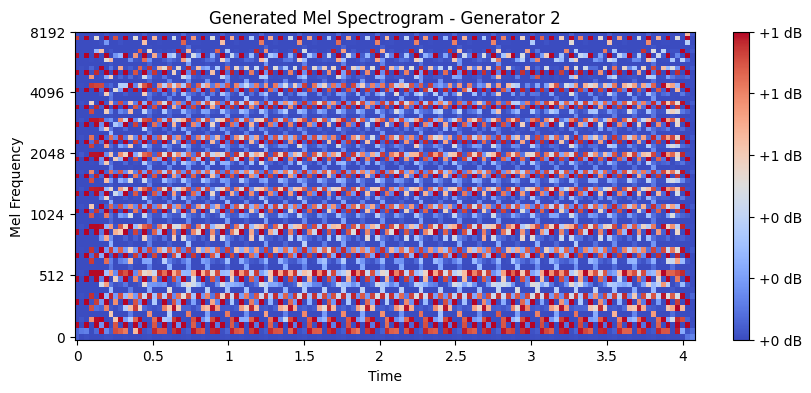

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2834


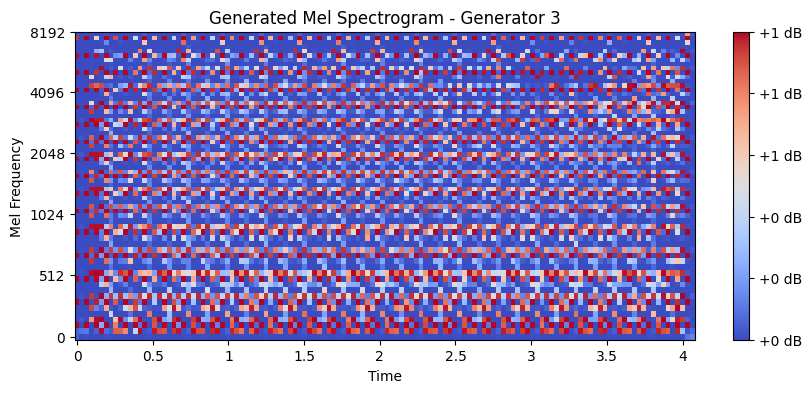

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.0637


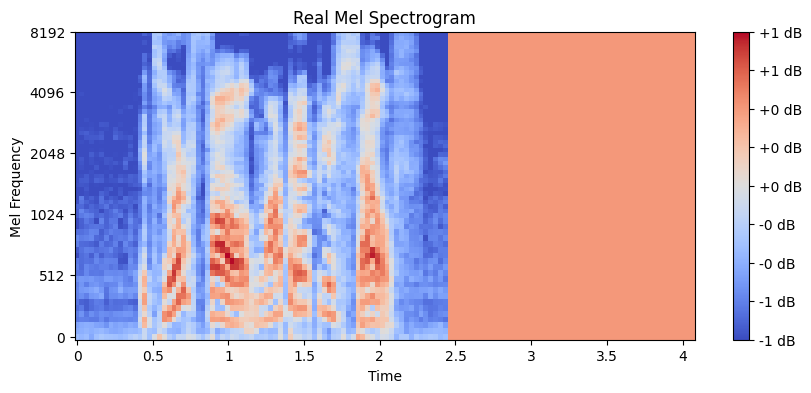

Batch [1] - D Loss: 0.0059, G Loss: 10.9628
[49/50] D Loss: 0.0059, G Loss: 10.9628
Batch [2] - D Loss: 0.0064, G Loss: 10.5892
[49/50] D Loss: 0.0064, G Loss: 10.5892
Batch [3] - D Loss: 0.0073, G Loss: 10.5650
[49/50] D Loss: 0.0073, G Loss: 10.5650
Batch [4] - D Loss: 0.0036, G Loss: 10.8055
[49/50] D Loss: 0.0036, G Loss: 10.8055
Batch [5] - D Loss: 0.0147, G Loss: 10.4823
[49/50] D Loss: 0.0147, G Loss: 10.4823
Batch [6] - D Loss: 0.0055, G Loss: 10.6164
[49/50] D Loss: 0.0055, G Loss: 10.6164
Batch [7] - D Loss: 0.0114, G Loss: 10.8097
[49/50] D Loss: 0.0114, G Loss: 10.8097
Batch [8] - D Loss: 0.0068, G Loss: 10.8285
[49/50] D Loss: 0.0068, G Loss: 10.8285
Batch [9] - D Loss: 0.0049, G Loss: 10.4416
[49/50] D Loss: 0.0049, G Loss: 10.4416
Batch [10] - D Loss: 0.0043, G Loss: 10.7053
[49/50] D Loss: 0.0043, G Loss: 10.7053
Batch [11] - D Loss: 0.0109, G Loss: 10.4960
[49/50] D Loss: 0.0109, G Loss: 10.4960
Batch [12] - D Loss: 0.0041, G Loss: 10.3971
[49/50] D Loss: 0.0041, G Los

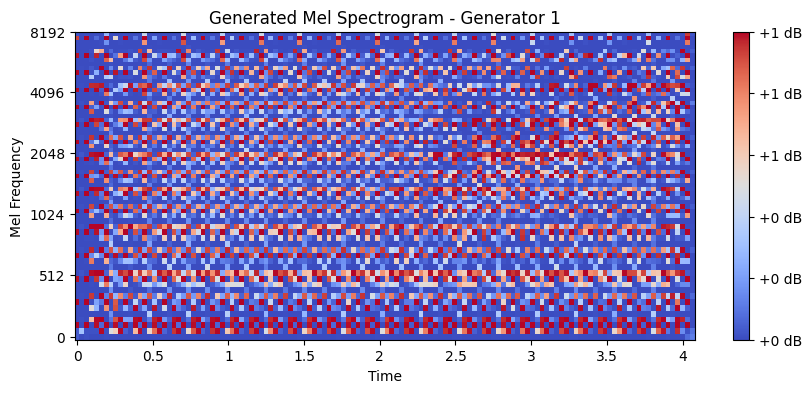

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2932


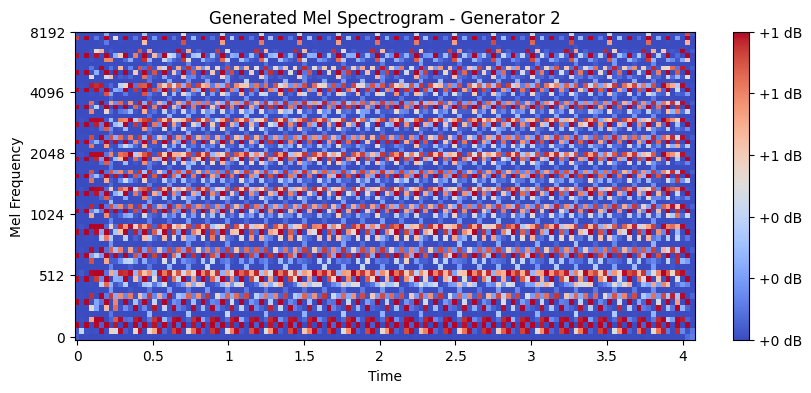

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.2930


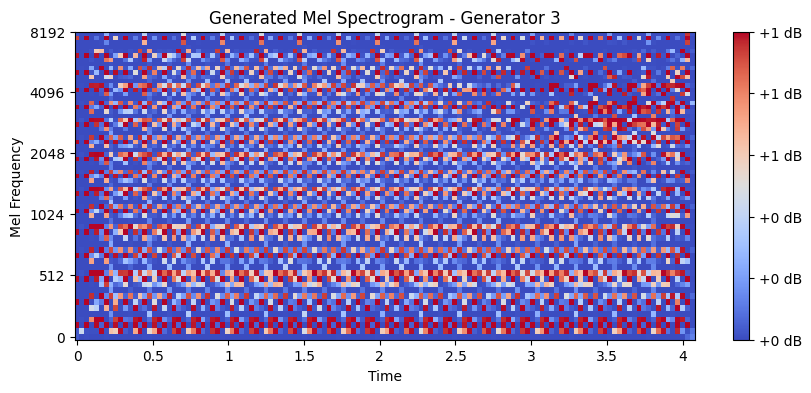

Real sample statistics:
  Min: -0.7059, Max: 1.0000, Mean: 0.1148


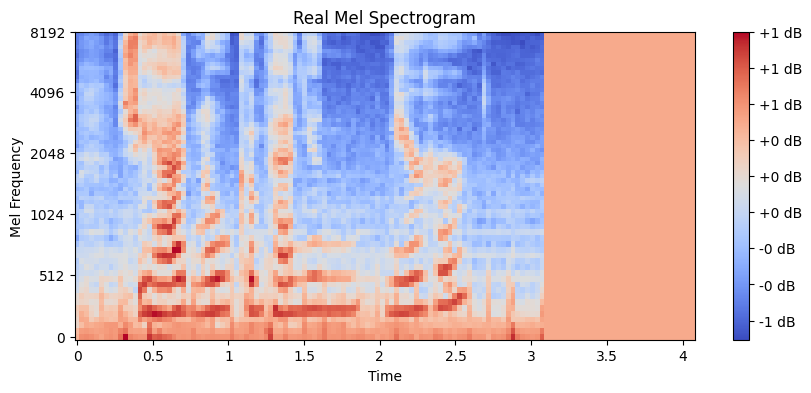

Batch [1] - D Loss: 0.0135, G Loss: 12.1584
[50/50] D Loss: 0.0135, G Loss: 12.1584
Batch [2] - D Loss: 0.0056, G Loss: 11.0288
[50/50] D Loss: 0.0056, G Loss: 11.0288
Batch [3] - D Loss: 0.0105, G Loss: 10.9454
[50/50] D Loss: 0.0105, G Loss: 10.9454
Batch [4] - D Loss: 0.0053, G Loss: 10.9547
[50/50] D Loss: 0.0053, G Loss: 10.9547
Batch [5] - D Loss: 0.0048, G Loss: 10.8244
[50/50] D Loss: 0.0048, G Loss: 10.8244
Batch [6] - D Loss: 0.0179, G Loss: 10.9272
[50/50] D Loss: 0.0179, G Loss: 10.9272
Batch [7] - D Loss: 0.0185, G Loss: 11.0363
[50/50] D Loss: 0.0185, G Loss: 11.0363
Batch [8] - D Loss: 0.0064, G Loss: 11.0438
[50/50] D Loss: 0.0064, G Loss: 11.0438
Batch [9] - D Loss: 0.0041, G Loss: 10.5430
[50/50] D Loss: 0.0041, G Loss: 10.5430
Batch [10] - D Loss: 0.0035, G Loss: 10.7067
[50/50] D Loss: 0.0035, G Loss: 10.7067
Batch [11] - D Loss: 0.0049, G Loss: 11.0794
[50/50] D Loss: 0.0049, G Loss: 11.0794
Batch [12] - D Loss: 0.0220, G Loss: 11.5113
[50/50] D Loss: 0.0220, G Los

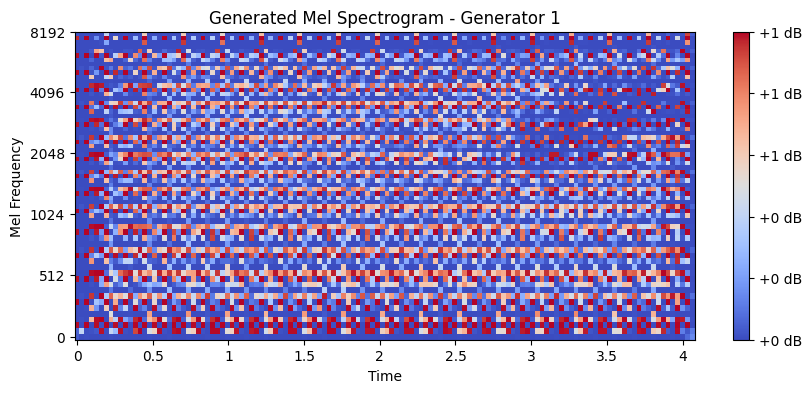

Generator 2 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3173


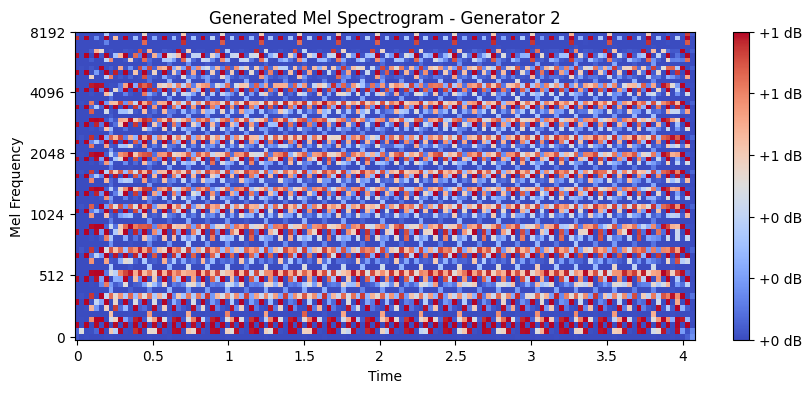

Generator 3 sample statistics:
  Min: 0.0000, Max: 1.0000, Mean: 0.3135


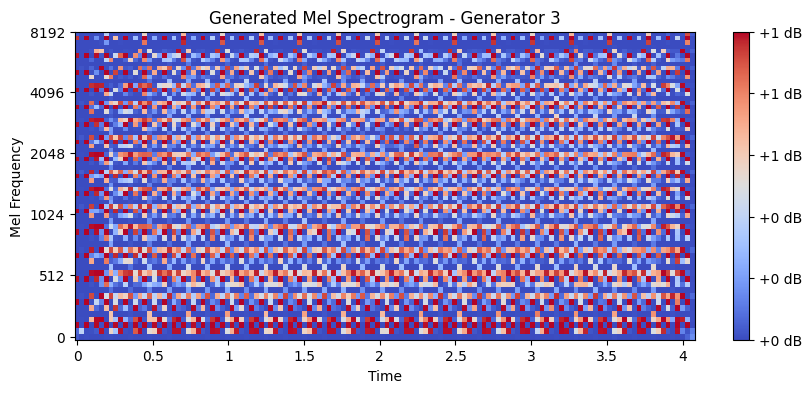

Real sample statistics:
  Min: -1.0000, Max: 1.0000, Mean: -0.4271


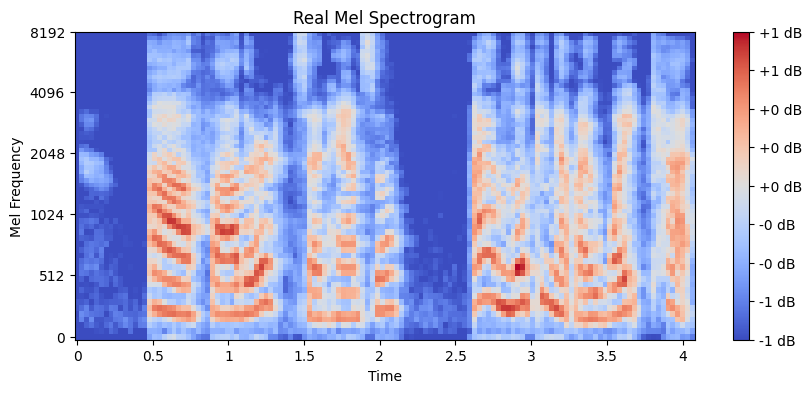

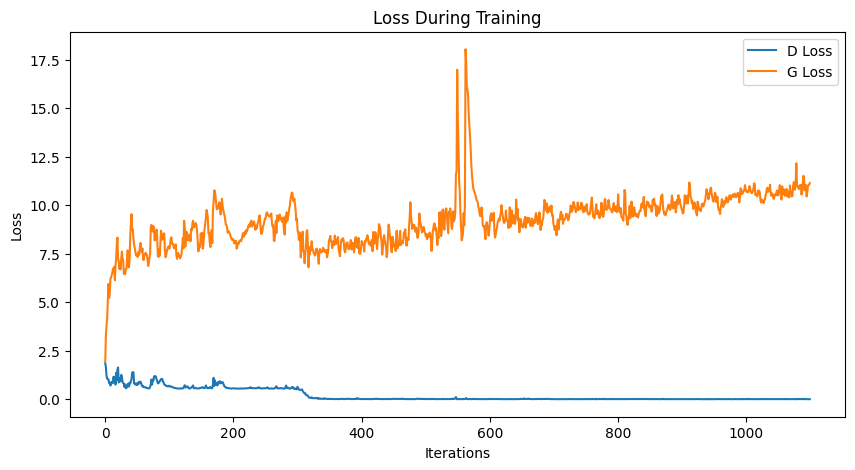

Training completed.


AttributeError: 'MGAN' object has no attribute 'state_dict'

In [5]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader
import glob

def main():
    # Hyperparameters
    num_z = 100
    beta = 0.5
    num_gens = 3  # Set number of generators to 3
    batch_size = 128  # Increase batch size to 128
    z_prior = "gaussian"
    learning_rate = 0.0002  # Increase learning rate
    num_epochs = 50

    # Spectrogram dimensions
    mel_bins = 64
    num_frames = 128
    num_channels = 1
    img_size = (mel_bins, num_frames, num_channels)

    # Set device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Dataset preprocessing
    data_dir = r'data/LibriSpeech/LibriSpeech/dev-clean'  # Use a larger dataset
    print("Preprocessing dataset into Mel spectrograms...")
    mel_dataset = librispeech_to_mel(data_dir, target_sr=16000, n_mels=mel_bins, target_length=num_frames)
    print(f"Total number of training samples: {len(mel_dataset)}")

    # DataLoader
    dataloader = DataLoader(mel_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    if len(mel_dataset) == 0:
        raise ValueError("The dataset is empty. Please check your data directory and preprocessing function.")

    # Initialize MGAN
    mgan_model = MGAN(
        num_z=num_z,
        beta=beta,
        num_gens=num_gens,
        batch_size=batch_size,
        z_prior=z_prior,
        learning_rate=learning_rate,
        num_epochs=num_epochs,
        img_size=img_size,
        num_gen_feature_maps=64,
        num_dis_feature_maps=64,
        sample_dir="samples",
        device=device
    )

    # Train the model
    print("Starting training...")
    mgan_model.fit(dataloader)
    print("Training completed.")
    torch.save(mgan_model.state_dict(), "mgan_model.pth")
    print("Model saved to mgan_model.pth")


if __name__ == "__main__":
    main()


